In [ ]:
# AUTO_BOOTSTRAP_V2
from pathlib import Path
import sys
import os
import builtins
import numpy as np
import pandas as pd

ROOT = Path.cwd()
if not (ROOT / "projects").exists():
    cur = Path.cwd().resolve()
    for p in [cur] + list(cur.parents):
        if (p / "projects").exists():
            ROOT = p
            break

NB_PATH = Path.cwd()
if "clone_motif" in str(NB_PATH):
    PROJECT_DIR = ROOT / "projects" / "clone_motif"
else:
    PROJECT_DIR = ROOT / "projects" / "our_multiregion_motif"

DATA_RAW = PROJECT_DIR / "data" / "raw"
DATA_PROCESSED = PROJECT_DIR / "data" / "processed"
OUT_FIG = PROJECT_DIR / "outputs" / "figures"
OUT_TABLE = PROJECT_DIR / "outputs" / "tables"
OUT_ARCH = PROJECT_DIR / "outputs" / "archives"

for d in [DATA_PROCESSED, OUT_FIG, OUT_TABLE, OUT_ARCH]:
    d.mkdir(parents=True, exist_ok=True)

SHARED_SRC = ROOT / "projects" / "shared" / "src"
if str(SHARED_SRC) not in sys.path:
    sys.path.append(str(SHARED_SRC))

from motif_common import combination, indices_for_region, union_indices_for_regions, p_to_star, format_p_decimal_3sig, sort_by_order, truncate_colormap

READ_EXT = {".csv", ".json", ".npy", ".pkl", ".xlsx"}
FIG_EXT = {".svg", ".png", ".pdf"}
TABLE_EXT = {".csv", ".xlsx"}


def _as_path(x):
    return Path(x) if isinstance(x, (str, os.PathLike)) else x


def resolve_read_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute() or p.exists():
        return str(p)
    if p.suffix.lower() in READ_EXT:
        for c in [DATA_RAW / p.name, ROOT / p.name]:
            if c.exists():
                return str(c)
    return str(p)


def resolve_write_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute():
        p.parent.mkdir(parents=True, exist_ok=True)
        return str(p)
    ext = p.suffix.lower()
    if ext in FIG_EXT:
        out = OUT_FIG / p.name
    elif ext in TABLE_EXT:
        out = OUT_TABLE / p.name
    elif ext == ".zip":
        out = OUT_ARCH / p.name
    elif ext == ".npy":
        out = DATA_PROCESSED / p.name
    else:
        out = PROJECT_DIR / p
    out.parent.mkdir(parents=True, exist_ok=True)
    return str(out)

if not hasattr(builtins, "_orig_open_codex"):
    builtins._orig_open_codex = builtins.open


def _open_patch(file, mode="r", *args, **kwargs):
    if isinstance(file, (str, os.PathLike)):
        if any(m in mode for m in ["r", "a"]):
            file = resolve_read_path(file)
        if any(m in mode for m in ["w", "a", "x"]):
            file = resolve_write_path(file)
    return builtins._orig_open_codex(file, mode, *args, **kwargs)


builtins.open = _open_patch

if not hasattr(np, "_orig_load_codex"):
    np._orig_load_codex = np.load
np.load = lambda file, *a, **k: np._orig_load_codex(resolve_read_path(file), *a, **k)

if not hasattr(np, "_orig_save_codex"):
    np._orig_save_codex = np.save
np.save = lambda file, arr, *a, **k: np._orig_save_codex(resolve_write_path(file), arr, *a, **k)

if not hasattr(pd, "_orig_read_csv_codex"):
    pd._orig_read_csv_codex = pd.read_csv
pd.read_csv = lambda f, *a, **k: pd._orig_read_csv_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd, "_orig_read_excel_codex"):
    pd._orig_read_excel_codex = pd.read_excel
pd.read_excel = lambda f, *a, **k: pd._orig_read_excel_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd.DataFrame, "_orig_to_csv_codex"):
    pd.DataFrame._orig_to_csv_codex = pd.DataFrame.to_csv


def _to_csv_patch(self, path_or_buf=None, *args, **kwargs):
    if isinstance(path_or_buf, (str, os.PathLike)):
        path_or_buf = resolve_write_path(path_or_buf)
    return pd.DataFrame._orig_to_csv_codex(self, path_or_buf, *args, **kwargs)


pd.DataFrame.to_csv = _to_csv_patch

if not hasattr(pd.DataFrame, "_orig_to_excel_codex"):
    pd.DataFrame._orig_to_excel_codex = pd.DataFrame.to_excel


def _to_excel_patch(self, excel_writer, *args, **kwargs):
    if isinstance(excel_writer, (str, os.PathLike)):
        excel_writer = resolve_write_path(excel_writer)
    return pd.DataFrame._orig_to_excel_codex(self, excel_writer, *args, **kwargs)


pd.DataFrame.to_excel = _to_excel_patch

try:
    import matplotlib.pyplot as plt
    if not hasattr(plt, "_orig_savefig_codex"):
        plt._orig_savefig_codex = plt.savefig
    plt.savefig = lambda f, *a, **k: plt._orig_savefig_codex(resolve_write_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)
except Exception:
    pass

print(f"[bootstrap] project={PROJECT_DIR.name} data={DATA_RAW}")


In [1]:
import pickle
import numpy as np

pkl_path = "wb_alltype_sc_results_dict_merged_with_motif_ER_mc.pkl"

with open(pkl_path, "rb") as f:
    d = pickle.load(f)

results = d["results"]

for param, res_param in results.items():
    for region, info in res_param.items():
        if region == "SSp":
            continue   # SSp 不计算，其它都算

        motif_results = info["motif_results"]
        for thr, mr in motif_results.items():
            # ===== 真实 motif 计数 =====
            real = np.asarray(mr["real_motif"], dtype=float)
            if real.shape[0] == 14:
                real = real[1:]
            if real.shape[0] != 13:
                continue

            # ===== Monte Carlo & EQ 的 mu / sd =====
            mu_mc = np.asarray(mr["er_mu_mc"], dtype=float)
            sd_mc = np.asarray(mr["er_sd_mc"], dtype=float)
            mu_eq = np.asarray(mr["er_mu_eq"], dtype=float)
            sd_eq = np.asarray(mr["er_sd_eq"], dtype=float)

            if mu_mc.shape[0] == 14:
                mu_mc = mu_mc[1:]
                sd_mc = sd_mc[1:]
            if mu_eq.shape[0] == 14:
                mu_eq = mu_eq[1:]
                sd_eq = sd_eq[1:]

            if (
                mu_mc.shape[0] != 13 or sd_mc.shape[0] != 13 or
                mu_eq.shape[0] != 13 or sd_eq.shape[0] != 13
            ):
                continue

            # ===== 按维度选择 MC / EQ（motif 1–12）=====
            # mask_mc = (mu_mc != 0.0) | (sd_mc != 0.0)
            # mu = np.where(mask_mc, mu_mc, mu_eq)
            # sd = np.where(mask_mc, sd_mc, sd_eq)
            mu = mu_mc.copy()
            sd = sd_mc.copy()   
            
            # ===== motif 13（索引 12）强制用公式 EQ =====
            motif13_idx = 12  # 第 13 号 motif 的索引
            mu[motif13_idx] = mu_eq[motif13_idx]
            sd[motif13_idx] = sd_eq[motif13_idx]

            # ===== 检查 0：先做 warning，后面 ES 决定算不算 =====
            zero_real_idx = np.where(real == 0)[0]
            zero_mu_idx   = np.where(mu == 0)[0]
            zero_sd_idx   = np.where(sd == 0)[0]

            if len(zero_real_idx) or len(zero_mu_idx) or len(zero_sd_idx):
                print(f"[ZERO WARNING] param={param}, region={region}, thr={thr}")
                if len(zero_real_idx):
                    print("  real==0 at motifs:", zero_real_idx.tolist())
                if len(zero_mu_idx):
                    print("  mu==0   at motifs:", zero_mu_idx.tolist())
                if len(zero_sd_idx):
                    print("  sd==0   at motifs:", zero_sd_idx.tolist())

            # ===== 1) 原始 z-score & 二范数归一化（照常算） =====
            nz_raw = (real - mu) / sd
            nz_norm = nz_raw / np.linalg.norm(nz_raw)

            mr["NZ_raw"] = nz_raw
            mr["NZ"] = nz_norm

            # ===== 2) enrichment_score 规则：
            # 只要 real 或 mu 中有 0，整条 ES 不算，存 None
            if len(zero_real_idx) or len(zero_mu_idx):
                mr["ES_raw"] = None
                mr["ES"] = None
            else:
                es_raw = np.log2(real) / np.log2(mu)
                es_norm = es_raw / np.linalg.norm(es_raw)
                mr["ES_raw"] = es_raw
                mr["ES"] = es_norm

# ===== 删除每个 param 下面的 SSp 脑区 =====
for param, res_param in results.items():
    if "SSp" in res_param:
        del res_param["SSp"]

# ===== 保存新文件 =====
out_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
with open(out_path, "wb") as f:
    pickle.dump(d, f)

print("保存到:", out_path)

FileNotFoundError: [Errno 2] No such file or directory: 'wb_alltype_sc_results_dict_merged_with_motif_ER_mc.pkl'

/opt/miniconda3/envs/population_paper/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


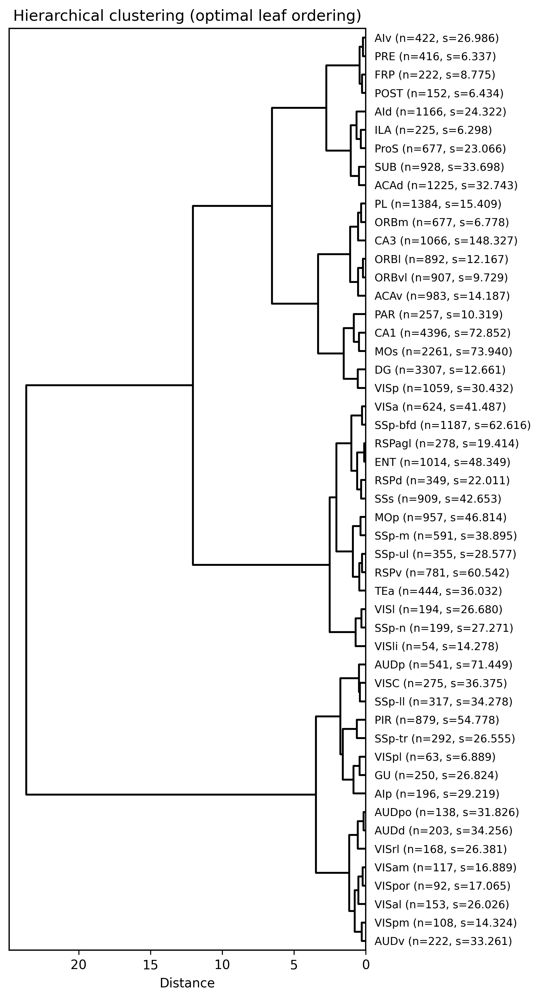

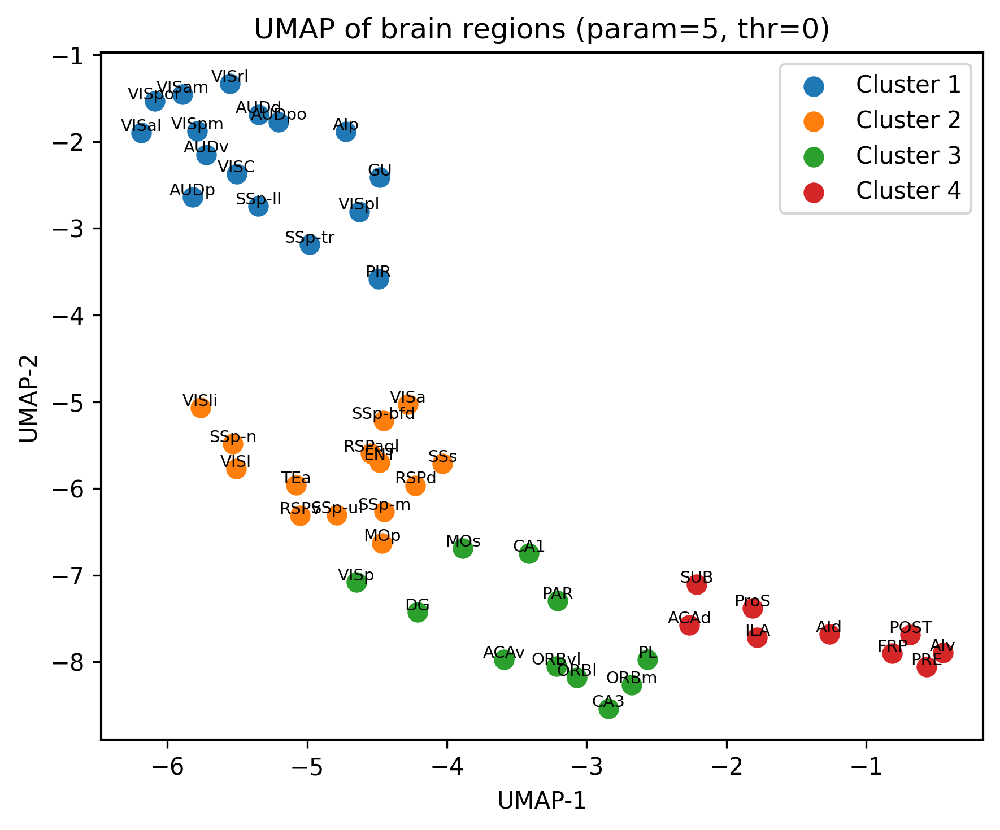

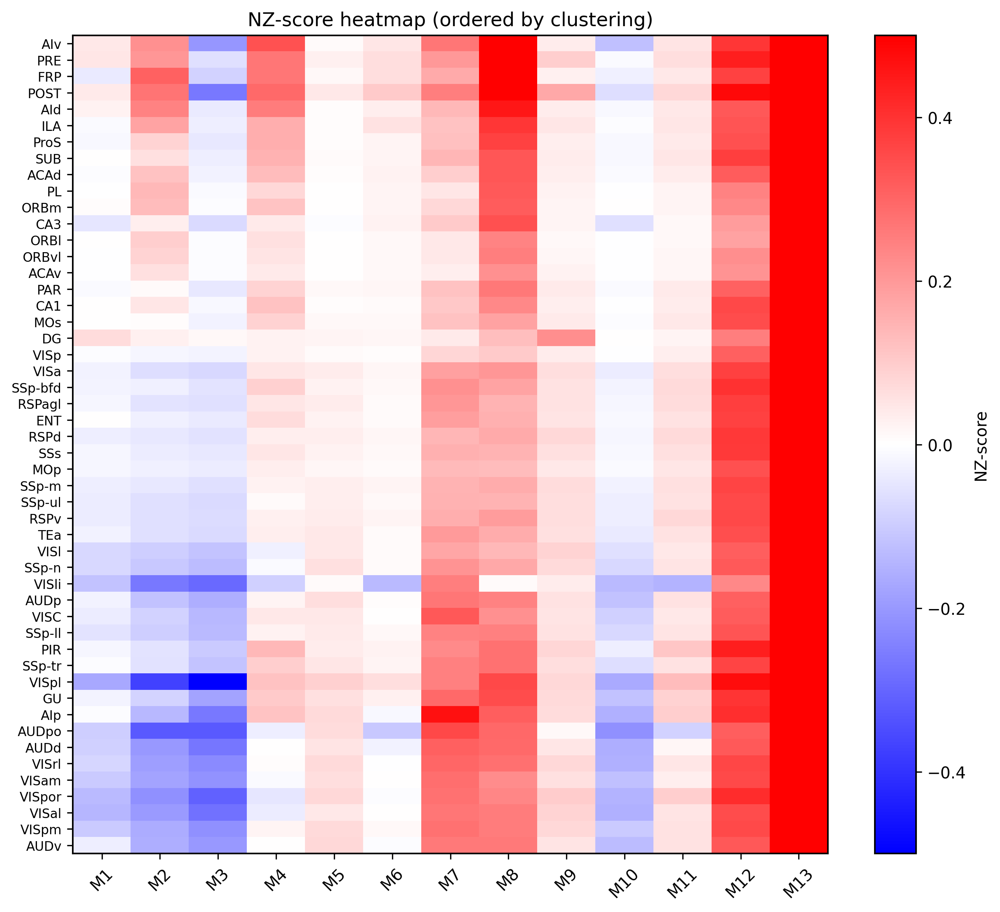

In [3]:
import pickle
import numpy as np
import umap
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, optimal_leaf_ordering, dendrogram, fcluster
from scipy.spatial.distance import pdist


import matplotlib as mpl

# ===== 提升整体分辨率 & 字体 =====
mpl.rcParams['figure.dpi'] = 300        # 屏幕显示分辨率
mpl.rcParams['savefig.dpi'] = 300       # 保存图片分辨率
mpl.rcParams['figure.figsize'] = (6, 4) # 默认图大小（你后面单独设 figsize 会覆盖它）
mpl.rcParams['font.size'] = 10          # 全局字号
mpl.rcParams['axes.linewidth'] = 1.0    # 坐标轴线条粗一点
mpl.rcParams['pdf.fonttype'] = 42       # 方便 AI / PPT 里编辑
mpl.rcParams['ps.fonttype'] = 42
# ==================== 1. 加载 & 提取数据 ====================
with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    data = pickle.load(f)["results"][5]

NZ, names, nodes, spars = [], [], [], []
for r, info in data.items():
    if r in {"SSp", "VPL","PERI","ECT","VPL","PO","PR"}: continue
    mr = info["motif_results"].get("0")
    if mr and (nz := np.asarray(mr["NZ"], float)).shape[0] == 13:
        names.append(r)
        NZ.append(nz)
        nodes.append(mr["node"])
        spars.append(mr["sparsity"])

NZ = np.vstack(NZ)
names = np.array(names)
nodes = np.array(nodes)
spars = np.array(spars, float)

# ==================== 2. UMAP + 聚类 + 排序顺序 ====================
emb = umap.UMAP(n_neighbors=15, min_dist=0.15, metric='cosine', random_state=1).fit_transform(NZ)
Z = optimal_leaf_ordering(linkage(emb, "ward"), pdist(emb))
labels = fcluster(Z, t=4, criterion="maxclust")

# 关键：先拿到排序顺序（这里反转让树顶在上）
order = dendrogram(Z, no_plot=True)["leaves"][::-1]

# 排序所有数据

# ==================== 图1：层次聚类树（叶子带 n 和 sparsity）================
plt.figure(figsize=(6, 11))

# 重点在这里：构造带信息的标签列表（已经按 order 排好）
rich_labels = [f"{r} (n={int(n)}, s={s:.3f})" for r,n,s in zip(names, nodes, (nodes-1)*spars)]

dendrogram(Z,
           orientation="left",
           labels=rich_labels,          # 改这里就行！
           leaf_font_size=8.5,
           color_threshold=0,
           above_threshold_color='k')
plt.title("Hierarchical clustering (optimal leaf ordering)")
plt.xlabel("Distance")
plt.tight_layout()
plt.savefig("1.hierarchical_clustering_dendrogram.svg", bbox_inches='tight',  dpi=300, transparent=True)
plt.show()

NZ, names, nodes, spars, labels, emb = map(sort_by_order, [NZ, names, nodes, spars, labels, emb])


# ==================== 图2：UMAP ====================
plt.figure(figsize=(6, 5))
for c in np.unique(labels):
    m = labels == c
    plt.scatter(emb[m, 0], emb[m, 1], label=f"Cluster {c}", s=60)
for (x, y), n in zip(emb, names):
    plt.text(x, y+0.02, n, fontsize=7, ha='center')
plt.legend()
plt.title("UMAP of brain regions (param=5, thr=0)")
plt.xlabel("UMAP-1"); plt.ylabel("UMAP-2")
plt.tight_layout(); 
plt.savefig("2.umap_brain_regions.svg", bbox_inches='tight',  dpi=300, transparent=True)

plt.show()

# ==================== 图3：热图 ====================
plt.figure(figsize=(9, 8))
im = plt.imshow(np.log10(1+5*NZ), aspect='auto', cmap='bwr', vmin=-0.5, vmax=0.5)
plt.colorbar(im, label="NZ-score")
plt.yticks(range(len(names)), names, fontsize=8)   # 这里也顺便统一用 rich_labels
plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)
plt.title("NZ-score heatmap (ordered by clustering)")
plt.tight_layout()
plt.savefig("3.nz_score_heatmap.svg", bbox_inches='tight',  dpi=300, transparent=True)
plt.show()





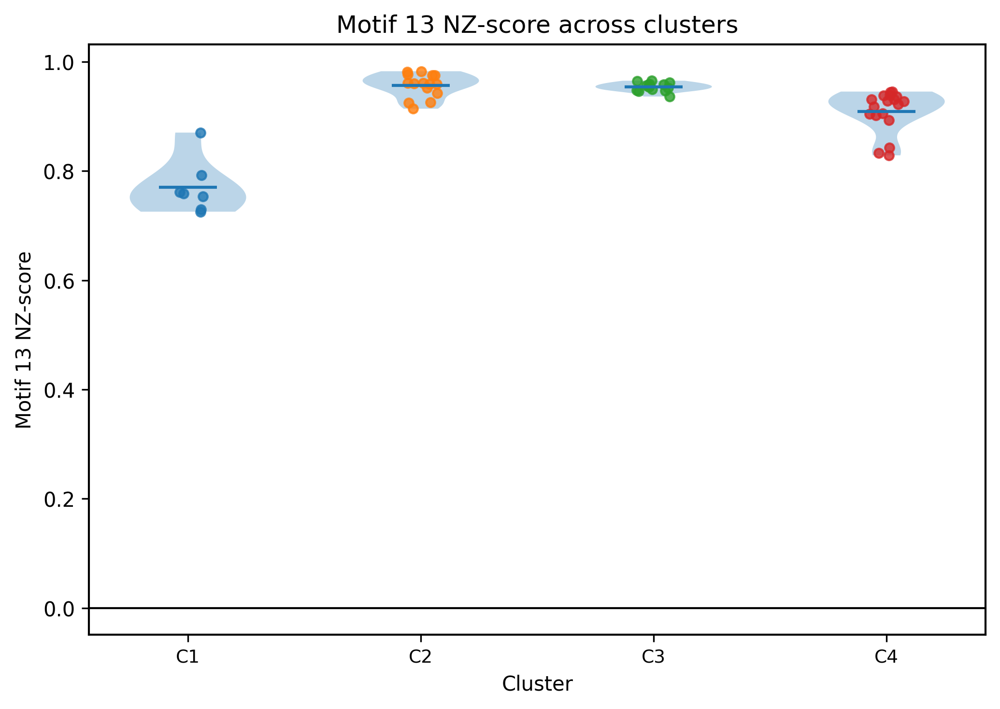

In [66]:
# ==================== 图4：Motif 13 NZ-score violin + 点（不标名字） ====================
motif13_idx = 12
m13 = NZ[:, motif13_idx]      # 每个脑区的 motif13 NZ-score

unique_clusters = np.unique(labels)
n_clust = len(unique_clusters)

# 按 cluster 收集数据
data_by_cluster = [m13[labels == c] for c in unique_clusters]

plt.figure(figsize=(7, 5))

# ---- 1) Violin 图 ----
parts = plt.violinplot(
    data_by_cluster,
    positions=np.arange(1, n_clust + 1),
    showmeans=True,
    showextrema=False,
    showmedians=False,
)

# ---- 2) 在每个 cluster 上叠加散点（不标名字） ----
for i, c in enumerate(unique_clusters, start=1):
    mask = (labels == c)
    m13_c = m13[mask]

    # 在 x 轴附近做一点左右抖动，避免完全重叠
    jitter = (np.random.rand(len(m13_c)) - 0.5) * 0.15   # 抖动范围可调
    x_pos = np.full(len(m13_c), i) + jitter

    plt.scatter(x_pos, m13_c, s=20, alpha=0.8)

# x 轴：cluster 编号
plt.xticks(
    np.arange(1, n_clust + 1),
    [f"C{int(c)}" for c in unique_clusters],
    fontsize=9,
)

plt.ylabel("Motif 13 NZ-score")
plt.xlabel("Cluster")
plt.title("Motif 13 NZ-score across clusters")

plt.axhline(0, color="k", lw=1)

plt.tight_layout()
plt.show()

In [20]:
NZ.shape

(54, 13)

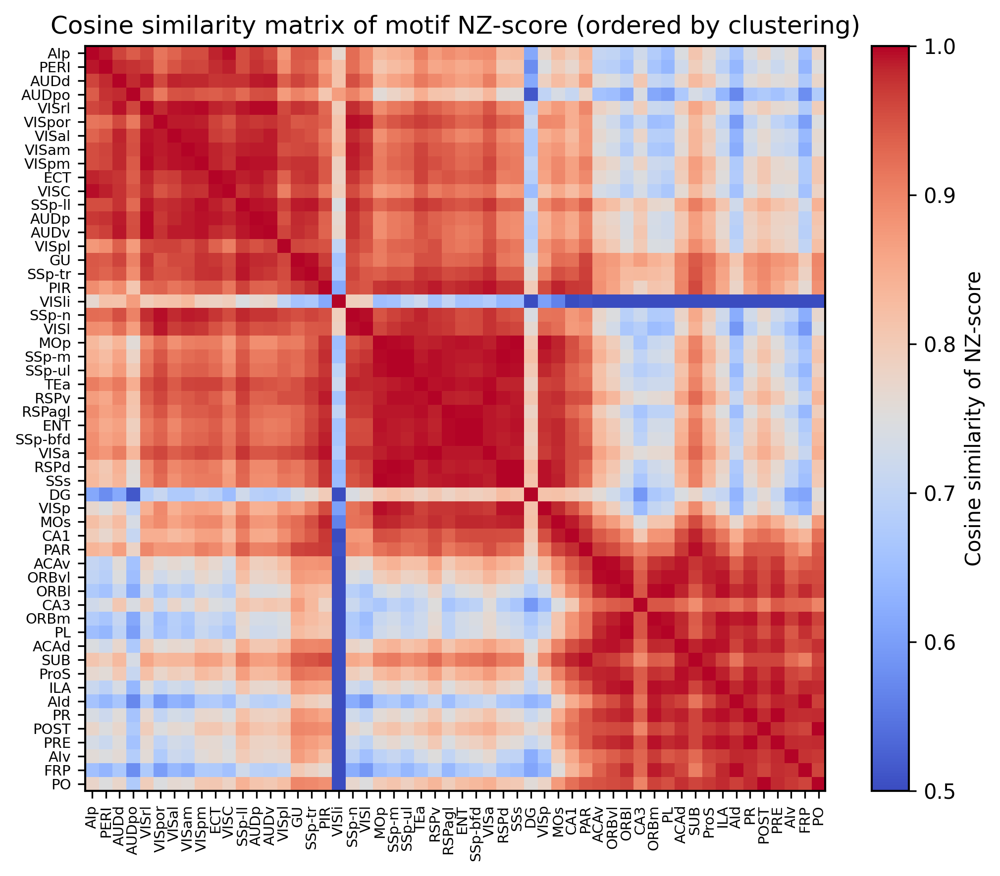

In [5]:
import numpy as np

# ===== 在你已有的 data 和 4 个 cluster_names 定义之后加这段 =====

all_clusters = {
    1: cluster1_names,
    2: cluster2_names,
    3: cluster3_names,
    4: cluster4_names,
}

def zero_row_col_ratio(sc, eps=0.0):
    """
    sc: (n, n) matrix
    eps: 允许把 |x| <= eps 当作 0（防止浮点噪声）
    """
    sc = np.asarray(sc, float)
    if sc.ndim != 2 or sc.shape[0] != sc.shape[1]:
        return None

    n = sc.shape[0]
    if n == 0:
        return (0, 0, 0.0, 0.0)

    # 判断“近似为 0”
    if eps > 0:
        is_zero = np.abs(sc) <= eps
    else:
        is_zero = (sc == 0)

    # 行全 0：该行所有元素都为 0
    zero_rows = np.all(is_zero, axis=1)
    # 列全 0：该列所有元素都为 0
    zero_cols = np.all(is_zero, axis=0)

    zr = int(zero_rows.sum())
    zc = int(zero_cols.sum())
    return zr, zc, zr / n, zc / n


print("===== Zero-row / Zero-col ratios in SC matrices (param=5) =====")

# 你可以把 eps 改成 1e-12 或 1e-9 视情况而定
EPS = 0.0

cluster_row_ratios = {cid: [] for cid in all_clusters}
cluster_col_ratios = {cid: [] for cid in all_clusters}

for cid, rlist in all_clusters.items():
    print(f"\n--- Cluster {cid} ---")
    for r in rlist:
        if r not in data:
            print(f"{r:10s} : [NOT FOUND in data]")
            continue
        info = data[r]
        if "sc" not in info:
            print(f"{r:10s} : [NO 'sc' key]")
            continue

        sc = np.asarray(info["sc"], float)
        out = zero_row_col_ratio(sc, eps=EPS)
        if out is None:
            print(f"{r:10s} : sc shape = {sc.shape} [NOT square]")
            continue

        zr, zc, zr_ratio, zc_ratio = out
        n = sc.shape[0]

        cluster_row_ratios[cid].append(zr_ratio)
        cluster_col_ratios[cid].append(zc_ratio)

        print(
            f"{r:10s} : sc={sc.shape} | "
            f"zero-rows {zr:3d}/{n} ({zr_ratio*100:5.1f}%) | "
            f"zero-cols {zc:3d}/{n} ({zc_ratio*100:5.1f}%)"
        )

# ===== 可选：按 cluster 做个简单汇总 =====
print("\n===== Cluster summary (mean ± std) =====")
for cid in sorted(all_clusters.keys()):
    rr = np.array(cluster_row_ratios[cid], float)
    cc = np.array(cluster_col_ratios[cid], float)
    if rr.size == 0:
        print(f"Cluster {cid}: no valid regions")
        continue
    print(
        f"Cluster {cid}: "
        f"zero-row% = {rr.mean()*100:.2f} ± {rr.std(ddof=1)*100 if rr.size>1 else 0:.2f}, "
        f"zero-col% = {cc.mean()*100:.2f} ± {cc.std(ddof=1)*100 if cc.size>1 else 0:.2f}"
    )

===== Zero-row / Zero-col ratios in SC matrices (param=5) =====

--- Cluster 1 ---
FRP        : sc=(222, 222) | zero-rows  20/222 (  9.0%) | zero-cols 169/222 ( 76.1%)
PL         : sc=(1384, 1384) | zero-rows  73/1384 (  5.3%) | zero-cols 1226/1384 ( 88.6%)
ILA        : sc=(225, 225) | zero-rows  67/225 ( 29.8%) | zero-cols 186/225 ( 82.7%)
AId        : sc=(1166, 1166) | zero-rows  78/1166 (  6.7%) | zero-cols 895/1166 ( 76.8%)
AIv        : sc=(422, 422) | zero-rows  25/422 (  5.9%) | zero-cols 240/422 ( 56.9%)
ACAd       : sc=(1225, 1225) | zero-rows  36/1225 (  2.9%) | zero-cols 873/1225 ( 71.3%)
ACAv       : sc=(983, 983) | zero-rows  97/983 (  9.9%) | zero-cols 816/983 ( 83.0%)
ORBl       : sc=(892, 892) | zero-rows  98/892 ( 11.0%) | zero-cols 770/892 ( 86.3%)
ORBvl      : sc=(907, 907) | zero-rows 110/907 ( 12.1%) | zero-cols 796/907 ( 87.8%)
ORBm       : sc=(677, 677) | zero-rows 193/677 ( 28.5%) | zero-cols 612/677 ( 90.4%)
MOs        : sc=(2261, 2261) | zero-rows  43/2261 (  1

/opt/miniconda3/envs/population_paper/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


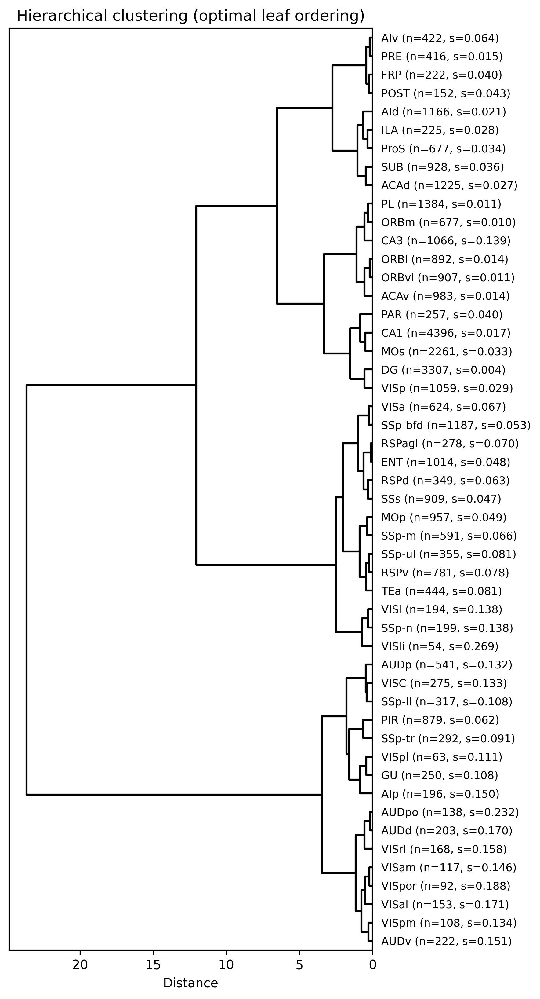

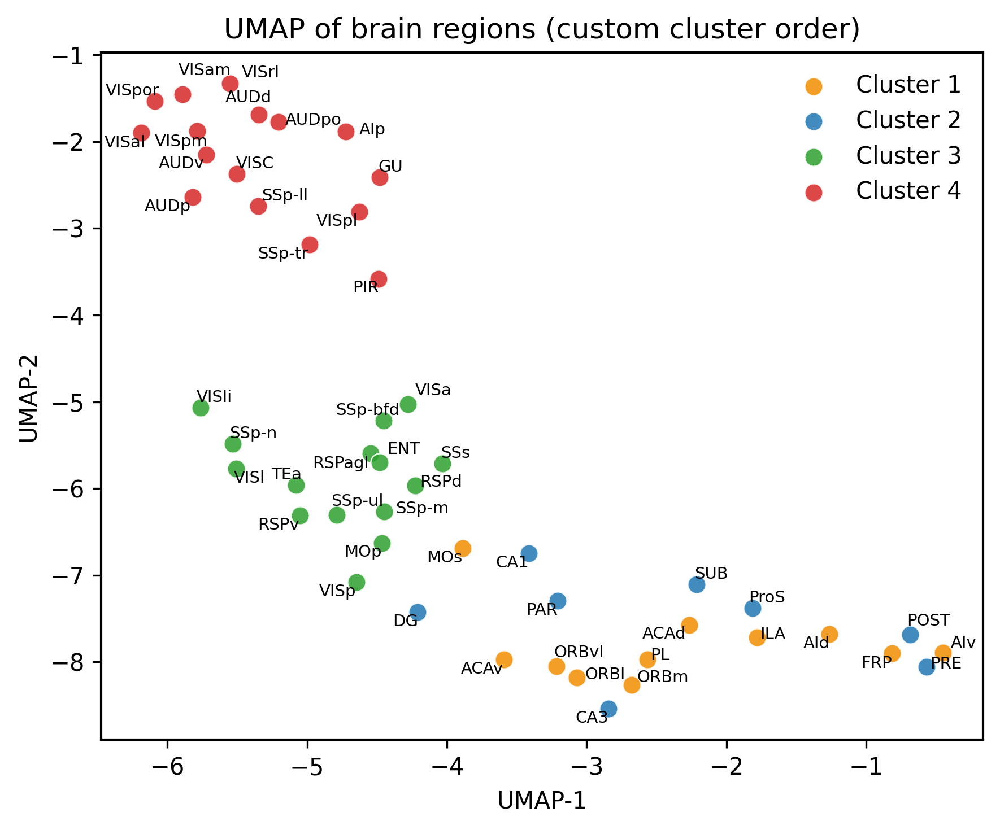

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_51601/2328545693.py:229: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect='auto', cmap='bwr', vmin=-1, vmax=1)


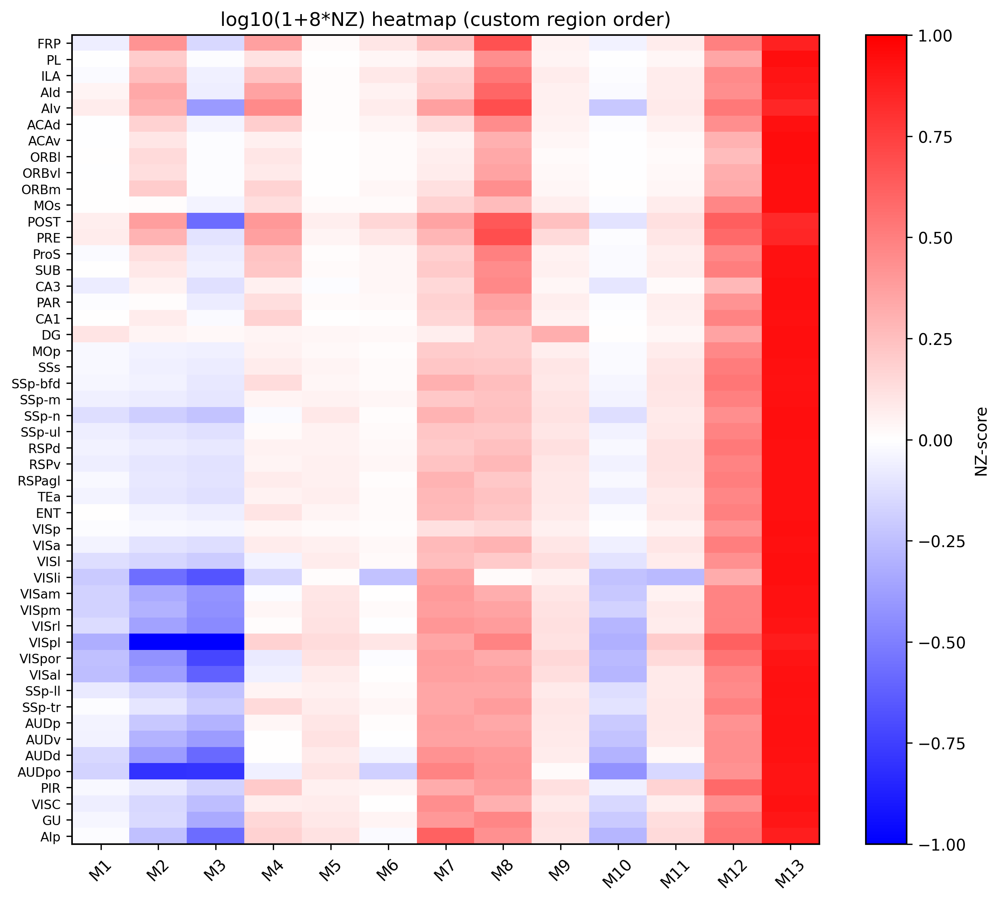

In [1]:
import pickle
import numpy as np
import umap
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, optimal_leaf_ordering, dendrogram
from scipy.spatial.distance import pdist

import matplotlib as mpl

# ===== 提升整体分辨率 & 字体 =====
mpl.rcParams['figure.dpi'] = 300        # 屏幕显示分辨率
mpl.rcParams['savefig.dpi'] = 300       # 保存图片分辨率
mpl.rcParams['figure.figsize'] = (6, 4)
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# ==================== 1. 加载 & 提取数据 ====================
with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    data = pickle.load(f)["results"][5]

NZ, names, nodes, spars = [], [], [], []
for r, info in data.items():
    # 过滤掉不用的区域
    if r in {"SSp", "VPL", "PERI", "ECT", "PO", "PR"}:
        continue
    mr = info["motif_results"].get("0")
    if mr and (nz := np.asarray(mr["NZ"], float)).shape[0] == 13:
        names.append(r)
        NZ.append(nz)
        nodes.append(mr["node"])
        spars.append(mr["sparsity"])

NZ = np.vstack(NZ)
names = np.array(names)
nodes = np.array(nodes)
spars = np.array(spars, float)

# ==================== 2. UMAP + 聚类（这里只用来算 Z）====================
emb = umap.UMAP(
    n_neighbors=15,
    min_dist=0.15,
    metric='cosine',
    random_state=1
).fit_transform(NZ)

Z = optimal_leaf_ordering(linkage(emb, "ward"), pdist(emb))

# ========== 图1：层次聚类树（仍然用自动的叶子顺序，只用来看层次结构）==========
plt.figure(figsize=(6, 11))

rich_labels = [f"{r} (n={int(n)}, s={s:.3f})" for r, n, s in zip(names, nodes, spars)]

dendrogram(
    Z,
    orientation="left",
    labels=rich_labels,
    leaf_font_size=8.5,
    color_threshold=0,
    above_threshold_color='k'
)

plt.title("Hierarchical clustering (optimal leaf ordering)")
plt.xlabel("Distance")
plt.tight_layout()
plt.savefig("1.hierarchical_clustering_dendrogram.svg",
            bbox_inches='tight', dpi=300, transparent=True)
plt.show()

# ==================== 3. 按你给的 cluster 顺序重排 ====================

# ---- 你给的 4 个 cluster 顺序 ----
cluster1_names = [
    "FRP",
    "PL",
    "ILA",
    "AId",
    "AIv",
    "ACAd",
    "ACAv",
    "ORBl",
    "ORBvl",
    "ORBm",
    "MOs",
]

cluster2_names = [
    "POST",
    "PRE",
    "ProS",
    "SUB",
    "CA3",
    "PAR",
    "CA1",
    "DG",
]

cluster3_names = [
    "MOp",
    "SSs",
    "SSp-bfd",
    "SSp-m",
    "SSp-n",
    "SSp-ul",
    "RSPd",
    "RSPv",
    "RSPagl",
    "TEa",
    "ENT",
    "VISp",
    "VISa",
    "VISl",
    "VISli",
]

cluster4_names = [
    "VISam",
    "VISpm",
    "VISrl",
    "VISpl",
    "VISpor",
    "VISal",
    "SSp-ll",
    "SSp-tr",
    "AUDp",
    "AUDv",
    "AUDd",
    "AUDpo",
    "PIR",
    "VISC",
    "GU",
    "AIp",
]

# 合并成一个总顺序
custom_order_names = (
    cluster1_names +
    cluster2_names +
    cluster3_names +
    cluster4_names
)

# 建一个 name -> index 映射
name_to_idx = {r: i for i, r in enumerate(names)}

# 检查一下是否有名字对不上
missing = [r for r in custom_order_names if r not in name_to_idx]
extra   = [r for r in names if r not in custom_order_names]

if missing:
    print("[WARN] 这些区域在数据里找不到，会被忽略:", missing)
if extra:
    print("[WARN] 数据里还有这些区域不在你给的顺序里，会按原顺序附加在最后:", extra)

# 先按照你给的顺序挑出确实存在的
ordered_names_list = [r for r in custom_order_names if r in name_to_idx]
# 再把剩下的（如果有的话）按原顺序放在最后
ordered_names_list += [r for r in names if r not in ordered_names_list]

# 这就是你后续要用的“统一顺序”（按名字）
region_order = ordered_names_list  # <-- 以后你可以直接用这个 list

# 把它转换成索引顺序
order = np.array([name_to_idx[r] for r in region_order], dtype=int)


# 自定义 cluster 标签（1~4），按名字映射
name_to_cluster = {}
for r in cluster1_names:
    name_to_cluster[r] = 1
for r in cluster2_names:
    name_to_cluster[r] = 2
for r in cluster3_names:
    name_to_cluster[r] = 3
for r in cluster4_names:
    name_to_cluster[r] = 4

# 对没有出现在 4 个列表里的（如果有），给个 0 类
labels = np.array([name_to_cluster.get(r, 0) for r in names])

# 按新顺序重排所有数组
NZ     = sort_by_order(NZ)
names  = sort_by_order(names)
nodes  = sort_by_order(nodes)
spars  = sort_by_order(spars)
labels = sort_by_order(labels)
emb    = sort_by_order(emb)

# ==================== 图2：UMAP ====================
from adjustText import adjust_text
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(6, 5))


colors = ["#F18D00","#1f77b4","#2ca02c","#d62728"]
for c in sorted(np.unique(labels)):
    lab = "Unassigned" if c == 0 else f"Cluster {c}"
    m = labels == c
    plt.scatter(emb[m, 0], emb[m, 1], label=lab, s=60, c=colors[c-1] ,alpha=0.85, edgecolors="white", linewidths=0.6)

texts = []
for (x, y), n in zip(emb, names):
    texts.append(plt.text(x, y, n, fontsize=7, ha="center", va="center"))

adjust_text(
    texts,
    x=emb[:, 0], y=emb[:, 1],
    expand_points=(1.2, 1.4),
    expand_text=(1.2, 1.4),
    force_points=0.15,
    force_text=0.25,
    # arrowprops=dict(arrowstyle='-', lw=0.4, color='0.4', alpha=0.7),
)

plt.legend(frameon=False)
plt.title("UMAP of brain regions (custom cluster order)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.savefig("Fig s4b.svg", bbox_inches="tight", dpi=300, transparent=True)
plt.show()
# ==================== 图3：NZ-score 热图 ====================
plt.figure(figsize=(9, 8))
im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect='auto', cmap='bwr', vmin=-1, vmax=1)
plt.colorbar(im, label="NZ-score")

# y 轴用当前 names（已经是按你给的顺序排好的）
plt.yticks(range(len(names)), names, fontsize=8)
plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)
plt.title("log10(1+8*NZ) heatmap (custom region order)")
plt.tight_layout()
plt.savefig("3.nz_score_heatmap.svg",
            bbox_inches='tight', dpi=300, transparent=True)
plt.show()

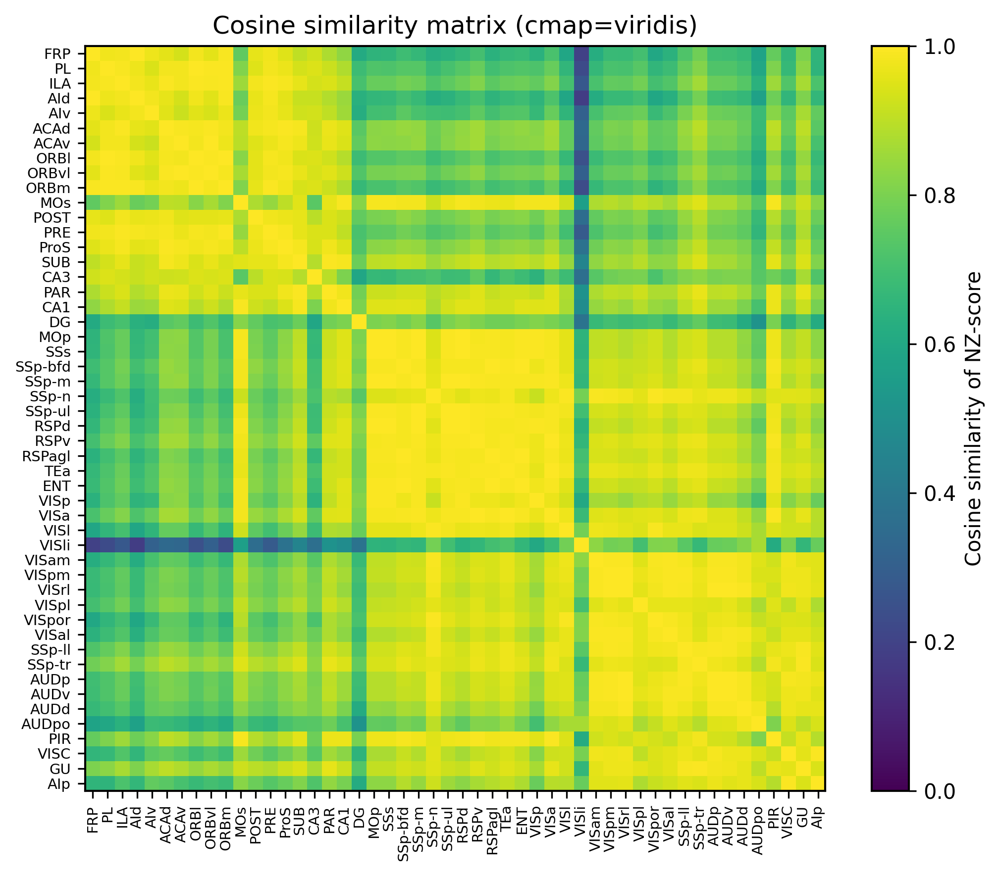

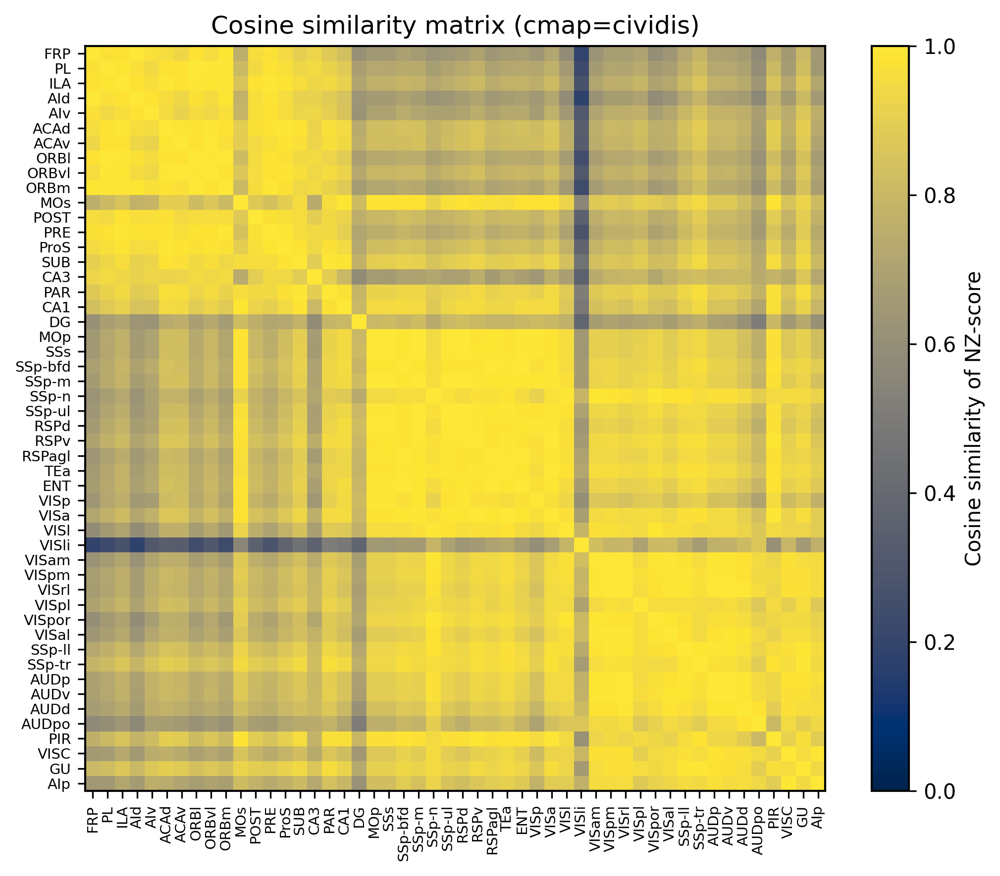

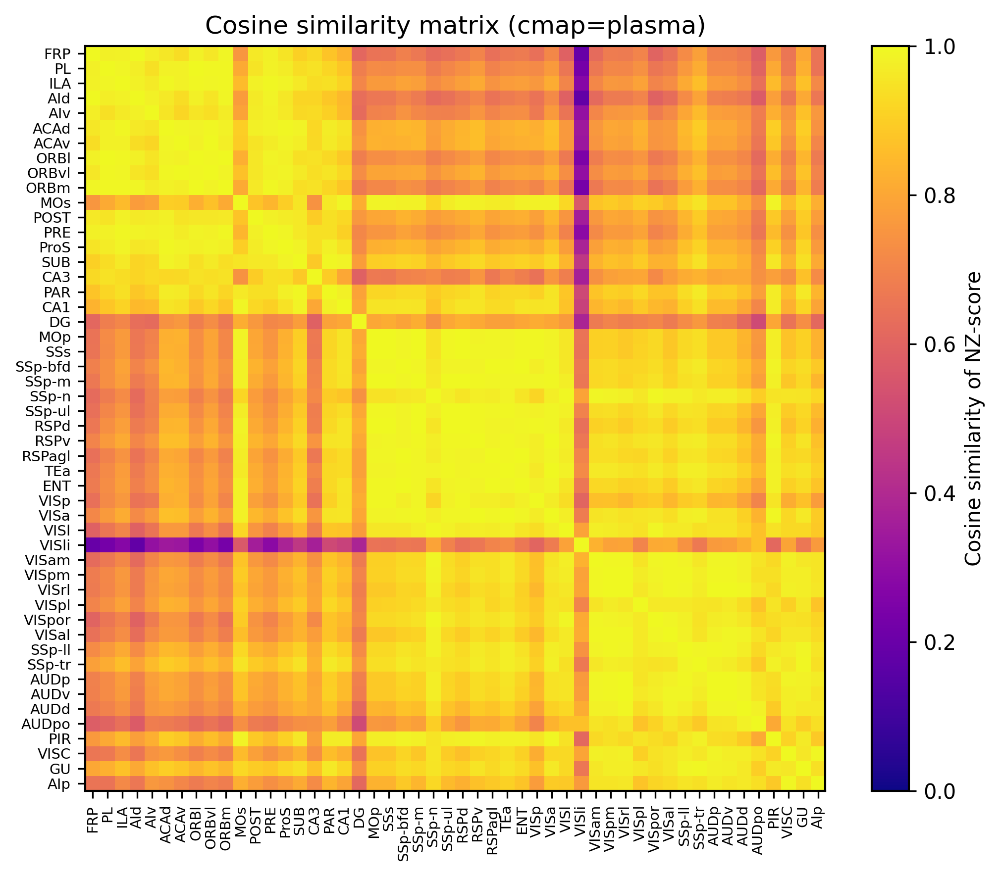

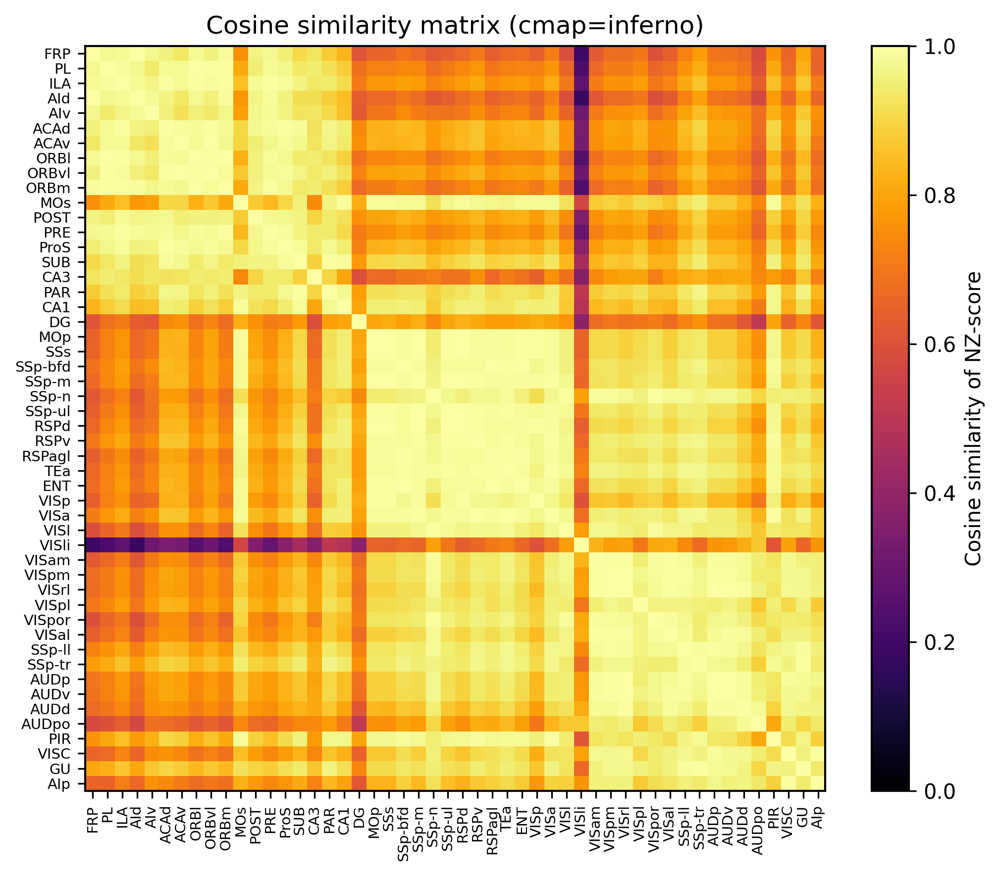

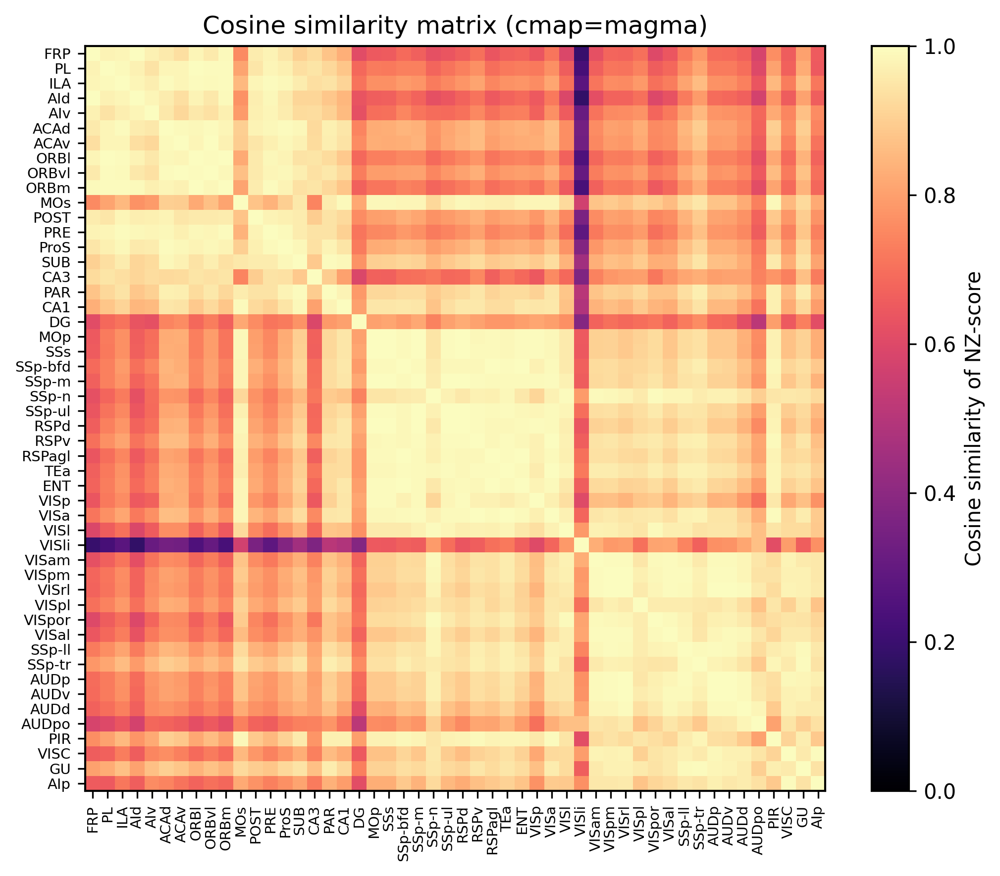

...

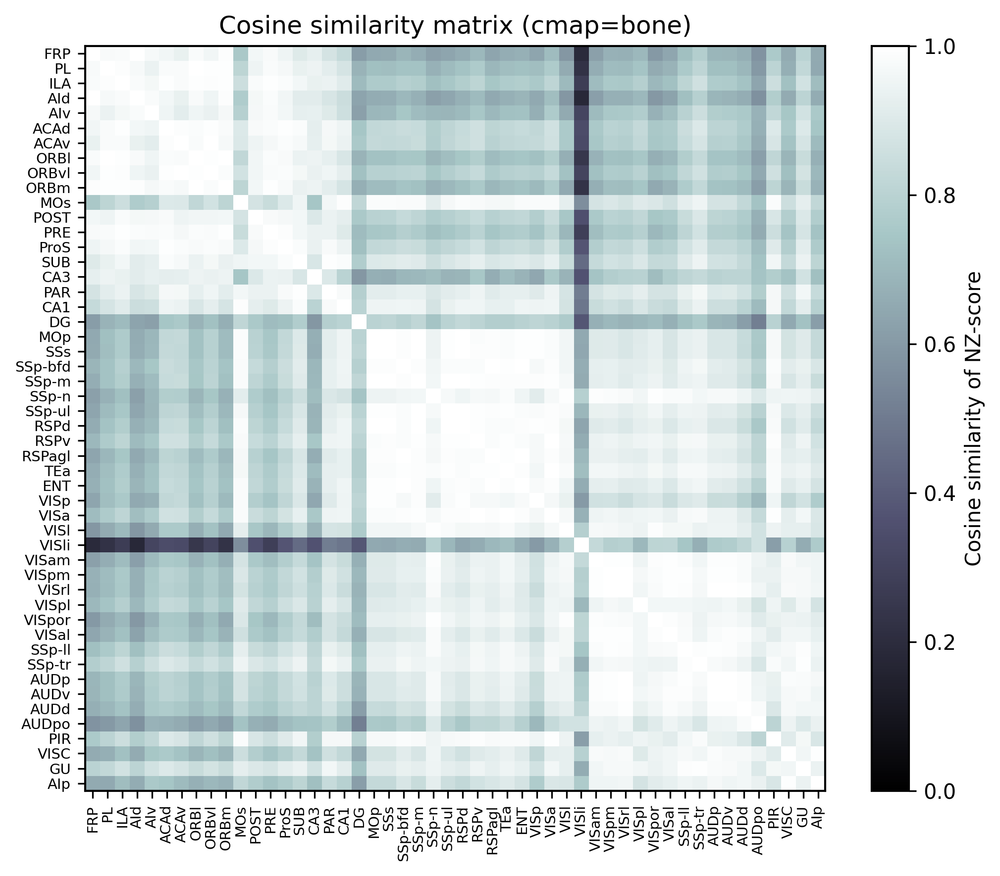

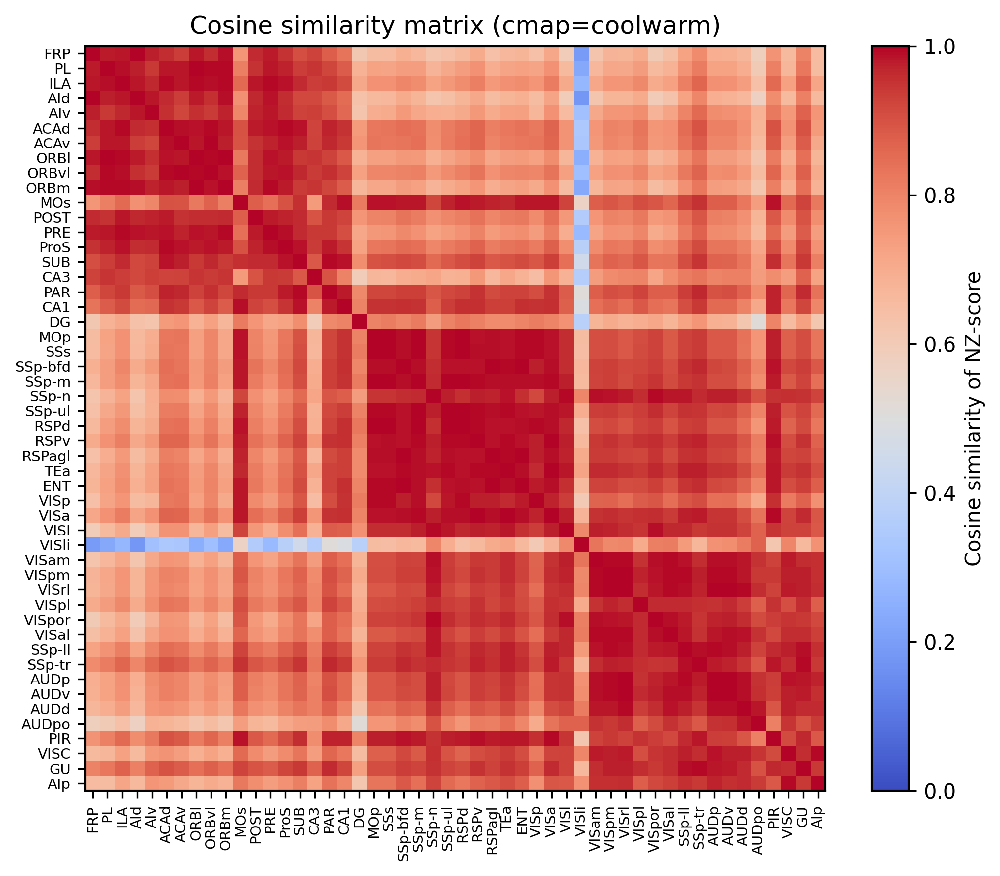

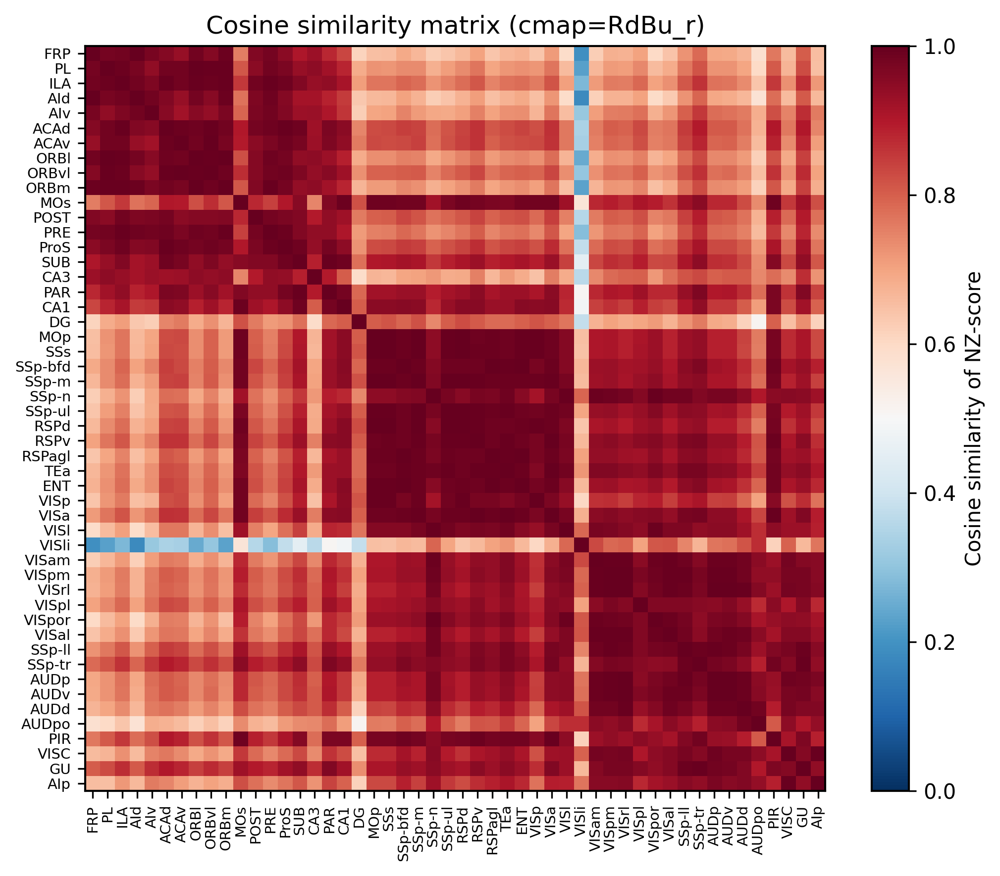

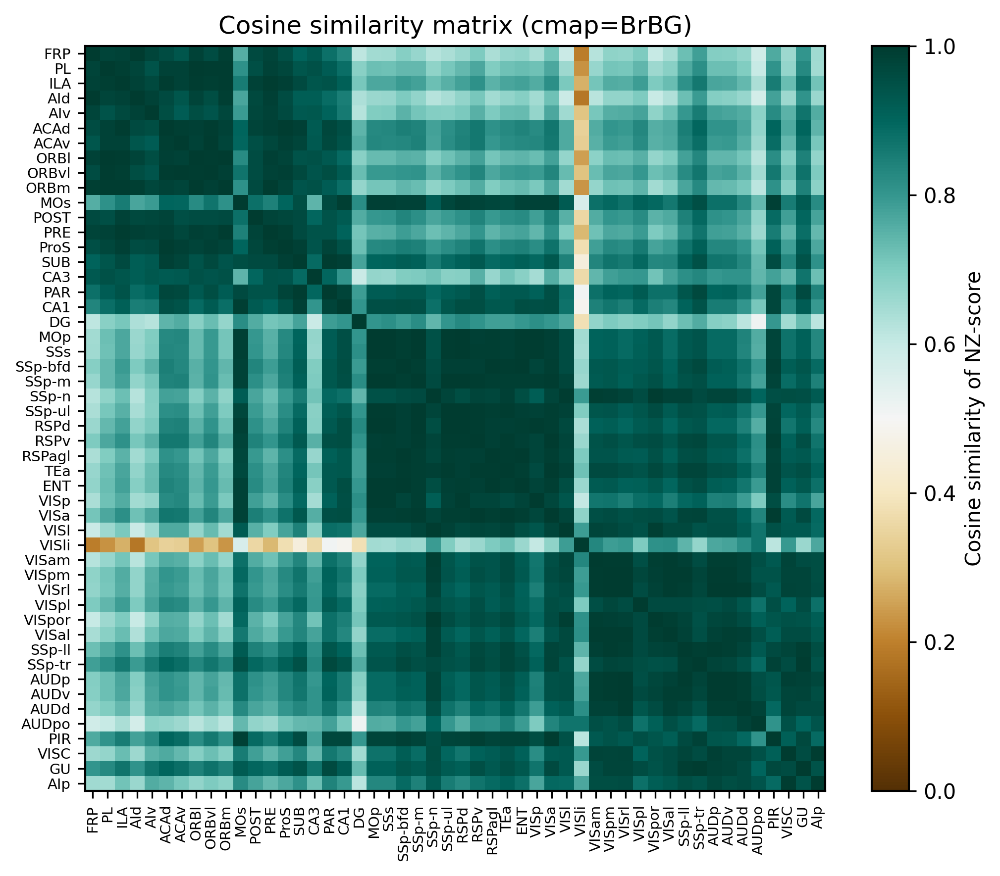

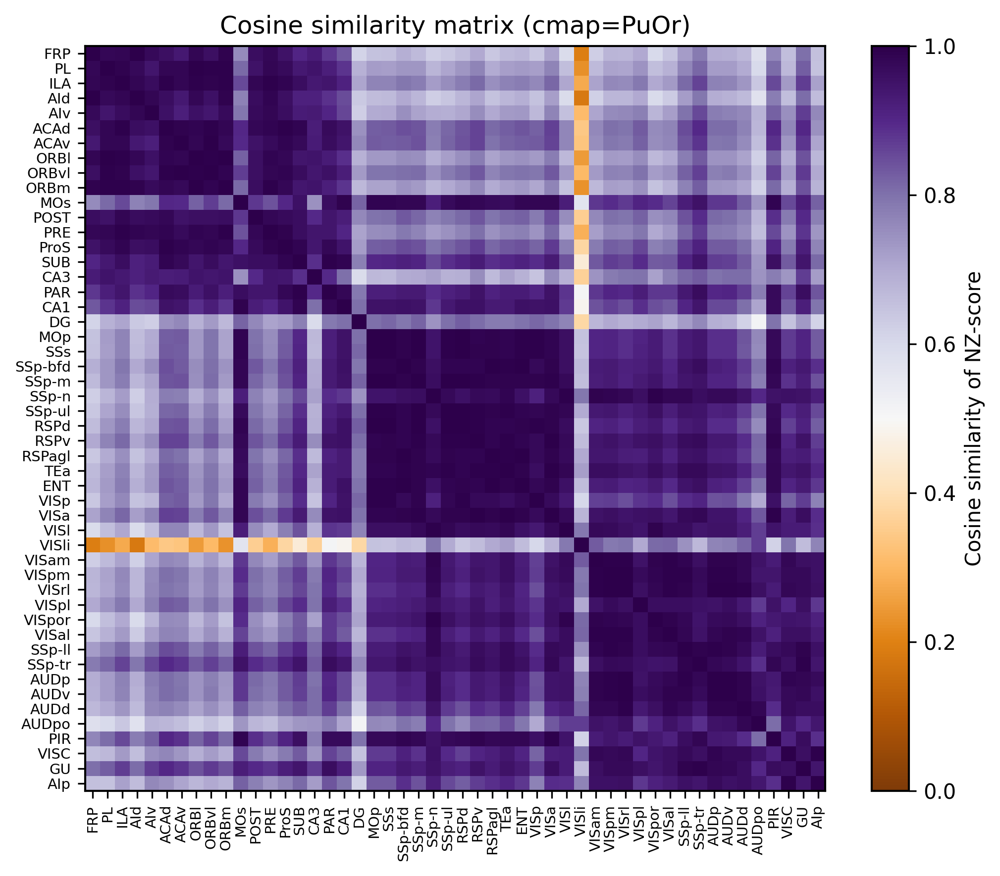

In [3]:
# ==================== 图1.5：NZ-score 余弦相似度矩阵 ====================
# NZ 已经是排好序的 (n_region, 13)，而且每行是 L2 归一化过的
# 余弦相似度 = 向量点积
# 只用前 12 个 motif 计算余弦相似度
X = NZ[:, :12]                                # (n_region, 12)
norms = np.linalg.norm(X, axis=1, keepdims=True)  # 每个脑区的 12 维范数
X_norm = X / norms                            # 行归一化到 L2=1

cos_sim = X_norm @ X_norm.T                  # (n_region, n_region)，真正的 cosine similarity
cmaps = [
    # perceptually uniform
    "viridis","cividis","plasma","inferno","magma","cubehelix",
    # restrained sequential
    "Blues","YlGnBu","PuBuGn","Purples","Greens","OrRd","YlOrBr","BuPu",
    # high-contrast / heat-ish
    "turbo","hot","afmhot","gist_heat","bone",
    # diverging (optional)
    "coolwarm","RdBu_r","BrBG","PuOr",
]
for cmap in cmaps:
    plt.figure(figsize=(7, 6))
    im = plt.imshow(cos_sim, aspect="auto", cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im, label="Cosine similarity of NZ-score")
    plt.xticks(range(len(names)), names, rotation=90, fontsize=7)
    plt.yticks(range(len(names)), names, fontsize=7)
    plt.title(f"Cosine similarity matrix (cmap={cmap})")
    plt.tight_layout()
    plt.savefig(f"4.cosine_similarity_matrix_{cmap}.svg", bbox_inches="tight", dpi=300, transparent=True)
    plt.show()

In [ ]:
np.log10(1+8*NZ)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

unique_clusters = np.unique(labels)
n_clust = len(unique_clusters)
colors = plt.cm.tab10(np.arange(n_clust) % 10)  # 每个 cluster 一个颜色

motif_groups = [
    (list(range(0, 4)),  "Motifs 1–4"),
    (list(range(4, 8)),  "Motifs 5–8"),
    (list(range(8, 13)), "Motifs 9–13"),
]

for idx_group, (motif_idx_list, title_group) in enumerate(motif_groups, 1):
    n_motifs = len(motif_idx_list)
    n_cols = 2
    n_rows = int(np.ceil(n_motifs / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

    for k, j in enumerate(motif_idx_list):
        row = k // n_cols
        col = k % n_cols
        ax = axes[row, col]

        vals = NZ[:, j]  # 该 motif 的 NZ-score，所有脑区
        data_by_cluster = [vals[labels == c] for c in unique_clusters]

        # violin
        parts = ax.violinplot(
            data_by_cluster,
            positions=np.arange(1, n_clust + 1),
            showmeans=True,
            showextrema=False,
            showmedians=False,
        )

        # 统一 violin 颜色：每个 cluster 一个颜色
        for body, col_c in zip(parts['bodies'], colors):
            body.set_facecolor(col_c)
            body.set_edgecolor(col_c)
            body.set_alpha(0.5)

        # 在每个 cluster 上叠点，颜色与对应的 violin 一致
        for i, c in enumerate(unique_clusters, start=1):
            mask = (labels == c)
            vals_c = vals[mask]
            jitter = (np.random.rand(len(vals_c)) - 0.5) * 0.15
            x_pos = np.full(len(vals_c), i) + jitter
            ax.scatter(x_pos, vals_c, s=15, alpha=0.9, color=colors[i-1])

        ax.set_xticks(np.arange(1, n_clust + 1))
        ax.set_xticklabels([f"C{int(c)}" for c in unique_clusters], fontsize=9)
        ax.axhline(0, color="k", lw=1)
        ax.set_ylabel("NZ-score")
        ax.set_title(f"Motif {j+1}")

    # 把多出来的空 subplot 删掉
    for k in range(n_motifs, n_rows * n_cols):
        row = k // n_cols
        col = k % n_cols
        fig.delaxes(axes[row, col])

    fig.suptitle(f"Motif NZ-score across clusters ({title_group})", fontsize=14)
    plt.tight_layout()
    plt.show()

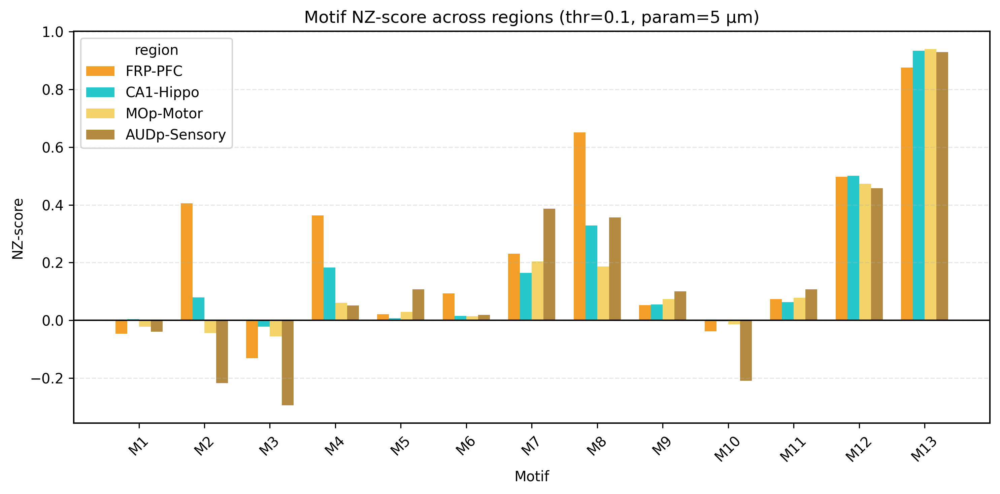

In [45]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. Basic params =====
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
param = 5
thr_pick = "0.1"  # choose ONE: "0", "0.1", "0.2", "0.3", "0.4"
regions = ["FRP", "CA1", "MOp", "AUDp"]
regions_label =  ["FRP-PFC", "CA1-Hippo", "MOp-Motor", "AUDp-Sensory"]
# ===== 1. Load =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]




# ===== 2. Collect NZ for each region at the same threshold =====
nz_mat = []
valid_regions = []
for r in regions:
    mr = results[param][r]["motif_results"].get(thr_pick, None)
    if mr is None:
        print(f"[WARN] missing: region={r}, thr={thr_pick}")
        continue
    nz = np.asarray(mr["NZ"], float)
    if nz.shape[0] != 13:
        print(f"[WARN] bad NZ shape: region={r}, shape={nz.shape}")
        continue
    nz_mat.append(nz)
    valid_regions.append(r)

nz_mat = np.log10(1+8*np.vstack(nz_mat))  # (n_region, 13)

# ===== 3. Plot grouped bars (4 regions) =====
x = np.arange(13)
bw = 0.18

colors = {
    "MOp-E":   "#601986",
    "MOp":     "#F3CC4F",
    "AVE":     "#009944",
    "FRP":     "#F18D00",
    "FRP-E":   "#E60012",
    "Vanilla": "#529DCB",
    "CA1":     "#00BFC4",
    "AUDp":    "#A6761D"
}
# colors = plt.cm.tab10(np.arange(n_clust) % 10)

# colors = plt.cm.viridis(np.linspace(0.15, 0.85, len(valid_regions)))

plt.figure(figsize=(10, 5))
for i, r in enumerate(valid_regions):
    plt.bar(x + (i - (len(valid_regions)-1)/2)*bw, nz_mat[i], width=bw,
            alpha=0.85, color=colors[r], label=regions_label[i])

plt.xticks(x, [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("NZ-score")
plt.xlabel("Motif")
plt.title(f"Motif NZ-score across regions (thr={thr_pick}, param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="region")
plt.tight_layout()
plt.savefig(f"8.NZ_regions_FRP_CA1_MOp_AUDp_thr{thr_pick}_param{param}.svg",
            bbox_inches="tight", transparent=True)
plt.show()

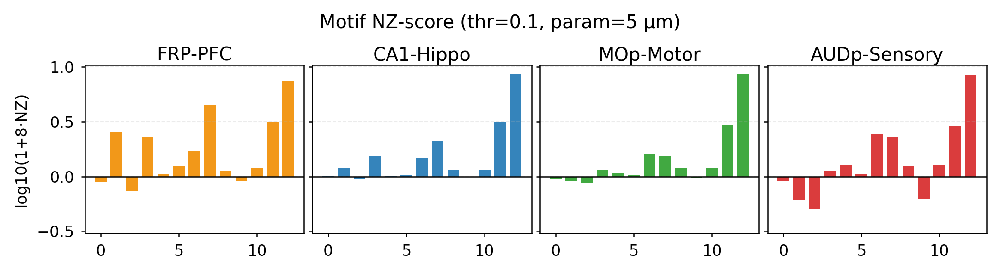

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ===== 0. Basic params =====
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
param = 5
thr_pick = "0.1"  # "0", "0.1", "0.2", "0.3", "0.4"
regions = ["FRP", "CA1", "MOp", "AUDp"]
regions_label = ["FRP-PFC", "CA1-Hippo", "MOp-Motor", "AUDp-Sensory"]

# ===== style for small panels =====
mpl.rcParams["figure.dpi"] = 300
mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["font.size"] = 8
mpl.rcParams["axes.linewidth"] = 0.6
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42

colors = {
    "FRP":     "#F18D00",
    "CA1":     "#1f77b4",
    "MOp":     "#2ca02c",
    "AUDp":    "#d62728"
}

# colors = plt.cm.tab10(np.arange(n_clust) % 10)

# ===== 1. Load =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]

# ===== 2. Collect NZ for each region at the same threshold =====
nz_mat, valid_regions, valid_labels = [], [], []
for r, lab in zip(regions, regions_label):
    mr = results[param][r]["motif_results"].get(thr_pick, None)
    if mr is None:
        print(f"[WARN] missing: region={r}, thr={thr_pick}")
        continue
    nz = np.asarray(mr["NZ"], float)
    if nz.shape != (13,):
        print(f"[WARN] bad NZ shape: region={r}, shape={nz.shape}")
        continue
    nz_mat.append(nz)
    valid_regions.append(r)
    valid_labels.append(lab)

nz_mat = np.log10(1 + 8 * np.vstack(nz_mat))  # (n_region, 13)

# ===== 3. 4 panels: one bar chart per region =====
x = np.arange(13)

# y-limits统一，方便横向比较
ymin = float(np.nanmin(nz_mat))
ymax = float(np.nanmax(nz_mat))
pad = 0.08 * (ymax - ymin) if ymax > ymin else 0.2
ylims = (-0.52, 1.02)

fig_w_cm, fig_h_cm = 18.0, 4.5  # 一行四图
fig, axes = plt.subplots(1, len(valid_regions), figsize=(fig_w_cm/2.54, fig_h_cm/2.54), sharey=True)

if len(valid_regions) == 1:
    axes = [axes]

for ax, r, lab, y in zip(axes, valid_regions, valid_labels, nz_mat):
    ax.bar(x, y, width=0.75, color=colors[r], alpha=0.9, linewidth=0)
    ax.axhline(0, color="k", lw=0.6)
    ax.set_title(lab, pad=2)
    # ax.set_xticks(x)
    # ax.set_xticklabels([f"M{i}" for i in range(1, 14)], rotation=45, ha="right")
    ax.grid(axis="y", linestyle="--", alpha=0.25, linewidth=0.5)
    ax.set_ylim(*ylims)
    ax.tick_params(axis="both", which="both", width=0.6, length=2.0)
    for sp in ax.spines.values():
        sp.set_linewidth(0.6)

axes[0].set_ylabel("log10(1+8·NZ)")
fig.suptitle(f"Motif NZ-score (thr={thr_pick}, param={param} µm)", y=1.02)

plt.tight_layout(pad=0.3)
plt.savefig(f"8.NZ_4panels_FRP_CA1_MOp_AUDp_thr{thr_pick}_param{param}.svg",
            bbox_inches="tight", transparent=True)
plt.show()

In [58]:
colors

array([[0.12156863, 0.46666667, 0.70588235, 1.        ],
       [1.        , 0.49803922, 0.05490196, 1.        ],
       [0.17254902, 0.62745098, 0.17254902, 1.        ],
       [0.83921569, 0.15294118, 0.15686275, 1.        ]])

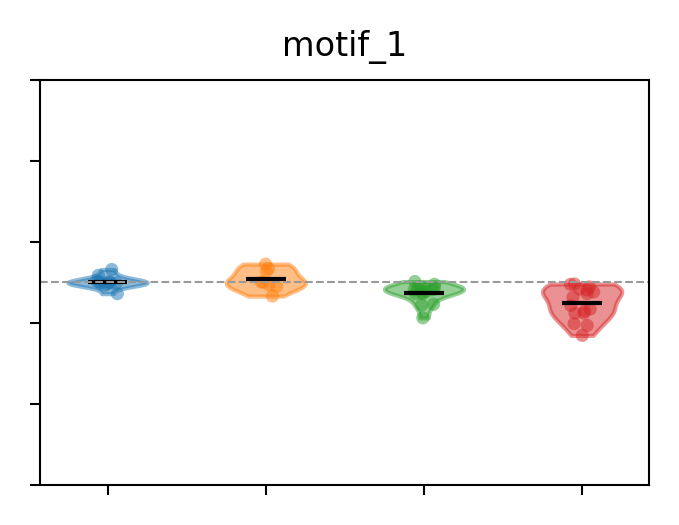

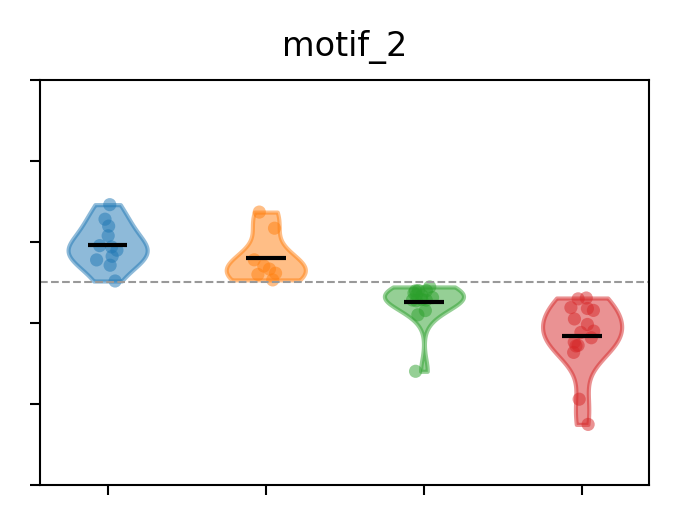

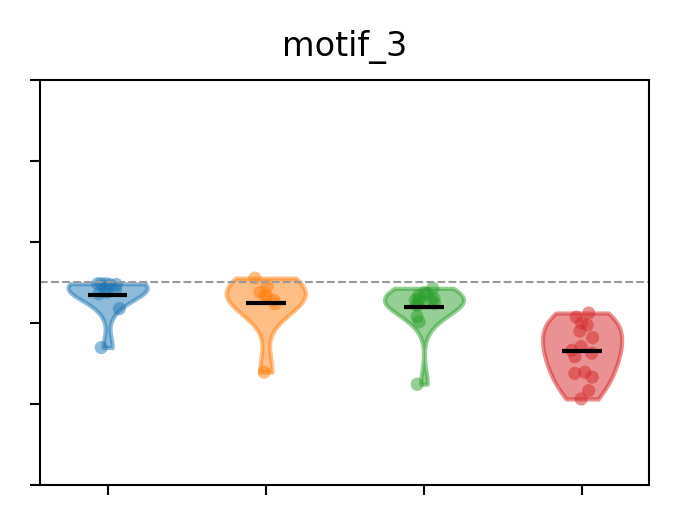

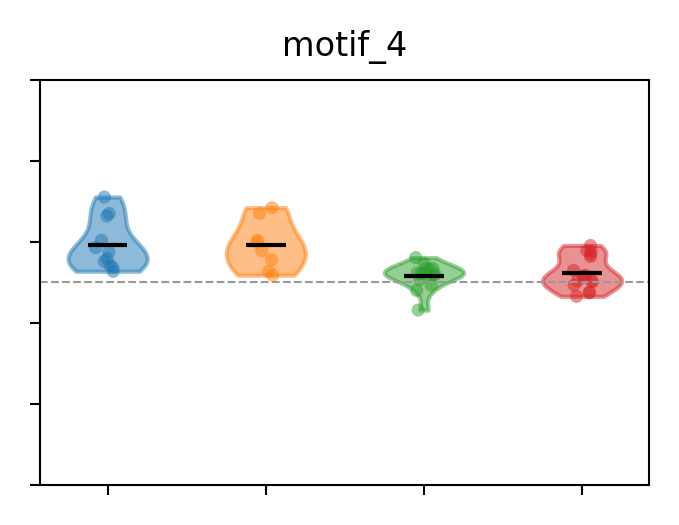

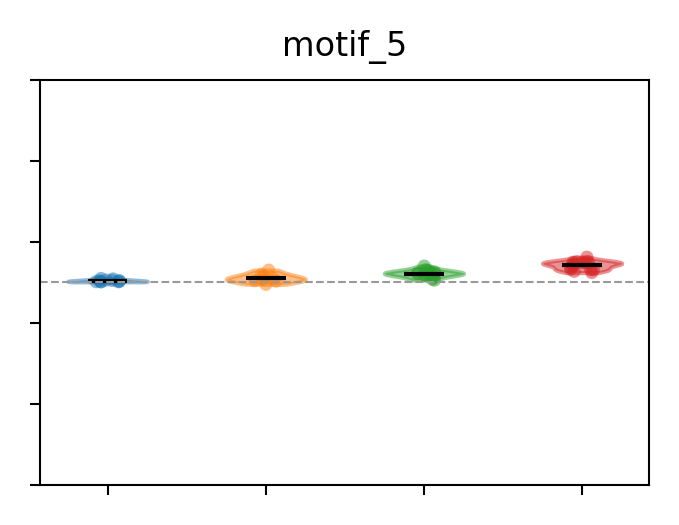

...

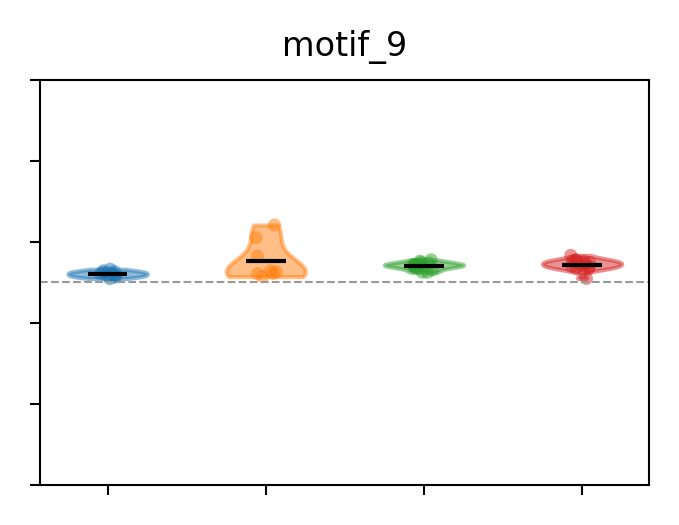

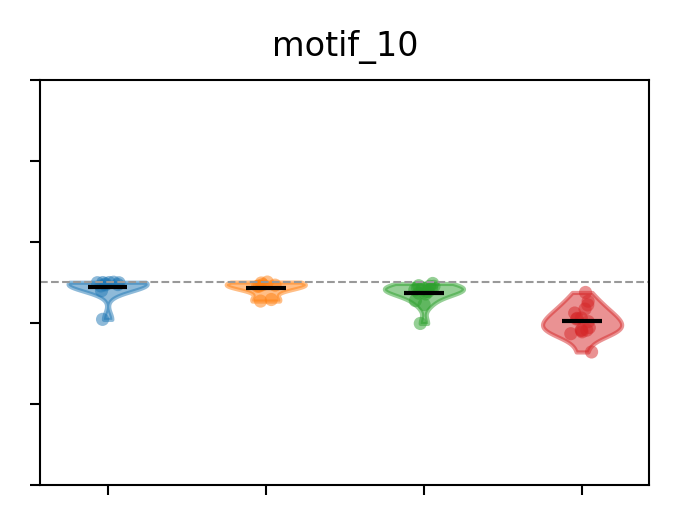

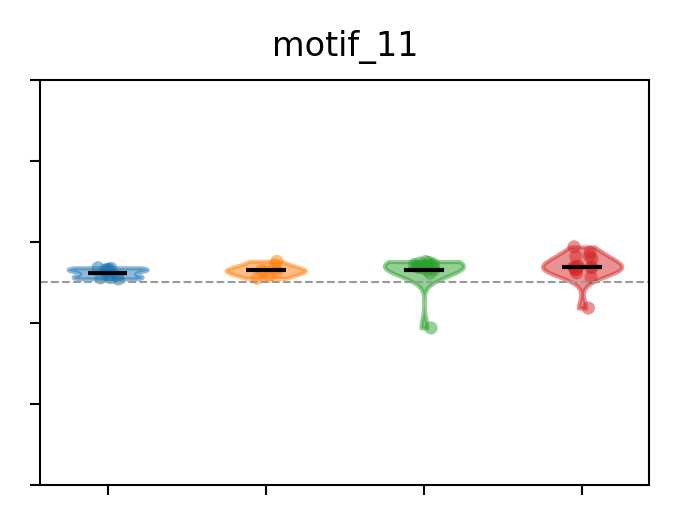

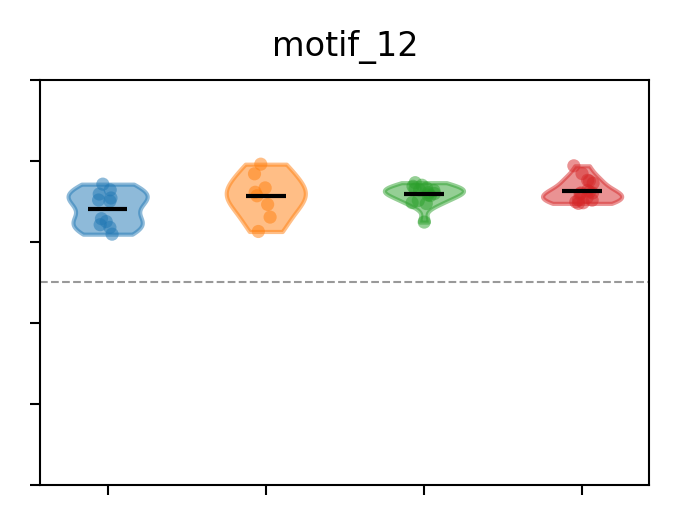

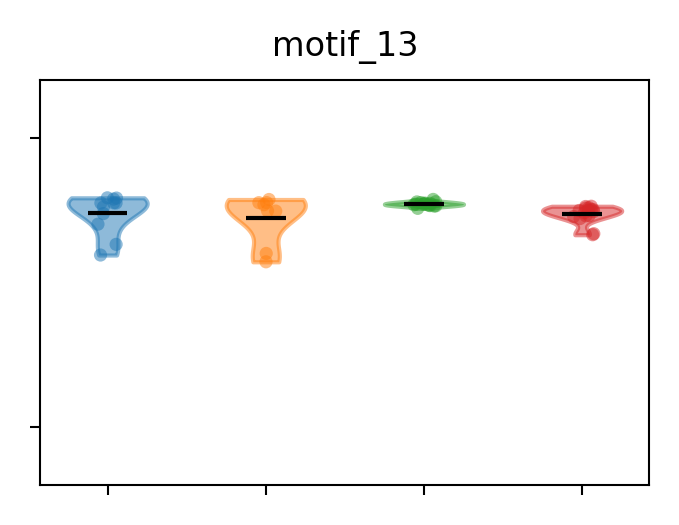

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# ===========================
# Assumed existing:
# NZ     : (n_region, 13)
# labels : (n_region,)  values in {1,2,3,4} (can include 0 if unassigned)
# ===========================

# ----- Figure size (cm -> inch) -----
fig_w_cm, fig_h_cm = 5.3, 4.0
fig_w_in, fig_h_in = fig_w_cm / 2.54, fig_h_cm / 2.54

# ----- Cluster info / colors / test pairs -----
unique_clusters = np.array(sorted(np.unique(labels).tolist()))
n_clust = len(unique_clusters)
colors = plt.cm.tab10(np.arange(n_clust) % 10)

pairs = [(1, 2), (2, 3), (3, 4), (1, 4)]  # C1-C2, C2-C3, C3-C4, C1-C4

for j in range(13):
    # ----- 0) transform + drop invalid values (per motif) -----
    raw = 1 + 7 * NZ[:, j]
    mask = np.isfinite(raw) & (raw > 0) & np.isfinite(labels)
    vals = np.log10(raw[mask])
    labj = labels[mask]

    fig, ax = plt.subplots(figsize=(fig_w_in, fig_h_in))

    # ----- 1) violin data by cluster -----
    data_by_cluster = [vals[labj == c] for c in unique_clusters]

    parts = ax.violinplot(
        data_by_cluster,
        positions=np.arange(1, n_clust + 1),
        showmeans=True,
        showextrema=False,
        showmedians=False,
    )

    # violin colors
    for body, col in zip(parts["bodies"], colors):
        body.set_facecolor(col)
        body.set_edgecolor(col)
        body.set_alpha(0.5)

    # mean line styling
    if "cmeans" in parts and parts["cmeans"] is not None:
        parts["cmeans"].set_color("k")
        parts["cmeans"].set_linewidth(1.0)

    # ----- 2) scatter points with jitter -----
    for i_pos, c in enumerate(unique_clusters, start=1):
        vc = vals[labj == c]
        if len(vc) == 0:
            continue
        jitter = (np.random.rand(len(vc)) - 0.5) * 0.15
        x_pos = np.full(len(vc), i_pos) + jitter
        ax.scatter(x_pos, vc, s=10, alpha=0.5, color=colors[i_pos - 1], edgecolors="none")

    # ----- 3) position map for brackets (if you enable stats) -----
    pos_map = {int(c): i for i, c in enumerate(unique_clusters, start=1)}

    # ----- 4) y-range / ticks -----
    if j <= 11:
        y_low, y_high = -1, 1
        ax.set_yticks(np.arange(-1, 1.01, 0.4))
    else:
        y_low, y_high = 0.4, 1.1
        ax.set_yticks([0.5, 1.0])

    # ----- 5) significance brackets (disabled by default) -----
    # n_drawn = 0
    # base0, step, h = (0.44, 0.05, 0.018) if j <= 11 else (0.94, 0.07, 0.02)
    # for (a, b) in pairs:
    #     if (a not in pos_map) or (b not in pos_map):
    #         continue
    #     da = vals[labj == a]
    #     db = vals[labj == b]
    #     if (len(da) < 2) or (len(db) < 2):
    #         continue
    #
    #     p = mannwhitneyu(da, db, alternative="two-sided").pvalue
    #
    #     if p < 0.0001: star = "****"
    #     elif p < 0.001: star = "***"
    #     elif p < 0.01: star = "**"
    #     elif p < 0.05: star = "*"
    #     else: continue
    #
    #     x1, x2 = pos_map[a], pos_map[b]
    #     if x1 > x2:
    #         x1, x2 = x2, x1
    #
    #     y = base0 + n_drawn * step
    #     if y + h > y_high - 0.005:
    #         continue
    #
    #     ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=0.5, c="k")
    #     ax.text((x1 + x2) / 2, y + h, star, ha="center", va="bottom", fontsize=7)
    #     n_drawn += 1

    # ----- 6) fixed y-limits + reference line -----
    ax.set_ylim(y_low, y_high)
    ax.axhline(0, color="0.6", lw=0.5, ls="--")

    # ----- 7) labels / ticks -----
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"motif_{j+1}", fontsize=8)

    ax.set_xticks(np.arange(1, n_clust + 1))
    ax.tick_params(axis="x", which="both", labelbottom=False)

    # if (j == 0) or (j == 12):
    #     ax.tick_params(axis="y", which="both", labelleft=True)
    # else:
    ax.tick_params(axis="y", which="both", labelleft=False)

    # ----- 8) spine/tick styling -----
    for sp in ax.spines.values():
        sp.set_linewidth(0.5)
    ax.tick_params(axis="both", which="both", width=0.5, length=2.5)

    # ----- 2.11 保存透明底 SVG（每个 motif 一张） -----
    out_svg = f"motif_{j+1:02d}_violin_0303.svg"
    plt.tight_layout(pad=0.1)
    plt.savefig(out_svg, transparent=True, bbox_inches="tight")
    plt.show()

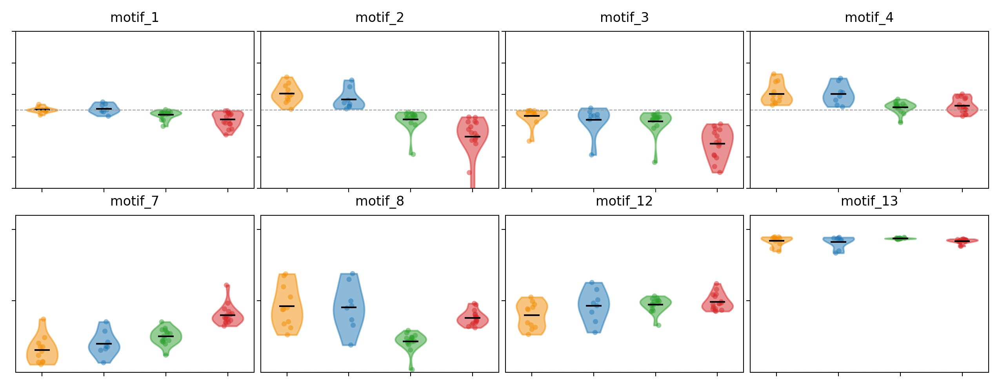

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# ===========================
# Assumed existing:
# NZ     : (n_region, 13)
# labels : (n_region,) values in {1,2,3,4} (can include 0)
# ===========================

# ----- Single panel size (cm -> inch) -----
fig_w_cm, fig_h_cm = 5.3, 4.0
fig_w_in, fig_h_in = fig_w_cm / 2.54, fig_h_cm / 2.54

# ----- Grid layout for 13 motifs -----
n_motif = 13
ncols = 4
nrows = 2  # 5 rows for 13 motifs

# Big figure size (approx: each panel uses fig_w_in x fig_h_in)
big_w = fig_w_in * ncols
big_h = fig_h_in * nrows

# ----- Cluster info / colors / test pairs -----
unique_clusters = np.array(sorted(np.unique(labels).tolist()))
n_clust = len(unique_clusters)
colors = ["#F18D00","#1f77b4","#2ca02c","#d62728"]

# colors = {
#     "MOp":     "#2ca02c",
#     "FRP":     "#F18D00",
#     "CA1":     "#1f77b4",
#     "AUDp":    "#d62728"
# }

pairs = [(1, 2), (2, 3), (3, 4), (1, 4)]

fig, axes = plt.subplots(nrows, ncols, figsize=(big_w, big_h), squeeze=False)
axes = axes.ravel()

i=0
for j in [0,1,2,3,6,7,11,12]:
    ax = axes[i]
    i = i + 1
    # ----- 0) transform + drop invalid values (per motif) -----
    raw = 1 + 8 * NZ[:, j]
    mask = np.isfinite(raw) & (raw > 0) & np.isfinite(labels)
    vals = np.log10(raw[mask])
    labj = labels[mask]

    # ----- 1) violin data by cluster -----
    data_by_cluster = [vals[labj == c] for c in unique_clusters]

    parts = ax.violinplot(
        data_by_cluster,
        positions=np.arange(1, n_clust + 1),
        showmeans=True,
        showextrema=False,
        showmedians=False,
    )

    for body, col in zip(parts["bodies"], colors):
        body.set_facecolor(col)
        body.set_edgecolor(col)
        body.set_alpha(0.5)

    if "cmeans" in parts and parts["cmeans"] is not None:
        parts["cmeans"].set_color("k")
        parts["cmeans"].set_linewidth(1.0)

    # ----- 2) scatter points with jitter -----
    for i_pos, c in enumerate(unique_clusters, start=1):
        vc = vals[labj == c]
        if len(vc) == 0:
            continue
        jitter = (np.random.rand(len(vc)) - 0.5) * 0.15
        x_pos = np.full(len(vc), i_pos) + jitter
        ax.scatter(x_pos, vc, s=10, alpha=0.5, color=colors[i_pos - 1], edgecolors="none")

    # ----- 3) y-range / ticks -----
    if j in (0,1,2,3):
        y_low, y_high = -1, 1
        ax.set_yticks(np.arange(-1, 1.01, 0.4))
    else:
        y_low, y_high = 0.0, 1.1
        ax.set_yticks([0.5, 1.0])

    ax.set_ylim(y_low, y_high)
    ax.axhline(0, color="0.6", lw=0.5, ls="--")

    # ----- 4) title / ticks -----
    ax.set_title(f"motif_{j+1}", fontsize=8)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks(np.arange(1, n_clust + 1))
    ax.tick_params(axis="x", which="both", labelbottom=False)
    ax.tick_params(axis="y", which="both", labelleft=False)

    # ----- 5) spine/tick styling -----
    for sp in ax.spines.values():
        sp.set_linewidth(0.5)
    ax.tick_params(axis="both", which="both", width=0.5, length=2.5)

# Hide unused subplots (there will be 15 slots for 13 motifs)
for k in range(n_motif, nrows * ncols):
    axes[k].axis("off")

plt.tight_layout(pad=0.2)
plt.savefig("motif_violin_all_in_one.svg", transparent=True, bbox_inches="tight")
plt.show()

Saved figure: 6.MOp_motif_frequency_vs_param.svg


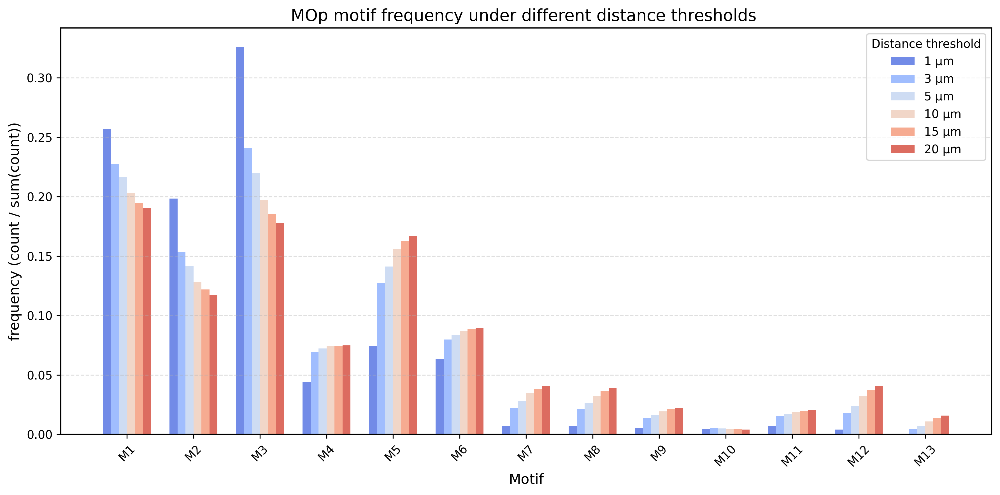

Saved figure: 6.MOp_motif_NZ_ER_vs_param.svg


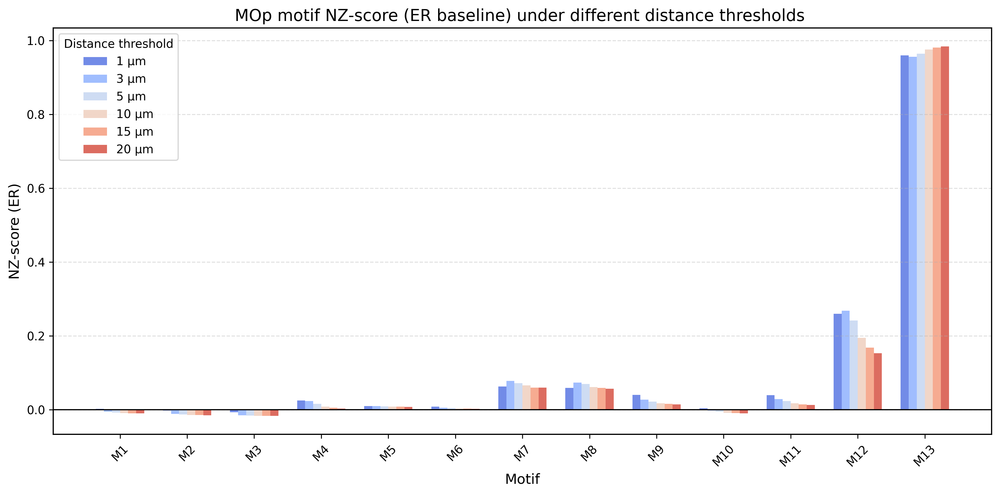

In [23]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ========= 0. 读数据 =========
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    d_all = pickle.load(f)

results = d_all["results"]   # dict: param -> {region -> info}


# ========= 1. 收集某个脑区在不同 param 下的 motif frequency & NZ =========

def collect_region_motif_across_params(region, params, thr_to_use="0"):
    """
    对指定 region，在多个距离阈值 param 下，收集：
      - freq: real_motif / sum(real_motif)
      - nz  : NZ_ER（优先用 NZ_raw，没有就用 NZ）
    返回:
      freq_dict[param] = 13 维数组
      nz_dict[param]   = 13 维数组
    """
    freq_dict = {}
    nz_dict   = {}

    for p in params:
        res_p = results.get(p, {})
        info = res_p.get(region, None)
        if info is None:
            print(f"[WARN] param={p} 下没有 region={region}")
            continue

        mr = info["motif_results"].get(thr_to_use, None)
        if mr is None:
            print(f"[WARN] param={p}, region={region} 下没有 thr={thr_to_use}")
            continue

        # ----- real_motif → 频率 -----
        real = np.asarray(mr["real_motif"], dtype=float)
        if real.shape[0] == 14:
            real = real[1:]
        if real.shape[0] != 13:
            print(f"[WARN] param={p}, region={region}: real_motif 维度异常: {real.shape}")
            continue

        total = real.sum()
        if total <= 0:
            print(f"[WARN] param={p}, region={region}: motif 总数为 0")
            continue

        freq = real / total

        # ----- NZ_ER：优先 NZ_raw，没有就用 NZ -----
        # if "NZ_raw" in mr:
        #     nz = np.asarray(mr["NZ_raw"], dtype=float)
        # else:
        nz = np.asarray(mr["NZ"], dtype=float)

        if nz.shape[0] == 14:
            nz = nz[1:]
        if nz.shape[0] != 13:
            print(f"[WARN] param={p}, region={region}: NZ 维度异常: {nz.shape}")
            continue

        freq_dict[p] = freq
        nz_dict[p]   = nz

    return freq_dict, nz_dict


# ========= 2. 画图：motif frequency / sum(motif) =========

def plot_region_freq_by_param(region, freq_dict, title_suffix=""):
    """
    freq_dict[param] = 13 维 freq
    多个 param 用多种颜色，在同一张图里画 grouped bar。
    """
    params = sorted(freq_dict.keys())  # 比如 [1,3,5,10,15,20]
    if not params:
        print(f"[ERROR] region={region} 的 freq_dict 为空，检查一下数据/阈值")
        return

    n_motif = len(next(iter(freq_dict.values())))
    x = np.arange(n_motif)
    order = list(range(1, n_motif + 1))

    bar_width = 0.12
    colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params)))

    plt.figure(figsize=(12, 6))

    for j, p in enumerate(params):
        freq = freq_dict[p]

        plt.bar(
            x + j * bar_width,
            freq,
            width=bar_width,
            label=f"{p} µm",
            color=colors[j],
            alpha=0.85
        )

    plt.title(f'{region} motif frequency under different distance thresholds {title_suffix}',
              fontsize=14)
    plt.xlabel('Motif', fontsize=12)
    plt.ylabel('frequency (count / sum(count))', fontsize=12)
    plt.xticks(
        x + bar_width * (len(params) - 1) / 2,
        [f"M{i}" for i in order],
        rotation=45
    )
    plt.legend(title='Distance threshold')
    plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout()
    fname = f'6.{region}_motif_frequency_vs_param.svg'
    plt.savefig(fname, format='svg', bbox_inches='tight')
    print("Saved figure:", fname)
    plt.show()


# ========= 3. 画图：NZ_ER（z-score, ER 基准） =========

def plot_region_NZ_by_param(region, nz_dict, title_suffix=""):
    """
    nz_dict[param] = 13 维 NZ_ER
    和 frequency 一样，用 grouped bar。
    """
    params = sorted(nz_dict.keys())
    if not params:
        print(f"[ERROR] region={region} 的 nz_dict 为空，检查一下数据/阈值")
        return

    n_motif = len(next(iter(nz_dict.values())))
    x = np.arange(n_motif)
    order = list(range(1, n_motif + 1))

    bar_width = 0.12
    colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params)))

    plt.figure(figsize=(12, 6))

    for j, p in enumerate(params):
        nz = nz_dict[p]

        plt.bar(
            x + j * bar_width,
            nz,
            width=bar_width,
            label=f"{p} µm",
            color=colors[j],
            alpha=0.85
        )

    plt.title(f'{region} motif NZ-score (ER baseline) under different distance thresholds {title_suffix}',
              fontsize=14)
    plt.xlabel('Motif', fontsize=12)
    plt.ylabel('NZ-score (ER)', fontsize=12)
    plt.xticks(
        x + bar_width * (len(params) - 1) / 2,
        [f"M{i}" for i in order],
        rotation=45
    )
    plt.axhline(0, color='k', lw=1)
    plt.legend(title='Distance threshold')
    plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout()
    fname = f'6.{region}_motif_NZ_ER_vs_param.svg'
    plt.savefig(fname, format='svg', bbox_inches='tight')
    print("Saved figure:", fname)
    plt.show()


# ========= 4. 调用：以 MOp 为例 =========

region = "MOp"
param_list = [1, 3, 5, 10, 15, 20]
thr_to_use = "0"   # 你现在用的强度阈值

freq_dict, nz_dict = collect_region_motif_across_params(region, param_list, thr_to_use=thr_to_use)

plot_region_freq_by_param(region, freq_dict)
plot_region_NZ_by_param(region, nz_dict)

In [37]:
# ===== 从 data 中按 names 顺序取出 ES，None 标记成 NaN =====
ES = np.full((len(names), 13), np.nan)

for i, r in enumerate(names):
    info = data[r]
    mr = info["motif_results"].get("0")   # 和前面一样的 thr_to_use
    es = mr.get("ES_raw", None)

    if es is None:
        continue  # 这一行保持 NaN，全 motif 都跳过
    es = np.asarray(es, float)
    if es.shape[0] != 13:
        continue

    ES[i, :] = es

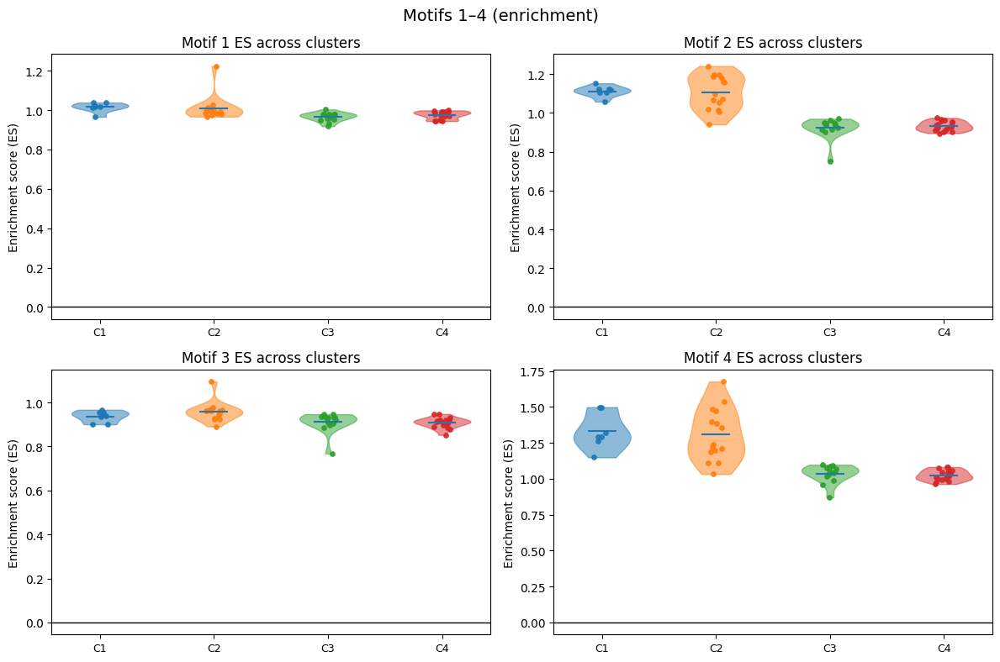

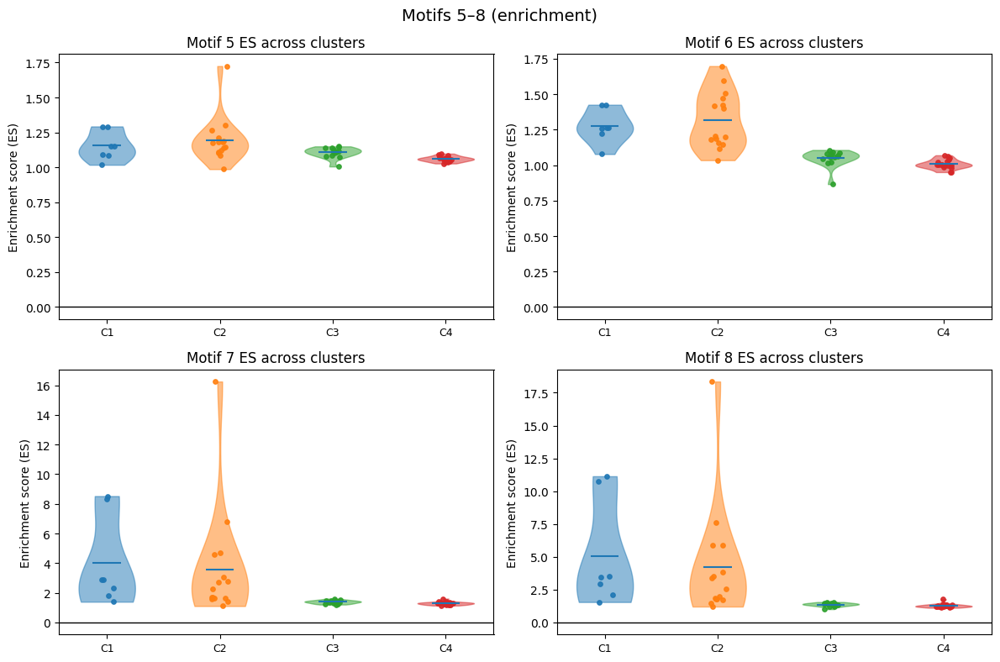

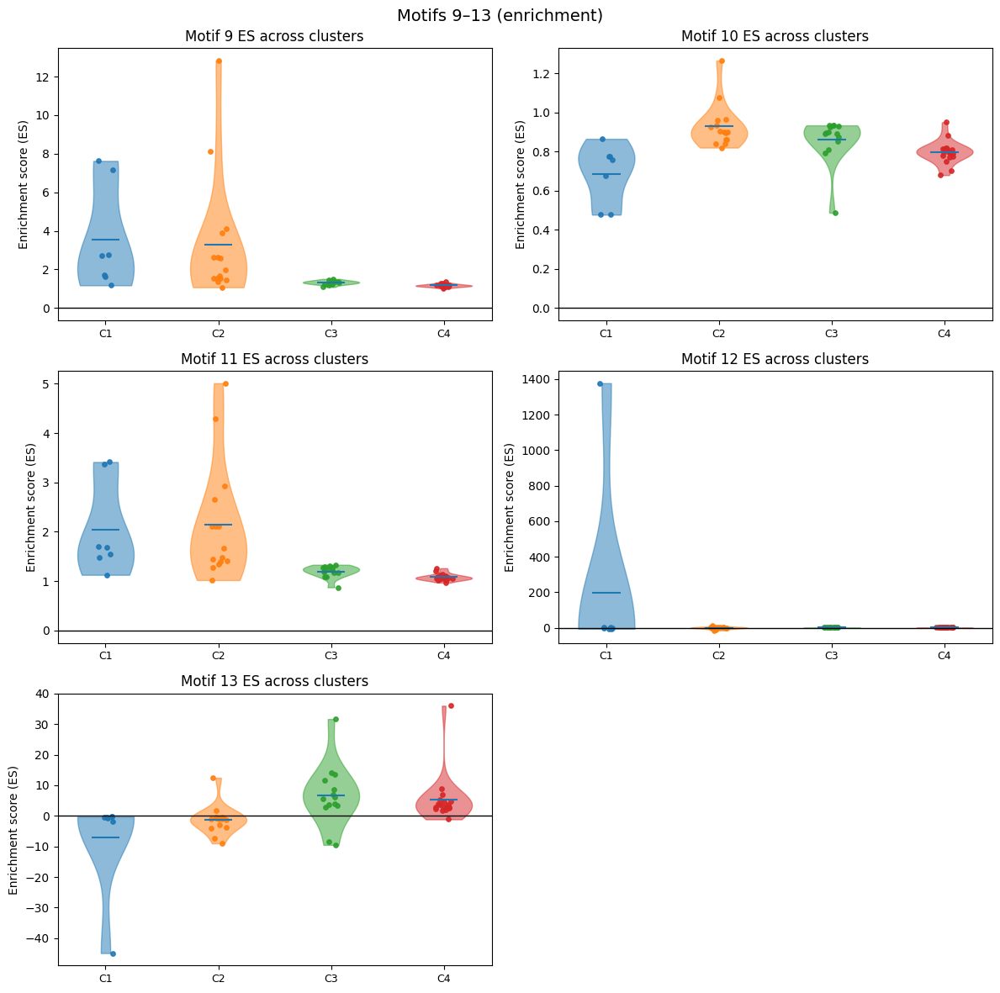

In [38]:
import matplotlib.pyplot as plt

unique_clusters = np.unique(labels)
n_clust = len(unique_clusters)
colors = plt.cm.tab10(np.arange(n_clust) % 10)  # 每个 cluster 一个颜色

motif_groups = [
    (list(range(0, 4)),  "Motifs 1–4 (enrichment)"),
    (list(range(4, 8)),  "Motifs 5–8 (enrichment)"),
    (list(range(8, 13)), "Motifs 9–13 (enrichment)"),
]

for motif_idx_list, title_group in motif_groups:
    n_motifs = len(motif_idx_list)
    n_cols = 2
    n_rows = int(np.ceil(n_motifs / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

    for k, j in enumerate(motif_idx_list):
        row = k // n_cols
        col = k % n_cols
        ax = axes[row, col]

        vals = ES[:, j]  # 该 motif 的 enrichment，可能含 NaN
        # 如果这一列全是 NaN，就直接跳过
        if np.all(np.isnan(vals)):
            ax.set_visible(False)
            continue

        data_by_cluster = []
        for c in unique_clusters:
            mask_c = (labels == c) & ~np.isnan(vals)
            data_by_cluster.append(vals[mask_c])

        # ---- violin ----
        parts = ax.violinplot(
            data_by_cluster,
            positions=np.arange(1, n_clust + 1),
            showmeans=True,
            showextrema=False,
            showmedians=False,
        )

        # 统一 violin 颜色：每个 cluster 一个颜色
        for body, col_c in zip(parts['bodies'], colors):
            body.set_facecolor(col_c)
            body.set_edgecolor(col_c)
            body.set_alpha(0.5)

        # ---- 点：同色，同 cluster ----
        for i_c, c in enumerate(unique_clusters, start=1):
            mask_c = (labels == c) & ~np.isnan(vals)
            vals_c = vals[mask_c]
            if len(vals_c) == 0:
                continue
            jitter = (np.random.rand(len(vals_c)) - 0.5) * 0.15
            x_pos = np.full(len(vals_c), i_c) + jitter
            ax.scatter(x_pos, vals_c, s=15, alpha=0.9, color=colors[i_c-1])

        ax.set_xticks(np.arange(1, n_clust + 1))
        ax.set_xticklabels([f"C{int(c)}" for c in unique_clusters], fontsize=9)
        ax.axhline(0, color="k", lw=1)
        ax.set_ylabel("Enrichment score (ES)")
        ax.set_title(f"Motif {j+1} ES across clusters")

    # 删掉多余 subplot
    for k in range(n_motifs, n_rows * n_cols):
        row = k // n_cols
        col = k % n_cols
        fig.delaxes(axes[row, col])

    fig.suptitle(title_group, fontsize=14)
    plt.tight_layout()
    plt.show()

有 ES 的脑区数: 54  ES 形状: (54, 13)


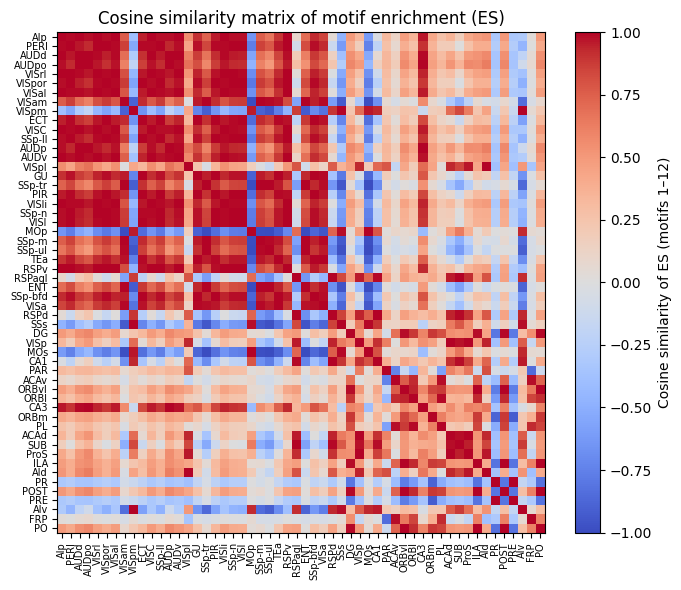

In [42]:
# ==================== ES：构建富集度矩阵（按 names 顺序） ====================
thr_to_use = "0.1"

ES_list = []
valid_mask = []

for r in names:
    info = data[r]
    mr = info["motif_results"].get(thr_to_use)
    es = mr.get("ES", None)
    if es is None:
        valid_mask.append(False)
        continue
    es = np.asarray(es, float)
    if es.shape[0] != 13:
        valid_mask.append(False)
        continue
    ES_list.append(es)
    valid_mask.append(True)

valid_mask = np.array(valid_mask, bool)

ES = np.vstack(ES_list)           # (n_valid_region, 13)
names_es = names[valid_mask]      # 只有有 ES 的脑区
labels_es = labels[valid_mask]

print("有 ES 的脑区数:", len(names_es), " ES 形状:", ES.shape)

# ==================== 富集度 ES 的余弦相似度（前 12 个 motif） ====================
X = ES[:, :13]                                  # 只用 motif 1–12
norms = np.linalg.norm(X, axis=1, keepdims=True)
X_norm = X / norms                              # 行归一化 → L2 = 1

cos_sim_es = X_norm @ X_norm.T                  # (n_valid_region, n_valid_region)

plt.figure(figsize=(7, 6))
im = plt.imshow(cos_sim_es, aspect="auto", cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar(im, label="Cosine similarity of ES (motifs 1–12)")

plt.xticks(range(len(names_es)), names_es, rotation=90, fontsize=7)
plt.yticks(range(len(names_es)), names_es, fontsize=7)

plt.title("Cosine similarity matrix of motif enrichment (ES)")
plt.tight_layout()
plt.show()

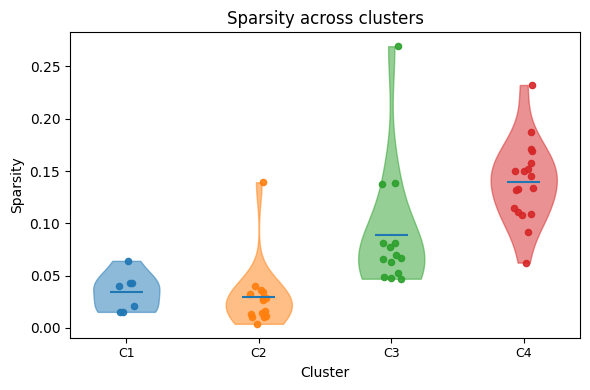

In [43]:
import numpy as np
import matplotlib.pyplot as plt

# ==================== 不同聚类类别的稀疏度 ====================
unique_clusters = np.unique(labels)
n_clust = len(unique_clusters)

vals = spars  # 每个脑区的稀疏度

data_by_cluster = [vals[labels == c] for c in unique_clusters]

plt.figure(figsize=(6, 4))

# 1) violin
parts = plt.violinplot(
    data_by_cluster,
    positions=np.arange(1, n_clust + 1),
    showmeans=True,
    showextrema=False,
    showmedians=False,
)

colors = plt.cm.tab10(np.arange(n_clust) % 10)
for body, col_c in zip(parts["bodies"], colors):
    body.set_facecolor(col_c)
    body.set_edgecolor(col_c)
    body.set_alpha(0.5)

# 2) 叠加散点（每个脑区一个点，颜色与对应 cluster 一致）
for i, c in enumerate(unique_clusters, start=1):
    mask_c = (labels == c)
    vals_c = vals[mask_c]
    if len(vals_c) == 0:
        continue
    jitter = (np.random.rand(len(vals_c)) - 0.5) * 0.15
    x_pos = np.full(len(vals_c), i) + jitter
    plt.scatter(x_pos, vals_c, s=20, alpha=0.9, color=colors[i-1])

plt.xticks(
    np.arange(1, n_clust + 1),
    [f"C{int(c)}" for c in unique_clusters],
    fontsize=9,
)
plt.ylabel("Sparsity")
plt.xlabel("Cluster")
plt.title("Sparsity across clusters")

plt.tight_layout()
plt.show()

In [49]:
param_to_use = 5
thr_to_use   = "0.1"

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    d = pickle.load(f)

res_param = d["results"][param_to_use]

# 之前已经算好的：
# NZ, names, labels, spars, ...

# ===== 1. 基于原始 sc 计算每个脑区的平均出度 / 入度 =====
thr_val = float(thr_to_use)

deg_out = np.zeros(len(names))
deg_in  = np.zeros(len(names))

for i, r in enumerate(names):
    info = res_param[r]
    sc = np.asarray(info["sc"], float)   # 原始强度矩阵
    A = (sc > 0).astype(float)     # 按强度阈值二值化
    np.fill_diagonal(A, 0.0)             # 不算自连接

    deg_out_nodes = A.sum(axis=1)        # 每个节点的出度
    deg_in_nodes  = A.sum(axis=0)        # 每个节点的入度

    # 每个脑区一个平均出度 / 入度（也可以换成中位数）
    deg_out[i] = deg_out_nodes.mean()
    deg_in[i]  = deg_in_nodes.mean()

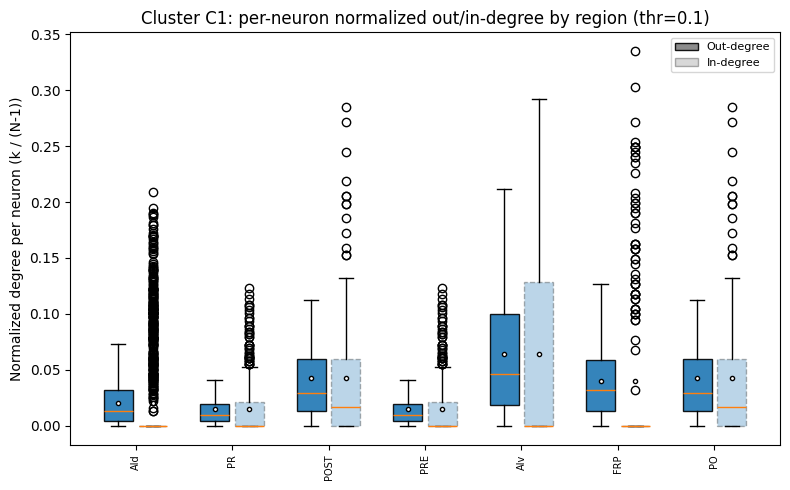

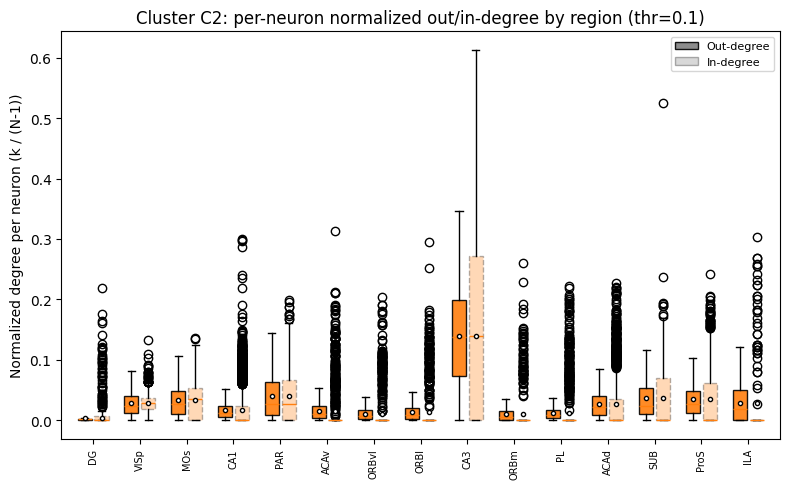

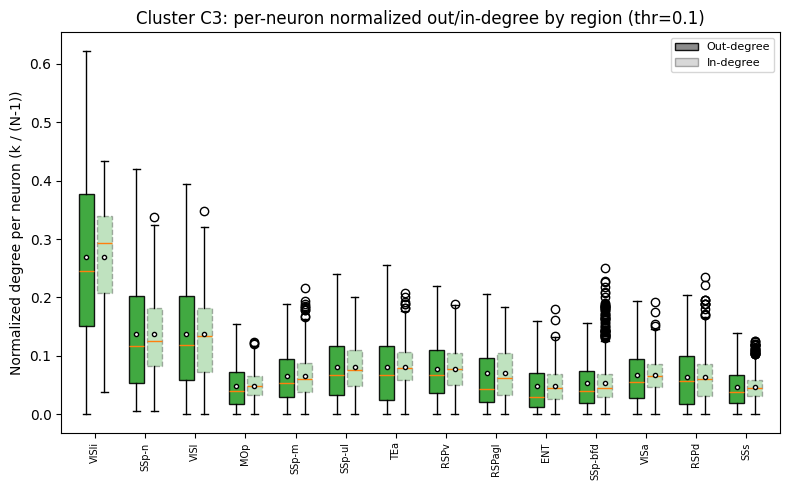

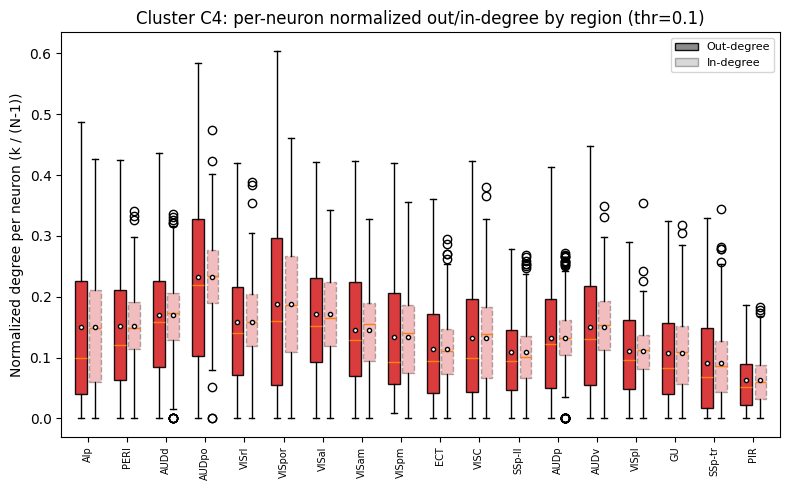

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ==================== 1. 基于 sc 计算归一化出入度分布 ====================
thr_val = float(thr_to_use)

out_deg_norm_list = []   # 每个元素：该脑区所有神经元的归一化出度 k_out/(N-1)
in_deg_norm_list  = []   # 每个元素：该脑区所有神经元的归一化入度 k_in/(N-1)

for r in names:
    info = res_param[r]
    sc = np.asarray(info["sc"], float)   # 原始强度矩阵 (N_i, N_i)

    # 按强度阈值二值化
    A = (sc > 0.0).astype(float)
    np.fill_diagonal(A, 0.0)

    N = A.shape[0]
    if N <= 1:
        out_deg_norm_list.append(np.array([]))
        in_deg_norm_list.append(np.array([]))
        continue

    deg_out_nodes = A.sum(axis=1)        # 每个神经元出度
    deg_in_nodes  = A.sum(axis=0)        # 每个神经元入度

    # 归一化：除以 (N-1)，消除采样规模 N 的影响
    out_deg_norm = deg_out_nodes / (N - 1)
    in_deg_norm  = deg_in_nodes  / (N - 1)

    out_deg_norm_list.append(out_deg_norm)
    in_deg_norm_list.append(in_deg_norm)

# ==================== 2. 四类 cluster，各画一张箱线图（无 outlier） ====================
unique_clusters = np.unique(labels)
colors_cluster = plt.cm.tab10((unique_clusters - 1) % 10)  # 每个 cluster 一个颜色

for c, col_c in zip(unique_clusters, colors_cluster):
    # 找到属于该 cluster 的脑区索引
    idx = np.where(labels == c)[0]
    if len(idx) == 0:
        continue

    region_names_c = names[idx]
    out_c = [out_deg_norm_list[i] for i in idx]
    in_c  = [in_deg_norm_list[i]  for i in idx]

    # 过滤掉可能为空的脑区（例如 N<=1）
    valid = [i for i, (o, inn) in enumerate(zip(out_c, in_c)) if len(o) > 0 and len(inn) > 0]
    if not valid:
        continue

    region_names_c = region_names_c[valid]
    out_c = [out_c[i] for i in valid]
    in_c  = [in_c[i]  for i in valid]

    n_regions_c = len(region_names_c)
    x = np.arange(n_regions_c)

    fig, ax = plt.subplots(figsize=(max(8, n_regions_c * 0.4), 5))

    # 出度箱线图（在 x-0.18），不显示 outlier
    bp_out = ax.boxplot(
        out_c,
        positions=x - 0.18,
        widths=0.3,
        patch_artist=True,
        showmeans=True,
        showfliers=False,
    )

    # 入度箱线图（在 x+0.18），不显示 outlier
    bp_in = ax.boxplot(
        in_c,
        positions=x + 0.18,
        widths=0.3,
        patch_artist=True,
        showmeans=True,
        showfliers=True,
    )

    # 出度：该 cluster 的颜色，实心
    for box in bp_out["boxes"]:
        box.set(facecolor=col_c, edgecolor="k", alpha=0.9)
    # 入度：同色，但淡一点 + 虚线边框
    for box in bp_in["boxes"]:
        box.set(facecolor=col_c, edgecolor="k", alpha=0.3, linestyle="--")

    # 均值点强调一下
    for m in bp_out["means"]:
        m.set(marker="o", markersize=3, markerfacecolor="white", markeredgecolor="k")
    for m in bp_in["means"]:
        m.set(marker="o", markersize=3, markerfacecolor="white", markeredgecolor="k")

    ax.set_xticks(x)
    ax.set_xticklabels(region_names_c, rotation=90, fontsize=7)

    ax.set_ylabel("Normalized degree per neuron (k / (N-1))")
    ax.set_title(f"Cluster C{int(c)}: per-neuron normalized out/in-degree by region (thr={thr_to_use})")

    legend_patches = [
        Patch(facecolor="gray", edgecolor="k", alpha=0.9, label="Out-degree"),
        Patch(facecolor="gray", edgecolor="k", alpha=0.3, label="In-degree"),
    ]
    ax.legend(handles=legend_patches, loc="upper right", fontsize=8)

    plt.tight_layout()
    plt.show()

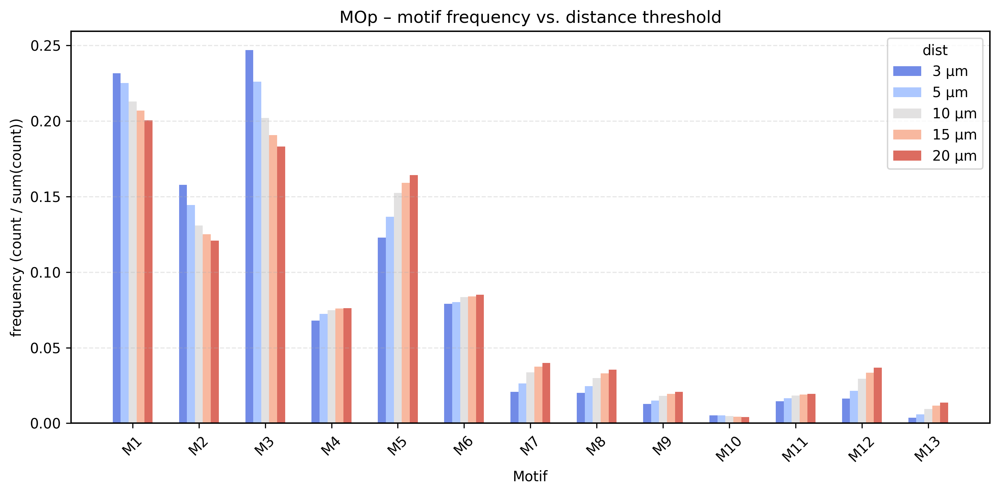

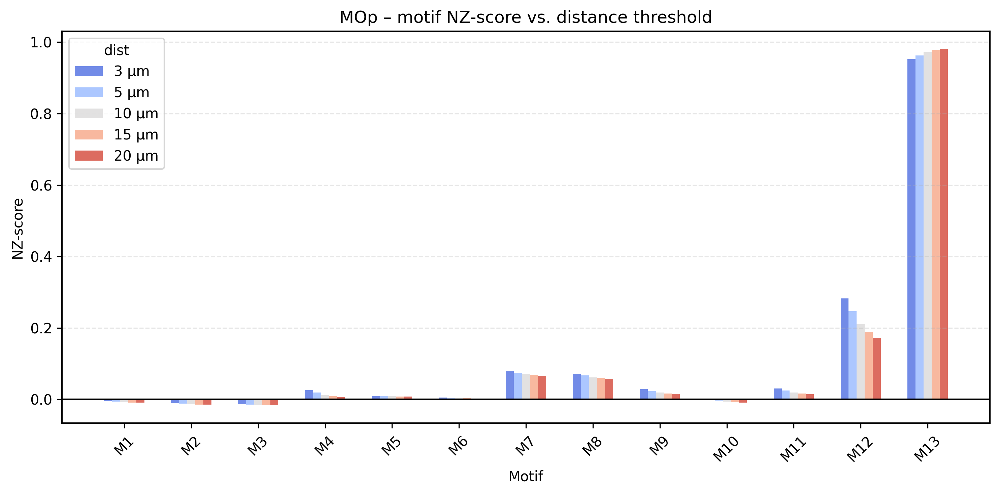

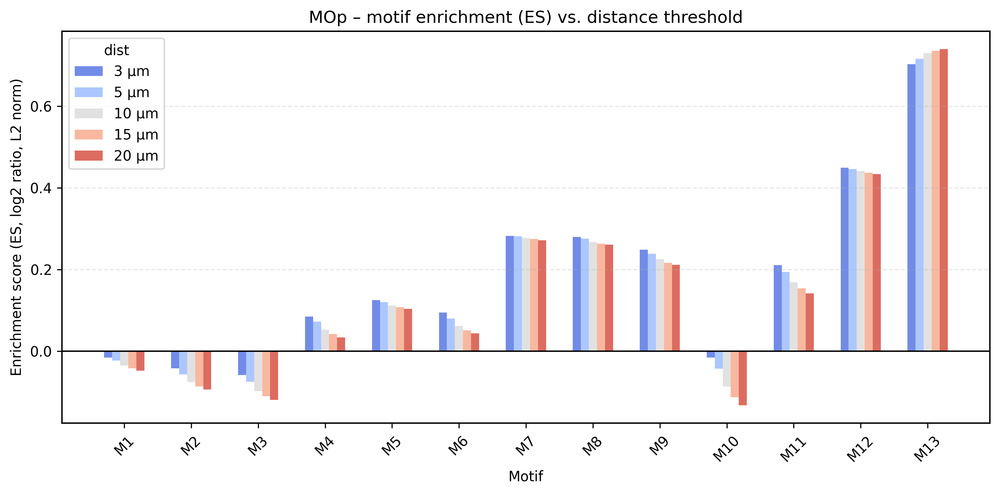

In [24]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 基本参数 =====
pkl_path   = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
region     = "MOp"                 # 换成你想看的脑区
param_list = [ 3, 5, 10, 15, 20] # 不同距离阈值
thr        = "0.1"                   # motif_results 的 key

# ===== 1. 读数据 =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]   # dict[param][region]["motif_results"][thr]

freq_dict = {}
nz_dict   = {}
es_dict   = {}

for p in param_list:
    mr = results[p][region]["motif_results"][thr]

    # ---- 频率：real_motif / sum ----
    real = np.asarray(mr["real_motif"], float)
    freq_dict[p] = real / real.sum()

    # ---- NZ ----
    nz = np.asarray(mr["NZ"], float)
    nz_dict[p] = nz

    # ---- ES：用你指定的公式重算 ----
    # es_raw = log2(real) - log2(mu_eq), 然后 L2 归一化
    mu_eq  = np.asarray(mr["er_mu_eq"], float)
    es_raw = np.log2(real) - np.log2(mu_eq)
    es_norm = es_raw / np.linalg.norm(es_raw)
    es_dict[p] = es_norm

# 公共横坐标
x  = np.arange(13)
bw = 0.12

# ===== 2. 画 freq（motif frequency / sum）=====
params_freq = sorted(freq_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_freq):
    plt.bar(x + i*bw, freq_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_freq)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.ylabel("frequency (count / sum(count))")
plt.xlabel("Motif")
plt.title(f"{region} – motif frequency vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_frequency_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 3. 画 NZ =====
params_nz = sorted(nz_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_nz):
    plt.bar(x + i*bw, nz_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_nz)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("NZ-score")
plt.xlabel("Motif")
plt.title(f"{region} – motif NZ-score vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_NZ_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 4. 画 ES（用新公式计算的 ES_norm）=====
params_es = sorted(es_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_es):
    plt.bar(x + i*bw, es_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_es)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("Enrichment score (ES, log2 ratio, L2 norm)")
plt.xlabel("Motif")
plt.title(f"{region} – motif enrichment (ES) vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_ES_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

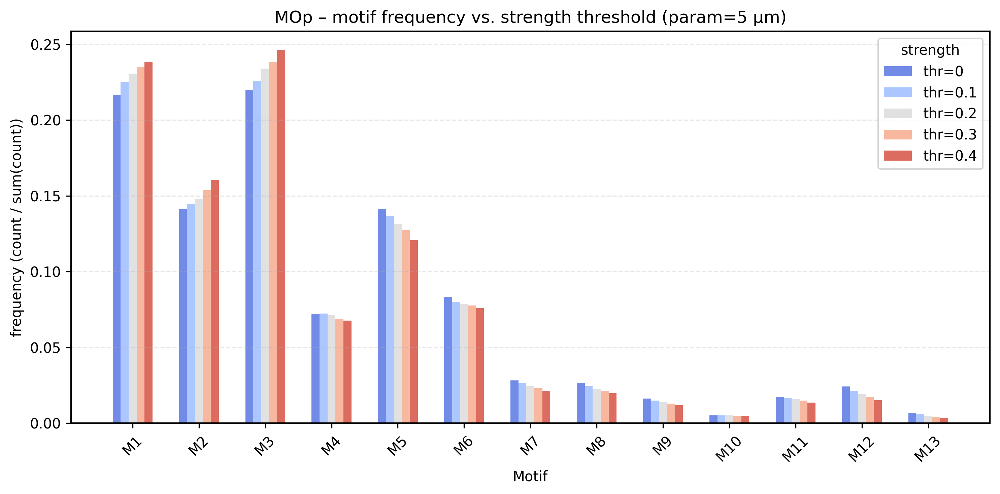

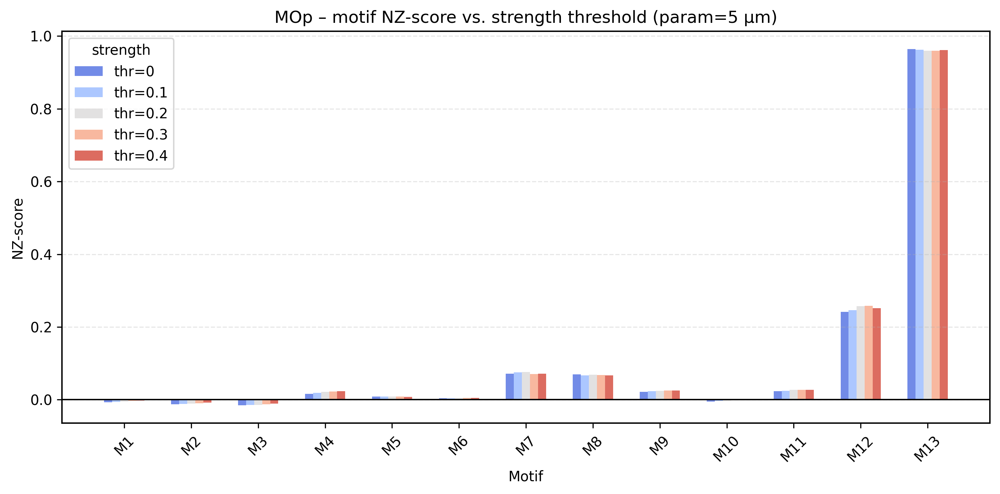

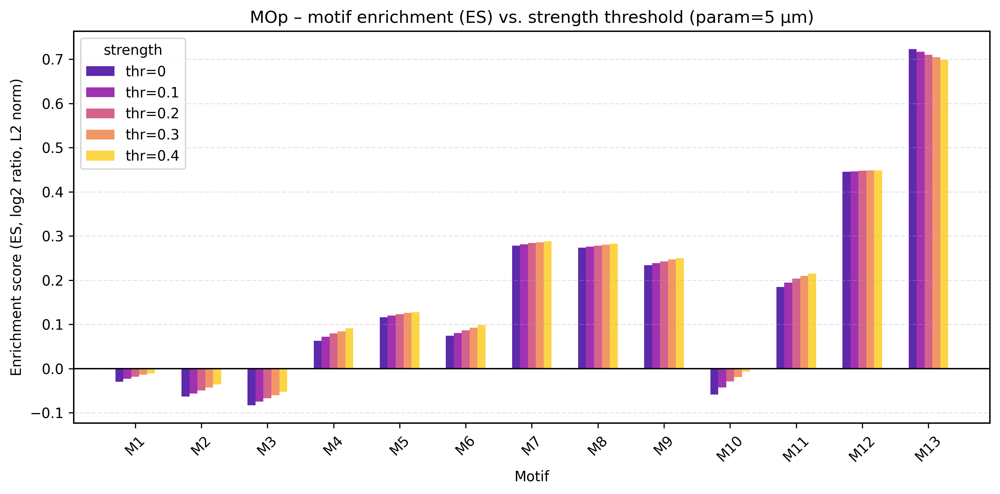

In [25]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 基本参数 =====
pkl_path   = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
region     = "MOp"                 # 换成你想看的脑区
param      = 5                     # 固定距离阈值 5 µm
thr_list   = ["0", "0.1", "0.2", "0.3", "0.4"]   # 五个不同连接强度阈值

# ===== 1. 读数据 =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]   # dict[param][region]["motif_results"][thr]

freq_dict = {}
nz_dict   = {}
es_dict   = {}

for thr in thr_list:
    mr = results[param][region]["motif_results"][thr]

    # ---- 频率：real_motif / sum ----
    real = np.asarray(mr["real_motif"], float)
    freq_dict[thr] = real / real.sum()

    # ---- NZ ----
    nz = np.asarray(mr["NZ"], float)
    nz_dict[thr] = nz

    # ---- ES：用你指定的公式重算 ----
    mu_eq  = np.asarray(mr["er_mu_eq"], float)
    es_raw = np.log2(real) - np.log2(mu_eq)
    es_norm = es_raw / np.linalg.norm(es_raw)
    es_dict[thr] = es_norm

# 公共横坐标
x  = np.arange(13)
bw = 0.12

# ===== 2. 画 freq（motif frequency / sum）=====
thr_freq = [t for t in thr_list if t in freq_dict]
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(thr_freq)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_freq):
    plt.bar(x + i*bw, freq_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_freq)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.ylabel("frequency (count / sum(count))")
plt.xlabel("Motif")
plt.title(f"{region} – motif frequency vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_frequency_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 3. 画 NZ =====
thr_nz = [t for t in thr_list if t in nz_dict]
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(thr_nz)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_nz):
    plt.bar(x + i*bw, nz_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_nz)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("NZ-score")
plt.xlabel("Motif")
plt.title(f"{region} – motif NZ-score vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_NZ_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 4. 画 ES（用新公式计算的 ES_norm）=====
thr_es = [t for t in thr_list if t in es_dict]
colors = plt.cm.plasma(np.linspace(0.1, 0.9, len(thr_es)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_es):
    plt.bar(x + i*bw, es_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_es)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("Enrichment score (ES, log2 ratio, L2 norm)")
plt.xlabel("Motif")
plt.title(f"{region} – motif enrichment (ES) vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_ES_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

In [12]:
real = results[1][region]["motif_results"]["0"]["real_motif"]
mu = results[1][region]["motif_results"]["0"]["er_mu_eq"]
print(np.log2(real)-np.log2(mu))

[ 0.13961044 -0.23537321 -0.52035632  3.19126185  3.94026091  3.7078191
  8.16305991  8.10962066  7.77813373  1.59771594  7.09759357 12.94395744
 19.44077687]


/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/9379221.py:40: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


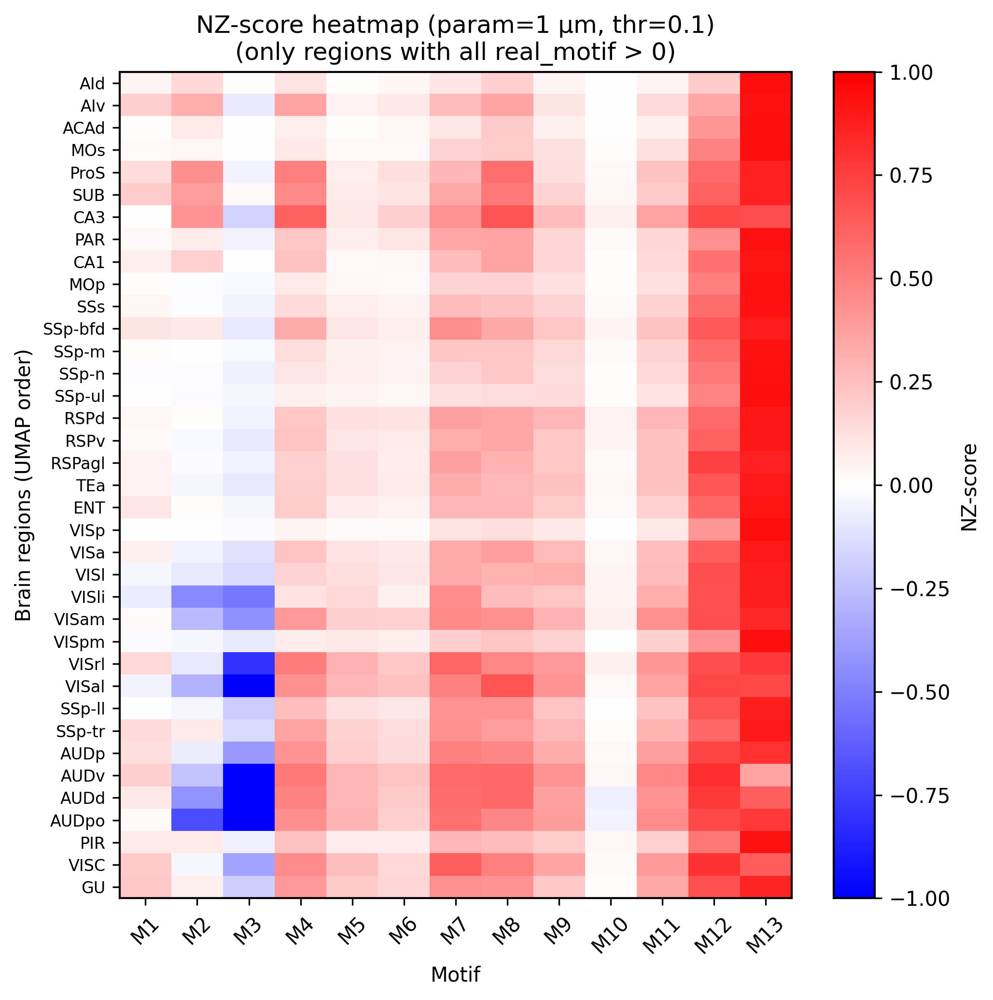

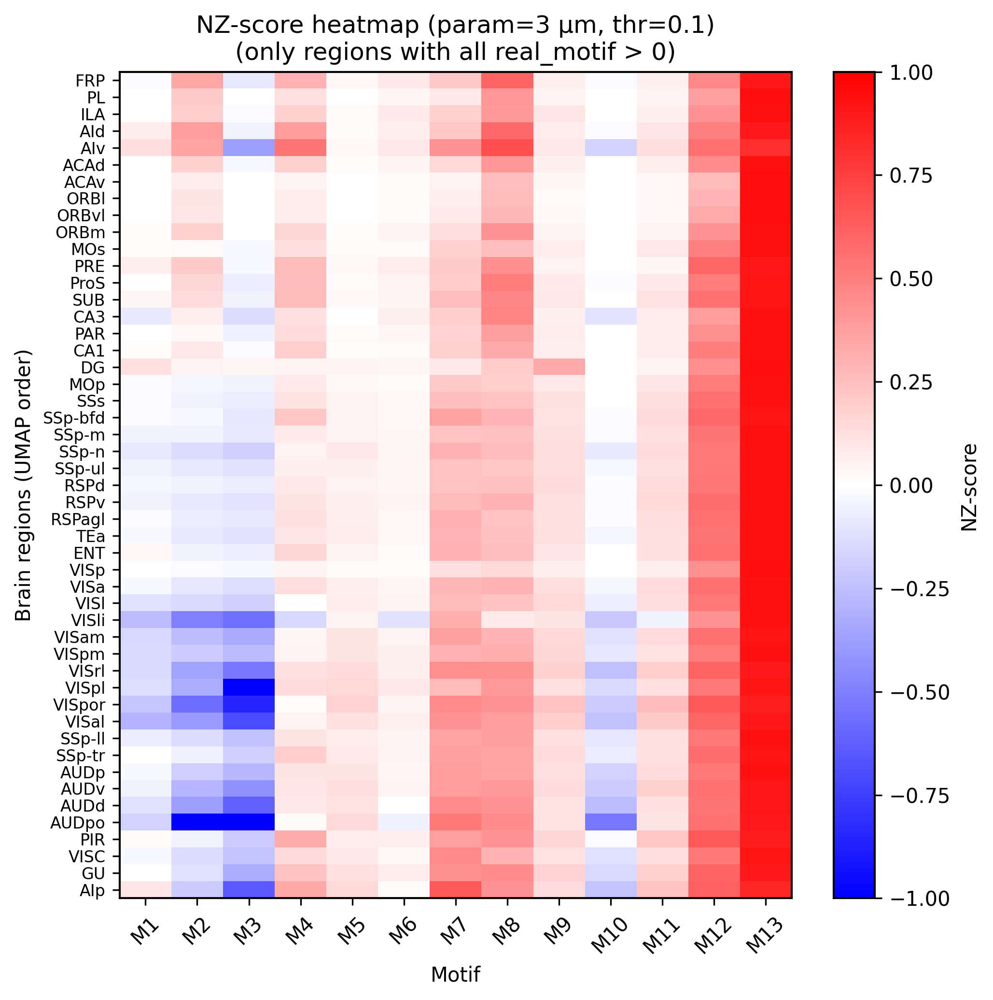

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/9379221.py:40: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


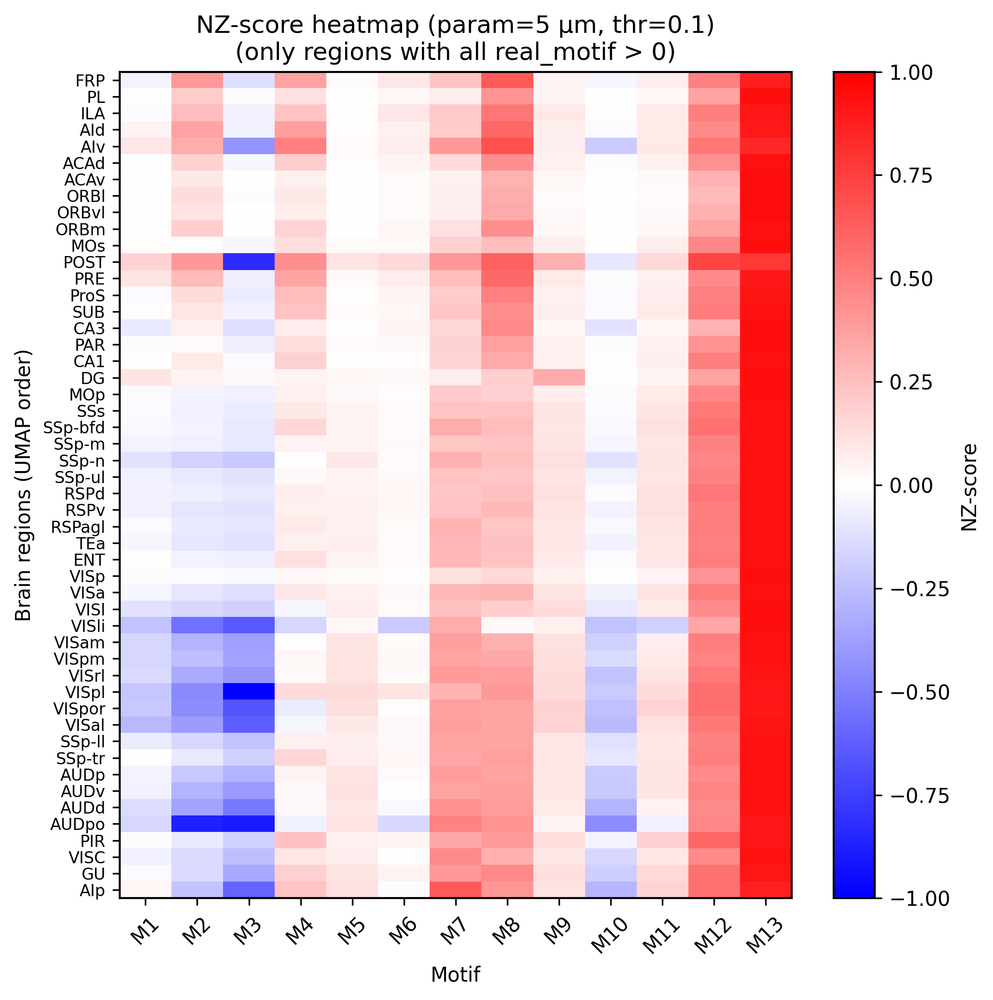

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/9379221.py:40: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


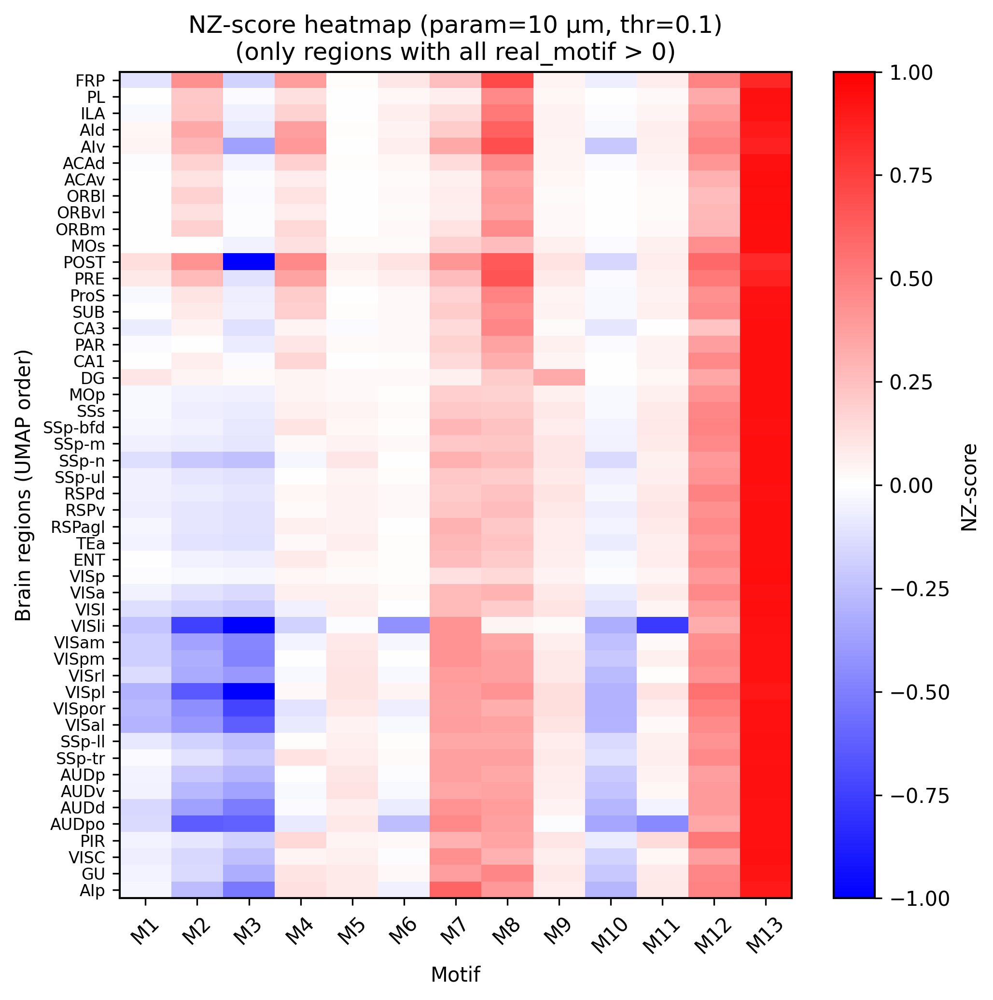

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/9379221.py:40: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


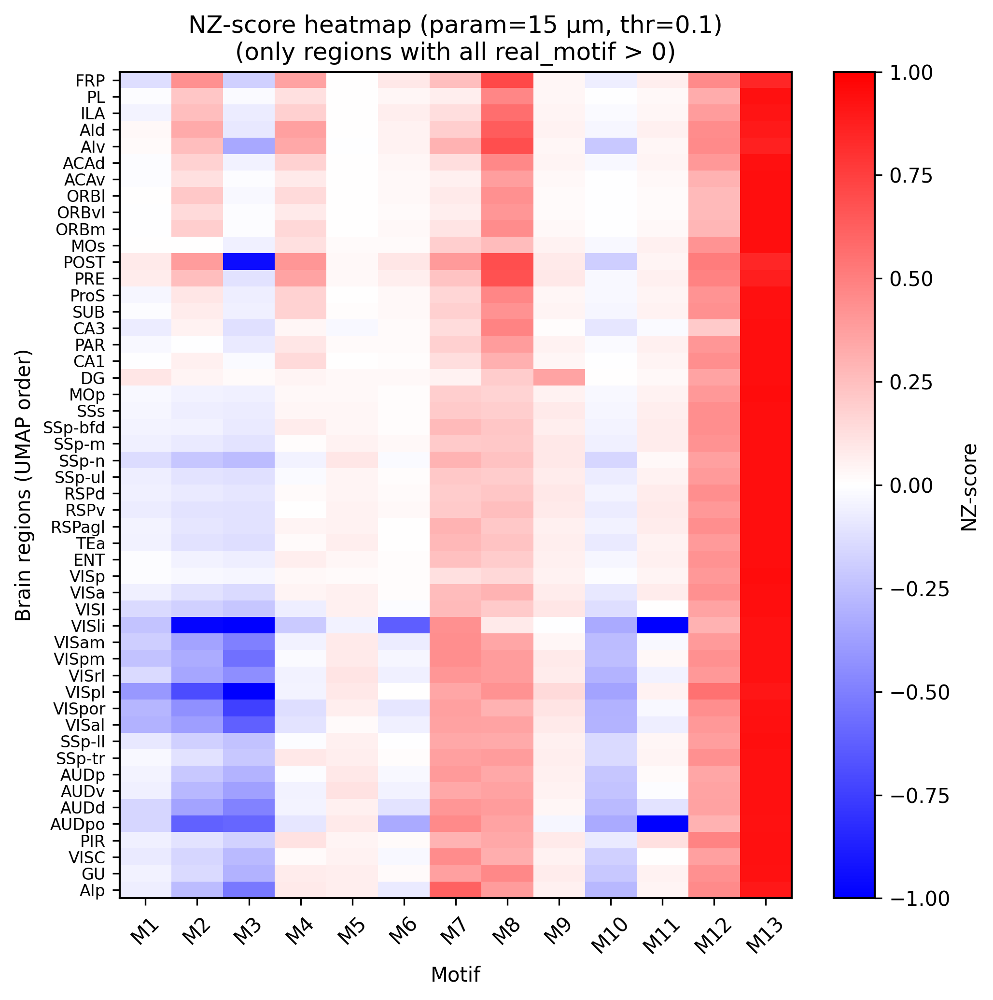

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/9379221.py:40: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


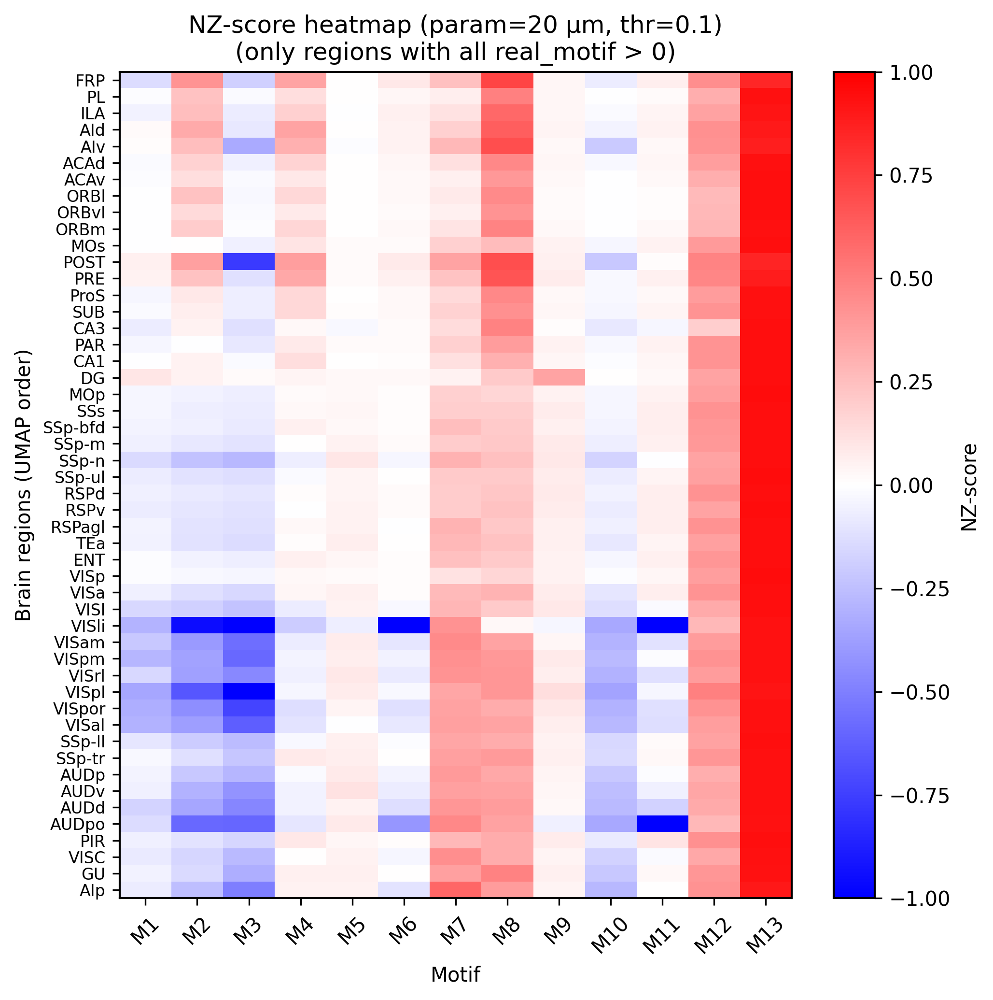

In [ ]:
# ==================== 4. 每个距离阈值单独画 NZ-score 热图（按 UMAP 顺序 + 过滤 real>0） ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_list = [1, 3, 5, 10, 15]
thr_use    = "0.1"   # 和上面聚类用的一致

for p in param_list:
    NZ_rows = []
    region_rows = []

    for r in names:   # names 是你前面按 UMAP+层次聚类排好序的脑区列表
        info = results_all[p][r]
        mr   = info["motif_results"][thr_use]

        real = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        # 如果这个脑区在该阈值下有任何 motif 计数 <= 0，就跳过整行
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.):
            # print(f"[INFO] param={p} µm, region={r} 因 real_motif 包含非正值，跳过")
            continue
        
        
        nz = np.asarray(mr["NZ"], float)   # 13 维 NZ-score
        NZ_rows.append(nz)
        region_rows.append(r)

    if not NZ_rows:
        print(f"[INFO] param={p} µm 下没有满足 real_motif>0 的脑区，跳过绘图")
        continue

    NZ_mat = np.vstack(NZ_rows)

    plt.figure(figsize=(7, 7))
    im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)

    plt.colorbar(im, label="NZ-score")
    plt.yticks(range(len(region_rows)), region_rows, fontsize=8)
    plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)

    plt.title(f"NZ-score heatmap (param={p} µm, thr={thr_use})\n"
              f"(only regions with all real_motif > 0)")
    plt.xlabel("Motif")
    plt.ylabel("Brain regions (UMAP order)")

    plt.tight_layout()
    plt.savefig(f"Fig s1a_{p}um.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2010923877.py:74: RuntimeWarning: invalid value encountered in log10
  NZ_p  = np.log10(1 + 8*np.vstack([cur_map[r] for r in common]))  # y
/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2010923877.py:73: RuntimeWarning: invalid value encountered in log10
  NZ_5  = np.log10(1 + 8*np.vstack([ref_map[r] for r in common]))  # x


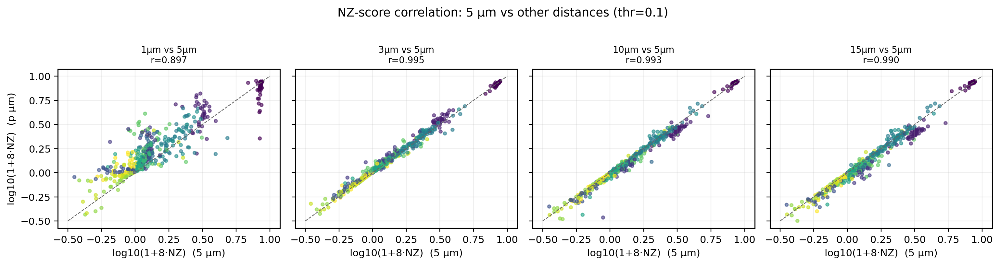

Reference: param=5 µm, thr=0.1, valid regions=50
1µm vs 5µm: r=0.897 (common regions=37, points kept=473)
3µm vs 5µm: r=0.995 (common regions=49, points kept=625)
10µm vs 5µm: r=0.993 (common regions=50, points kept=638)
15µm vs 5µm: r=0.990 (common regions=50, points kept=635)


/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2010923877.py:133: RuntimeWarning: invalid value encountered in log10
  Y = np.log10(1 + 8*np.vstack([cur_map[r] for r in common])).flatten()
/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2010923877.py:132: RuntimeWarning: invalid value encountered in log10
  X = np.log10(1 + 8*np.vstack([ref_map[r] for r in common])).flatten()


In [88]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Scatter + Pearson r: NZ(param=p) vs NZ(param=5) at thr="0.1"
# - use existing NZ (no re-computation)
# - same filter as your heatmap: real>=0.9 and er_mu_mc[:12]>0
# - drop points where x<-0.5 or y<-0.5 after log transform
# ============================================================

pkl_path   = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
thr_use    = "0.1"
param_ref  = 5
param_list = [1, 3, 10, 15]          # compare these to 5um
save_name  = "Fig_s1b_param_vs_5um_thr01.svg"
drop_below = -0.5

with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]

# ---- build ref map for param=5: region -> NZ(13) (filtered) ----
ref_map = {}
for r in names:
    if param_ref not in results_all or r not in results_all[param_ref]:
        continue
    mr = results_all[param_ref][r].get("motif_results", {}).get(thr_use, None)
    if mr is None:
        continue
    real  = np.asarray(mr.get("real_motif", None), float)
    mu_mc = np.asarray(mr.get("er_mu_mc", None), float)
    nz    = np.asarray(mr.get("NZ", None), float)
    if real is None or mu_mc is None or nz is None or nz.shape != (13,):
        continue
    if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
        continue
    ref_map[r] = nz

if len(ref_map) == 0:
    raise RuntimeError(f"No valid regions for param={param_ref}, thr={thr_use}.")

# ---- panels: each param vs 5um ----
fig, axes = plt.subplots(1, len(param_list), figsize=(14, 3.6), dpi=220, sharex=True, sharey=True)

for ax, p in zip(axes, param_list):
    cur_map = {}
    if p not in results_all:
        ax.set_title(f"{p}µm vs 5µm\n(param missing)")
        ax.axis("off")
        continue

    for r in names:
        if r not in results_all[p]:
            continue
        mr = results_all[p][r].get("motif_results", {}).get(thr_use, None)
        if mr is None:
            continue
        real  = np.asarray(mr.get("real_motif", None), float)
        mu_mc = np.asarray(mr.get("er_mu_mc", None), float)
        nz    = np.asarray(mr.get("NZ", None), float)
        if real is None or mu_mc is None or nz is None or nz.shape != (13,):
            continue
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue
        cur_map[r] = nz

    common = [r for r in names if (r in ref_map) and (r in cur_map)]
    if len(common) == 0:
        ax.set_title(f"{p}µm vs 5µm\n(no common regions)")
        ax.axis("off")
        continue

    NZ_5  = np.log10(1 + 8*np.vstack([ref_map[r] for r in common]))  # x
    NZ_p  = np.log10(1 + 8*np.vstack([cur_map[r] for r in common]))  # y

    x = NZ_5.flatten()
    y = NZ_p.flatten()
    n_region, n_motif = NZ_5.shape
    motif_ids = np.tile(np.arange(n_motif), n_region)

    mask = np.isfinite(x) & np.isfinite(y) & (x >= drop_below) & (y >= drop_below)
    x, y, motif_ids = x[mask], y[mask], motif_ids[mask]

    R = np.corrcoef(x, y)[0, 1] if x.size > 1 else np.nan

    sc = ax.scatter(x, y, s=10, alpha=0.6, c=motif_ids, cmap="viridis_r")
    ax.plot([-0.5, 1], [-0.5, 1], ls="--", lw=0.8, color="0.4")
    ax.set_title(f"{p}µm vs 5µm\nr={R:.3f}", fontsize=9)
    ax.grid(True, alpha=0.2)

axes[0].set_xlabel("log10(1+8·NZ)  (5 µm)")
axes[0].set_ylabel("log10(1+8·NZ)  (p µm)")
for ax in axes[1:]:
    ax.set_xlabel("log10(1+8·NZ)  (5 µm)")

# cbar = fig.colorbar(sc, ax=axes, fraction=0.025, pad=0.02)
# cbar.set_label("Motif (M1–M13)")
# cbar.set_ticks(range(13))
# cbar.set_ticklabels([f"M{i+1}" for i in range(13)])

plt.suptitle(f"NZ-score correlation: 5 µm vs other distances (thr={thr_use})", y=1.02)
plt.tight_layout()
plt.savefig(save_name, bbox_inches="tight", dpi=300, transparent=True)
plt.show()

print(f"Reference: param={param_ref} µm, thr={thr_use}, valid regions={len(ref_map)}")
for p in param_list:
    if p not in results_all:
        print(f"{p}µm: param missing")
        continue
    cur_map = {}
    for r in names:
        if r not in results_all[p]:
            continue
        mr = results_all[p][r].get("motif_results", {}).get(thr_use, None)
        if mr is None:
            continue
        real  = np.asarray(mr.get("real_motif", None), float)
        mu_mc = np.asarray(mr.get("er_mu_mc", None), float)
        nz    = np.asarray(mr.get("NZ", None), float)
        if real is None or mu_mc is None or nz is None or nz.shape != (13,):
            continue
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue
        cur_map[r] = nz

    common = [r for r in names if (r in ref_map) and (r in cur_map)]
    if len(common) == 0:
        print(f"{p}µm: no common regions")
        continue

    X = np.log10(1 + 8*np.vstack([ref_map[r] for r in common])).flatten()
    Y = np.log10(1 + 8*np.vstack([cur_map[r] for r in common])).flatten()
    m = np.isfinite(X) & np.isfinite(Y) & (X >= drop_below) & (Y >= drop_below)
    r = np.corrcoef(X[m], Y[m])[0, 1] if m.sum() > 1 else np.nan
    print(f"{p}µm vs 5µm: r={r:.3f} (common regions={len(common)}, points kept={m.sum()})")

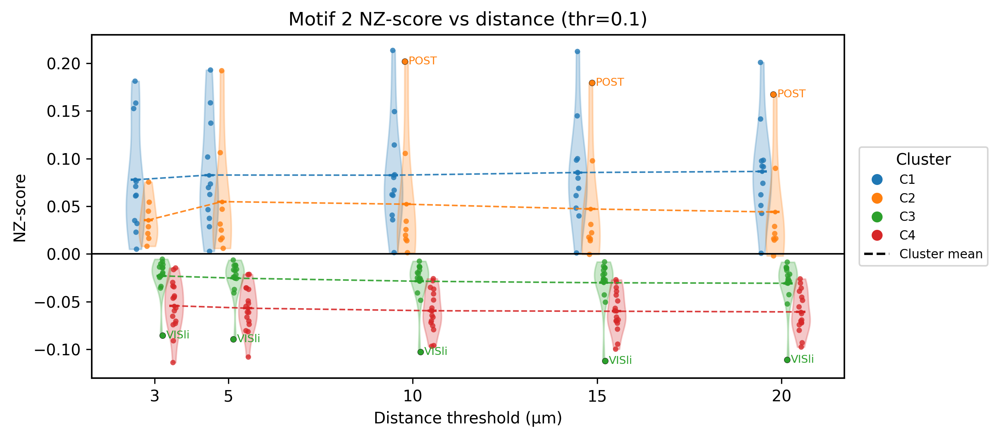

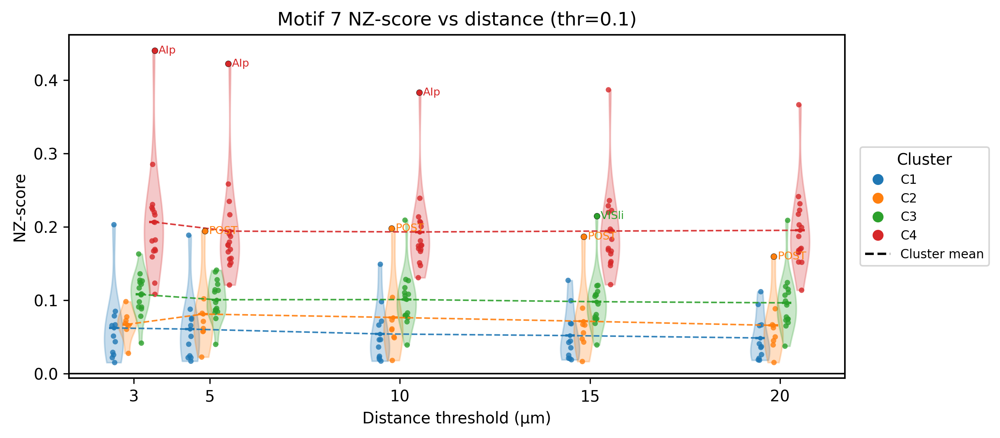

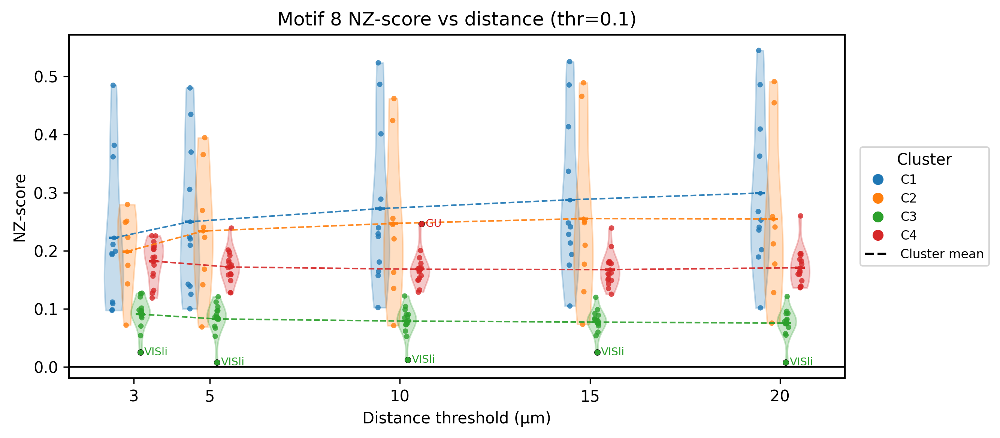

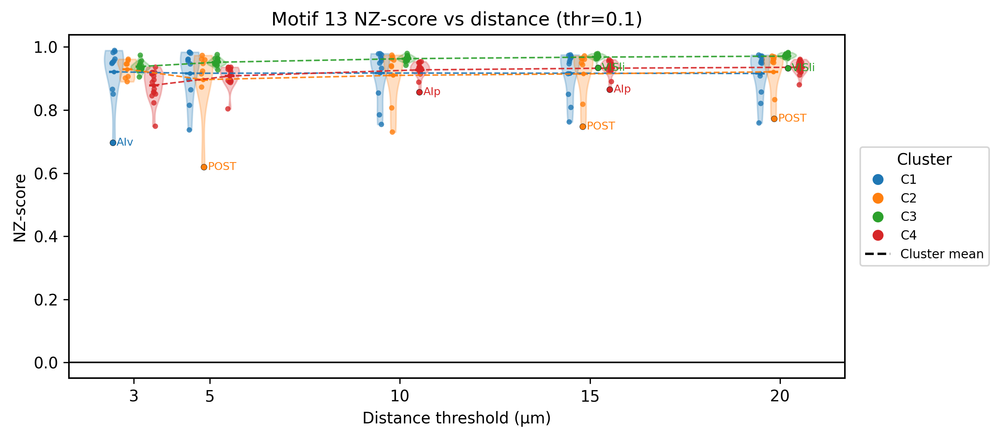

In [27]:
# ==================== 5. motif 2/7/8/13：按聚类类别随距离阈值变化的 NZ-score violin 图 + outlier 高亮 ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_list  = [3, 5, 10, 15, 20]      # 距离阈值
thr_use     = "0.1"                   # 强度阈值
motif_ids   = [2, 7, 8, 13]           # 要看的 motif（1-based）
unique_cls  = np.unique(labels)
n_clust     = len(unique_cls)
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# 预先缓存：在每个距离阈值下通过过滤的 NZ 向量
NZ_by_param = {p: {} for p in param_list}
for i, r in enumerate(names):
    for p in param_list:
        mr    = results_all[p][r]["motif_results"][thr_use]
        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue
        NZ_by_param[p][i] = np.asarray(mr["NZ"], float)

for m_id in motif_ids:
    j   = m_id - 1
    fig, ax = plt.subplots(figsize=(9, 4))
    width   = 0.35

    mean_x = {c: [] for c in unique_cls}
    mean_y = {c: [] for c in unique_cls}

    for ci, c in enumerate(unique_cls):
        offset         = (ci - (n_clust - 1) / 2) * width
        data_list      = []
        pos_list       = []
        names_by_group = []

        for p in param_list:
            idx_i = [i for i in range(len(names)) if labels[i] == c and i in NZ_by_param[p]]
            if not idx_i:
                continue
            vals         = np.array([NZ_by_param[p][i][j] for i in idx_i])
            region_group = [names[i] for i in idx_i]
            x_center     = p + offset

            data_list.append(vals)
            pos_list.append(x_center)
            names_by_group.append(region_group)
            mean_x[c].append(x_center)
            mean_y[c].append(vals.mean())

        if not data_list:
            continue

        parts = ax.violinplot(data_list, positions=pos_list,
                              showmeans=True, showextrema=False, showmedians=False)
        for body in parts["bodies"]:
            body.set_facecolor(cluster_col[c]); body.set_edgecolor(cluster_col[c]); body.set_alpha(0.25)

        for x0, vals, regs in zip(pos_list, data_list, names_by_group):
            q1, q3  = np.percentile(vals, [25, 75])
            iqr     = q3 - q1
            lower   = q1 - 3 * iqr
            upper   = q3 + 3 * iqr
            is_out  = (vals < lower) | (vals > upper)
            jitter  = (np.random.rand(len(vals)) - 0.5) * 0.1
            x_base  = np.full(len(vals), x0) + jitter

            ax.scatter(x_base[~is_out], vals[~is_out], s=12, alpha=0.8,
                       color=cluster_col[c], edgecolors="none")

            ax.scatter(x_base[is_out], vals[is_out], s=15, alpha=1.0,
                       facecolors=cluster_col[c], edgecolors="black",
                       linewidths=0.2, zorder=5)

            for xo, yo, name_out in zip(x_base[is_out], vals[is_out], np.array(regs)[is_out]):
                ax.text(xo + 0.1, yo, name_out, fontsize=7,
                        va="center", ha="left", color=cluster_col[c])

    for c in unique_cls:
        xs = np.array(mean_x[c]); ys = np.array(mean_y[c])
        if len(xs) == 0:
            continue
        idx = np.argsort(xs)
        ax.plot(xs[idx], ys[idx], color=cluster_col[c], linewidth=1,
                alpha=0.9, linestyle="--", marker="o", markersize=2,
                label=f"C{int(c)} mean" if m_id == motif_ids[0] else None)

    ax.axhline(0, color="k", lw=1)
    ax.set_xlabel("Distance threshold (µm)")
    ax.set_ylabel("NZ-score")
    ax.set_title(f"Motif {m_id} NZ-score vs distance (thr={thr_use})")
    ax.set_xticks(param_list); ax.set_xticklabels([str(p) for p in param_list])

    handles = [plt.Line2D([0], [0], marker="o", linestyle="",
                           color=cluster_col[c], label=f"C{int(c)}")
               for c in unique_cls]
    handles += [plt.Line2D([0], [0], color="k", linestyle="--", label="Cluster mean")]

    ax.legend(handles=handles, title="Cluster", fontsize=8,
              loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)

    plt.tight_layout()
    plt.savefig(f"7.motif{m_id}_NZ_vs_param.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2514217956.py:41: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


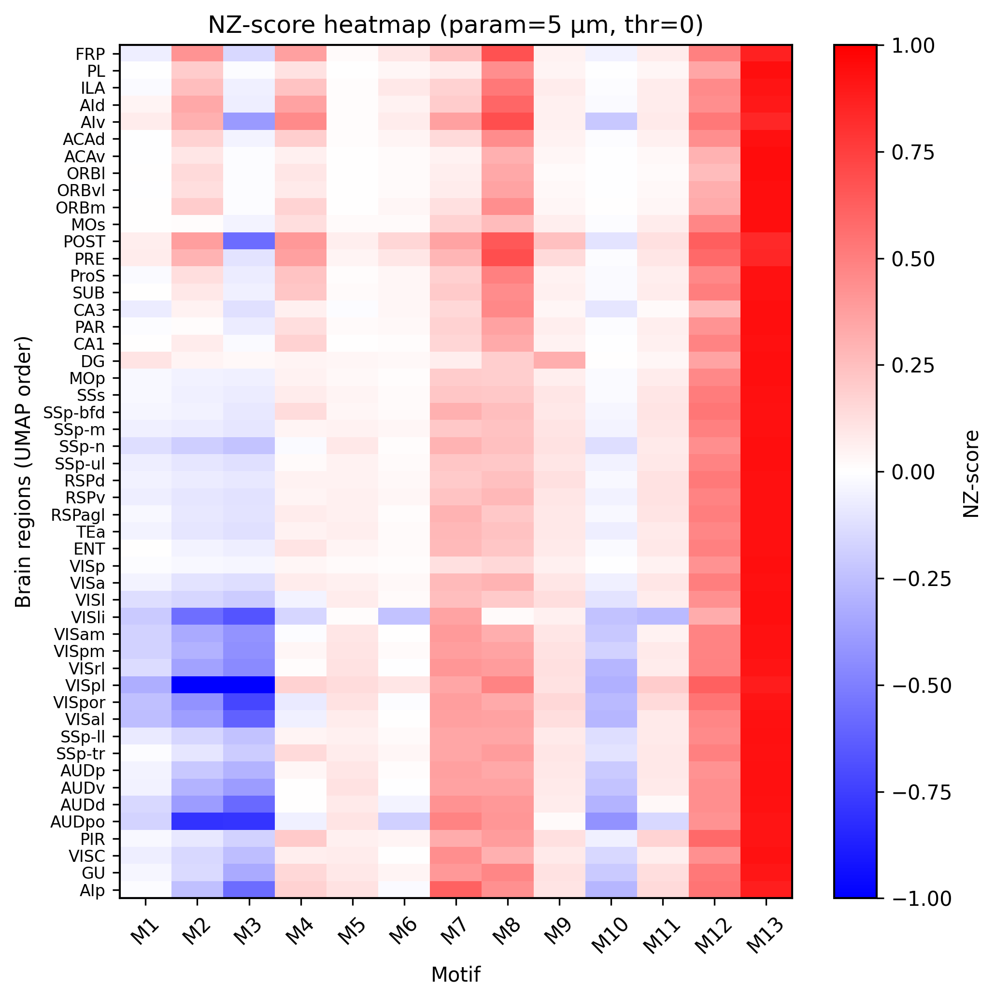

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/2514217956.py:41: RuntimeWarning: invalid value encountered in log10
  im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)


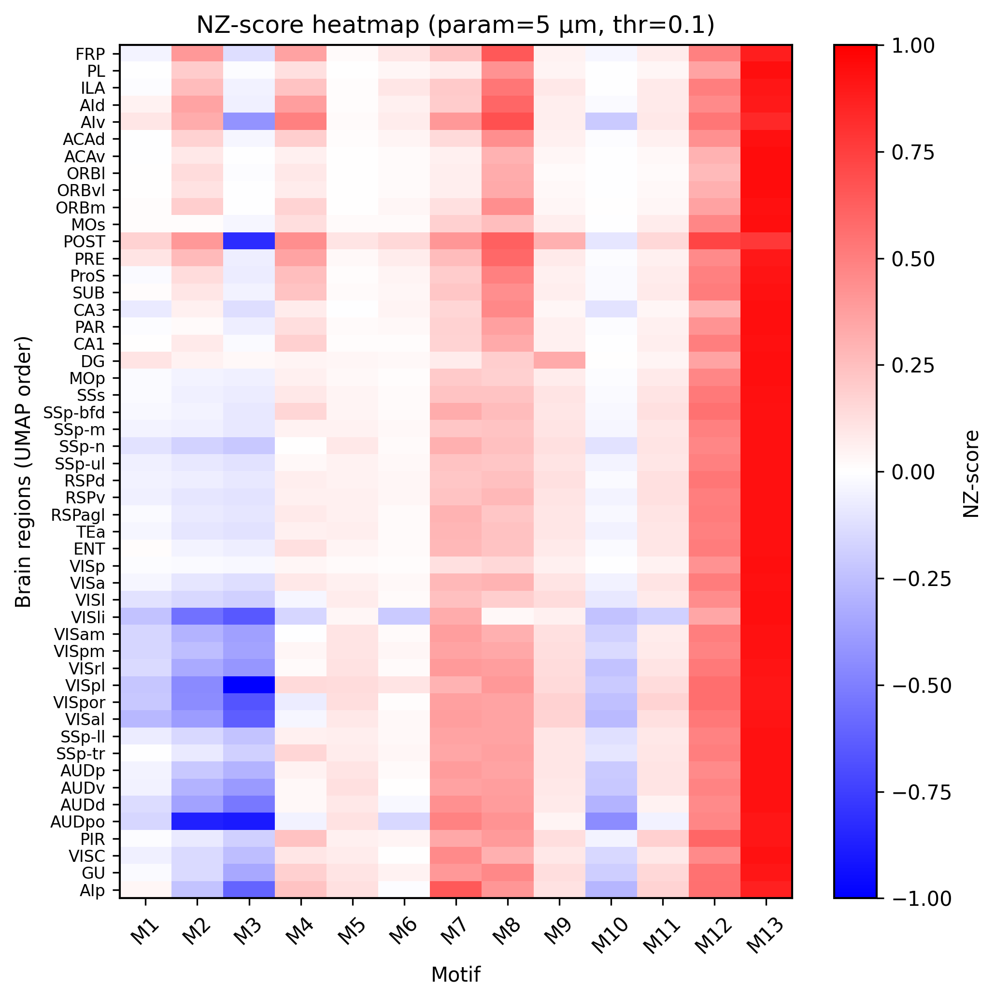

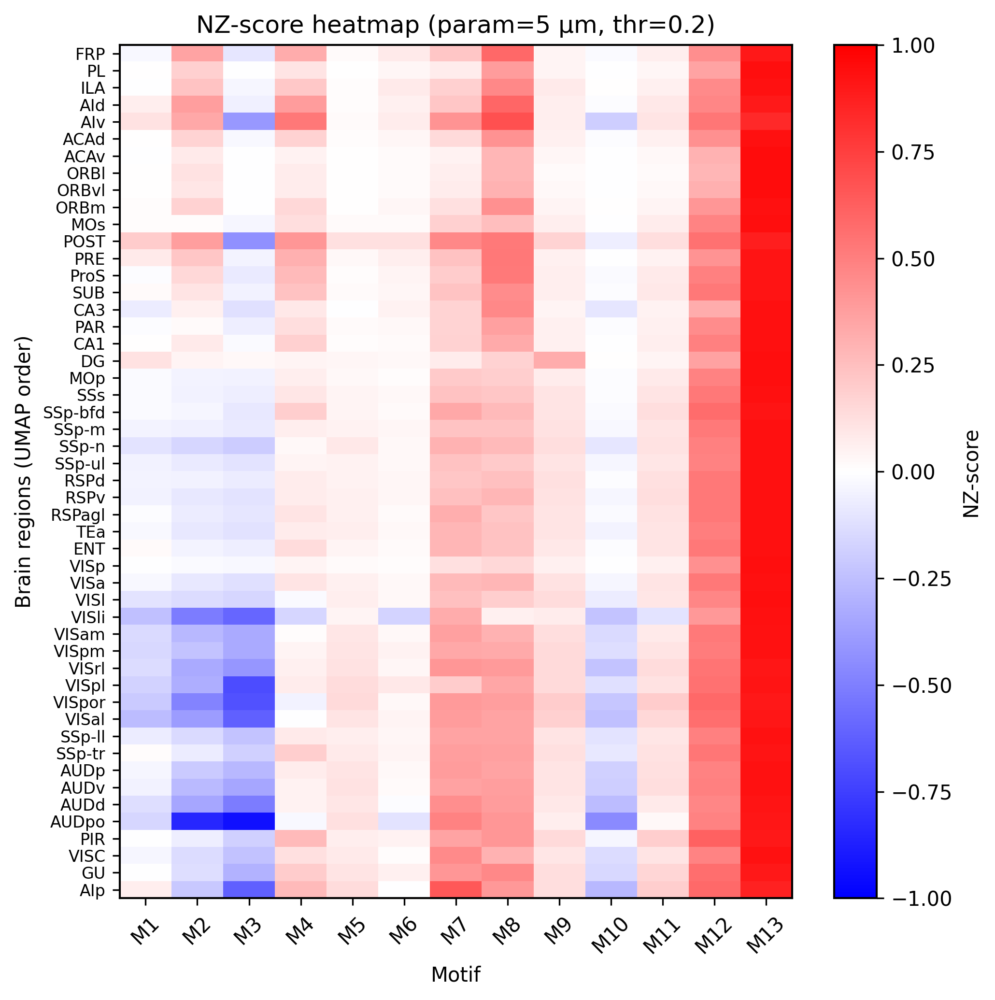

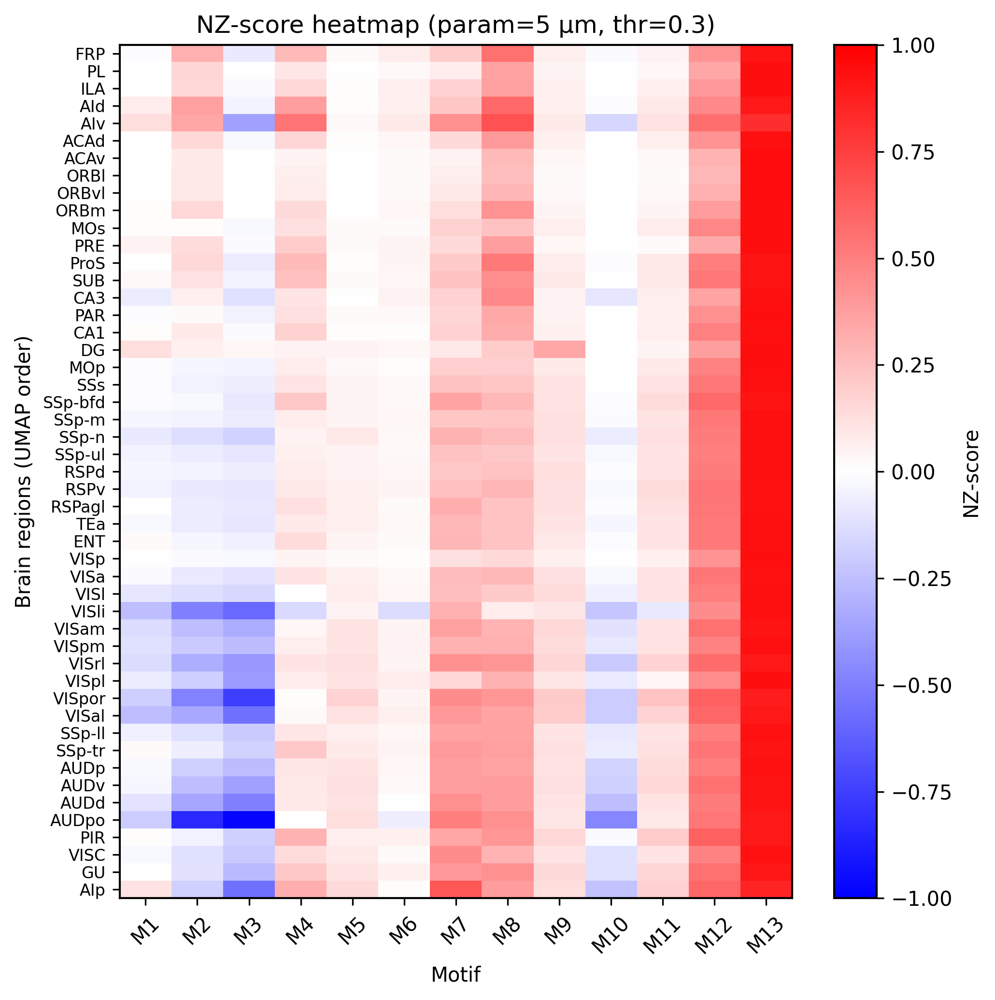

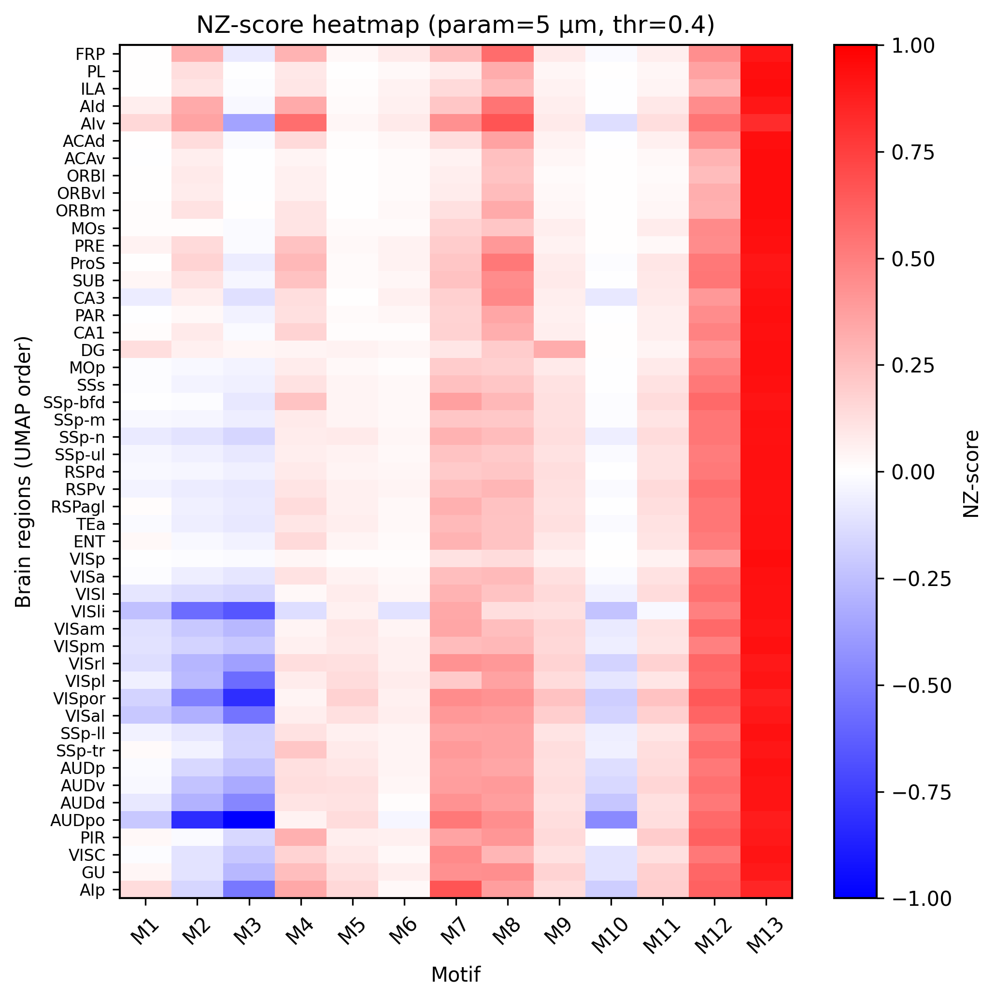

In [84]:
# ==================== 5. 固定 5 µm，遍历不同强度阈值画 NZ-score 热图 ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_fix = 5
thr_list  = ["0", "0.1", "0.2", "0.3", "0.4"]   # 你数据里那 5 个强度阈值

for thr_use in thr_list:
    NZ_rows = []
    region_rows = []

    for r in names:   # names 是前面按 UMAP+层次聚类排好序的脑区列表
        info = results_all[param_fix][r]
        mr   = info["motif_results"].get(thr_use)
        if mr is None:
            continue

        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)

        # 过滤条件：real_motif 所有元素 >=0.9，且 mu_mc 前 12 个都 >0
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue

        nz = np.asarray(mr["NZ"], float)   # 13 维 NZ-score
        NZ_rows.append(nz)
        region_rows.append(r)

    if not NZ_rows:
        print(f"[INFO] param={param_fix} µm, thr={thr_use} 下没有满足条件的脑区，跳过绘图")
        continue

    NZ_mat = np.vstack(NZ_rows)

    plt.figure(figsize=(7, 7))
    im = plt.imshow(np.nan_to_num(np.log10(1 + 8*NZ_mat), nan=-100.0, posinf=-100.0, neginf=-100.0), aspect="auto", cmap="bwr", vmin=-1, vmax=1)

    plt.colorbar(im, label="NZ-score")
    plt.yticks(range(len(region_rows)), region_rows, fontsize=8)
    plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)

    plt.title(f"NZ-score heatmap (param={param_fix} µm, thr={thr_use})"
)
    plt.xlabel("Motif")
    plt.ylabel("Brain regions (UMAP order)")

    plt.tight_layout()
    plt.savefig(f"Fig s5a_{thr_use}.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/3614172700.py:51: RuntimeWarning: invalid value encountered in log10
  NZ_base = np.log10(1 + 8*np.vstack([base_map[r] for r in common]))
/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/3614172700.py:52: RuntimeWarning: invalid value encountered in log10
  NZ_cur  = np.log10(1 + 8*np.vstack([cur_map[r]  for r in common]))


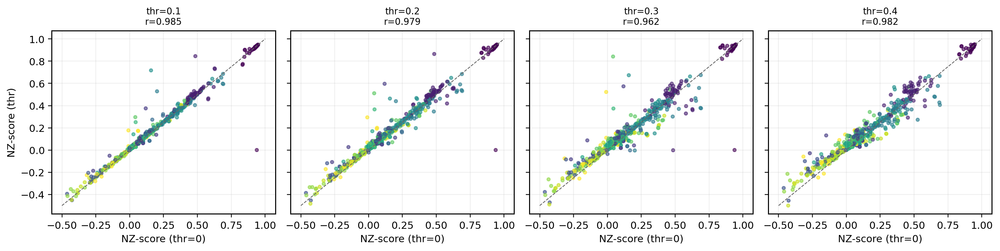

Base: param=5, thr=0, regions=55
thr=0.1: Pearson r vs thr=0 = 0.985 (points kept=701)
thr=0.2: Pearson r vs thr=0 = 0.979 (points kept=701)
thr=0.3: Pearson r vs thr=0 = 0.962 (points kept=701)
thr=0.4: Pearson r vs thr=0 = 0.982 (points kept=688)


/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/3614172700.py:98: RuntimeWarning: invalid value encountered in log10
  X = np.log10(1 + 8*np.vstack([base_map[r] for r in common])).flatten()
/var/folders/r5/559b8r_j54z7dqt6lc798x_m0000gn/T/ipykernel_95027/3614172700.py:99: RuntimeWarning: invalid value encountered in log10
  Y = np.log10(1 + 8*np.vstack([cur_map[r]  for r in common])).flatten()


In [83]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# NZ scatter + Pearson r: each pruning thr vs unpruned thr="0"
# - drop points where x<-0.5 or y<-0.5 (after log transform)
# ============================================================

pkl_path  = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
param_fix = 5
thr_base  = "0"
thr_list  = ["0.1", "0.2", "0.3", "0.4"]
save_name = "Fig s5b.svg"

with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"][param_fix]

base_map = {}
for r, info in results.items():
    mr = info.get("motif_results", {}).get(thr_base, None)
    if mr is None:
        continue
    nz = np.asarray(mr.get("NZ", None), float)
    if nz is None or nz.shape != (13,):
        continue
    base_map[r] = nz

if len(base_map) == 0:
    raise RuntimeError(f"No NZ found for base thr={thr_base} at param={param_fix}.")

fig, axes = plt.subplots(1, len(thr_list), figsize=(14, 3.6), dpi=220, sharex=True, sharey=True)

for ax, thr in zip(axes, thr_list):
    cur_map = {}
    for r, info in results.items():
        mr = info.get("motif_results", {}).get(thr, None)
        if mr is None:
            continue
        nz = np.asarray(mr.get("NZ", None), float)
        if nz is None or nz.shape != (13,):
            continue
        cur_map[r] = nz

    common = sorted(set(base_map) & set(cur_map))
    if len(common) == 0:
        ax.set_title(f"thr={thr}\n(no common regions)")
        ax.axis("off")
        continue

    NZ_base = np.log10(1 + 8*np.vstack([base_map[r] for r in common]))
    NZ_cur  = np.log10(1 + 8*np.vstack([cur_map[r]  for r in common]))

    x = NZ_base.flatten()
    y = NZ_cur.flatten()

    n_region, n_motif = NZ_base.shape
    motif_ids = np.tile(np.arange(n_motif), n_region)

    # ---- drop invalid + drop points below -0.5 ----
    mask = np.isfinite(x) & np.isfinite(y) & (x >= -0.5) & (y >= -0.5)
    x, y, motif_ids = x[mask], y[mask], motif_ids[mask]

    R = np.corrcoef(x, y)[0, 1] if x.size > 1 else np.nan

    sc = ax.scatter(x, y, s=10, alpha=0.6, c=motif_ids, cmap="viridis_r")
    ax.plot([-0.5, 1], [-0.5, 1], ls="--", lw=0.8, color="0.4")

    ax.set_title(f"thr={thr}\nr={R:.3f}", fontsize=9)
    ax.grid(True, alpha=0.2)

axes[0].set_xlabel(f"NZ-score (thr={thr_base})")
axes[0].set_ylabel("NZ-score (thr)")
for ax in axes[1:]:
    ax.set_xlabel(f"NZ-score (thr={thr_base})")

plt.tight_layout()
plt.savefig(save_name, bbox_inches="tight", dpi=300, transparent=True)
plt.show()

print(f"Base: param={param_fix}, thr={thr_base}, regions={len(base_map)}")
for thr in thr_list:
    cur_map = {}
    for r, info in results.items():
        mr = info.get("motif_results", {}).get(thr, None)
        if mr is None:
            continue
        nz = np.asarray(mr.get("NZ", None), float)
        if nz is None or nz.shape != (13,):
            continue
        cur_map[r] = nz

    common = sorted(set(base_map) & set(cur_map))
    if len(common) == 0:
        print(f"thr={thr}: no common regions")
        continue

    X = np.log10(1 + 8*np.vstack([base_map[r] for r in common])).flatten()
    Y = np.log10(1 + 8*np.vstack([cur_map[r]  for r in common])).flatten()

    m = np.isfinite(X) & np.isfinite(Y) & (X >= -0.5) & (Y >= -0.5)
    r = np.corrcoef(X[m], Y[m])[0, 1] if m.sum() > 1 else np.nan
    print(f"thr={thr}: Pearson r vs thr={thr_base} = {r:.3f} (points kept={m.sum()})")

有效脑区数（所有强度阈值都通过过滤）: 49


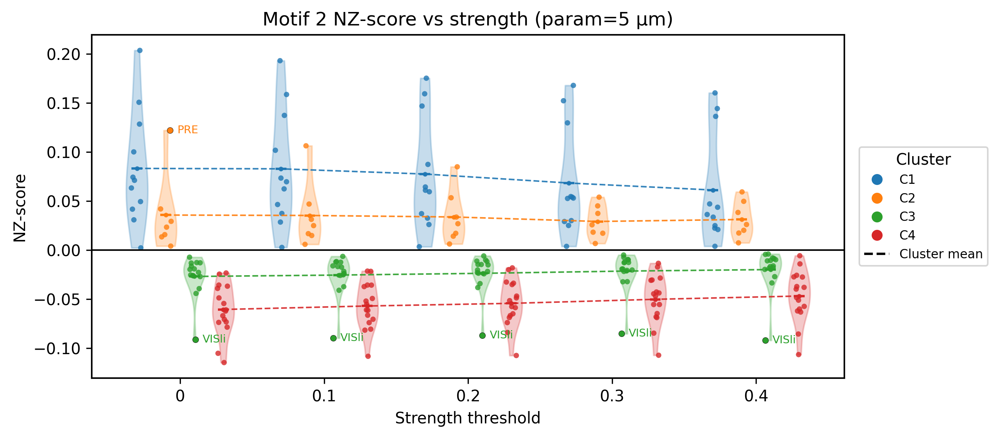

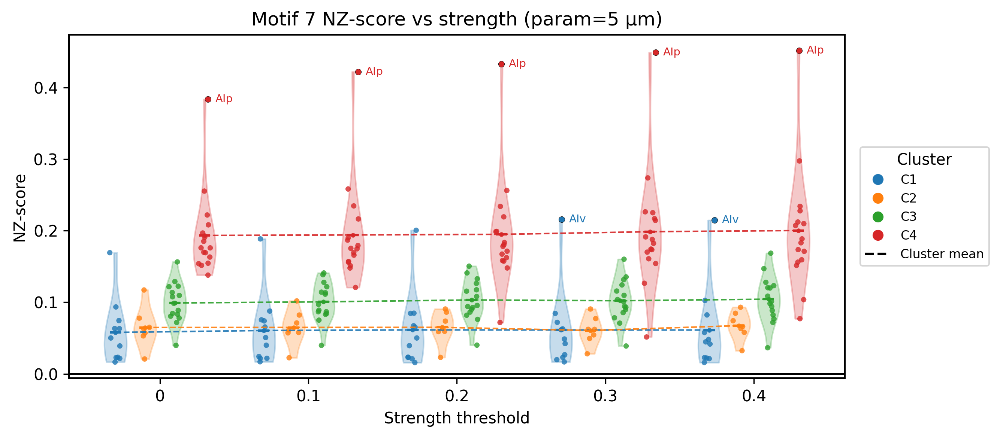

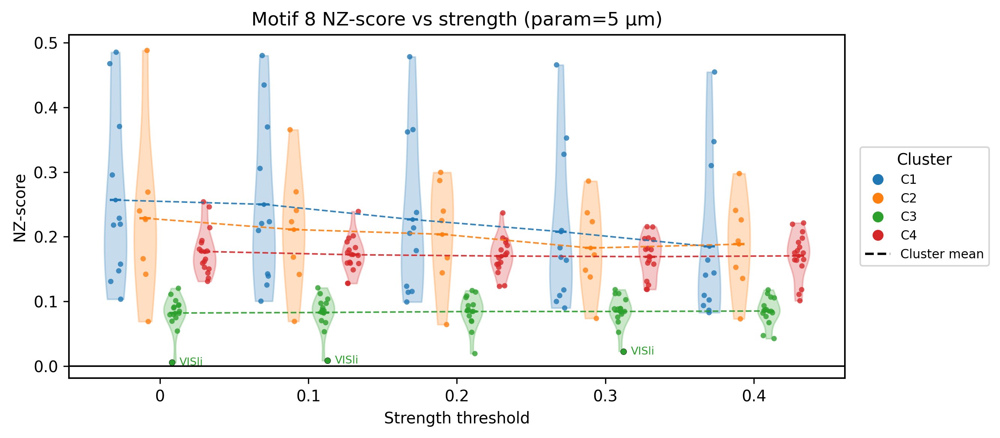

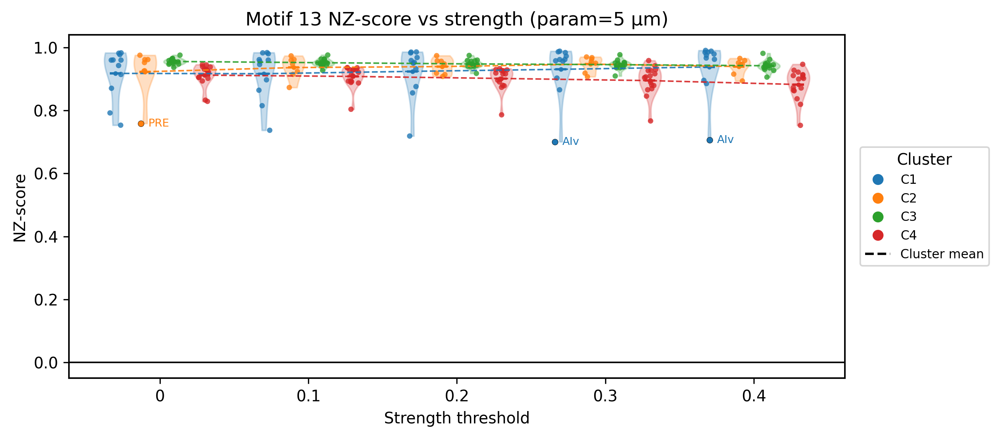

In [29]:
# ==================== motif 2/7/8/13：按聚类类别、随强度阈值变化的 NZ-score violin 图（全阈值一致过滤） ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_use   = 5                                    # 固定距离阈值 5 µm
thr_list    = ["0", "0.1", "0.2", "0.3", "0.4"]    # 不同强度阈值（motif_results 的 key）
x_thr       = np.arange(len(thr_list))             # x 轴：0,1,2,3,4

motif_ids   = [2, 7, 8, 13]                        # 要看的 motif（1-based）
unique_cls  = np.unique(labels)                    # 来自之前 UMAP+聚类
n_clust     = len(unique_cls)
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# ---------- 1) 先根据“所有强度阈值”一起过滤，选出 valid_idx ----------
valid_idx = []
for i, r in enumerate(names):
    ok = True
    for thr in thr_list:
        mr    = results_all[param_use][r]["motif_results"][thr]
        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            ok = False
            break
    if ok:
        valid_idx.append(i)

print(f"有效脑区数（所有强度阈值都通过过滤）: {len(valid_idx)}")

# ---------- 2) 缓存各强度阈值下的 NZ（只对 valid_idx） ----------
NZ_by_thr = {thr: {} for thr in thr_list}
for i in valid_idx:
    r = names[i]
    for thr in thr_list:
        mr = results_all[param_use][r]["motif_results"][thr]
        NZ_by_thr[thr][i] = np.asarray(mr["NZ"], float)   # 13 维

# ---------- 3) 对每个 motif 画一张 violin + outlier + 均值虚线 ----------
for m_id in motif_ids:
    j = m_id - 1   # 0-based index

    fig, ax = plt.subplots(figsize=(9, 4))
    width   = 0.20   # 不同 cluster 在同一强度上的横向偏移

    # 记录 cluster 在不同强度阈值下的均值
    mean_x = {c: [] for c in unique_cls}
    mean_y = {c: [] for c in unique_cls}

    for ci, c in enumerate(unique_cls):
        offset         = (ci - (n_clust - 1) / 2.) * width
        data_list      = []   # 当前 cluster 在不同强度阈值下的一组组值
        pos_list       = []   # 每组的 x 位置
        names_by_group = []   # 每组对应的脑区名

        for ti, thr in enumerate(thr_list):
            # 限制在 valid_idx 之内 & 当前 cluster
            idx_i = [
                i for i in valid_idx
                if labels[i] == c and i in NZ_by_thr[thr]
            ]
            if not idx_i:
                continue

            vals = np.array([NZ_by_thr[thr][i][j] for i in idx_i])
            regs = [names[i] for i in idx_i]
            x_center = x_thr[ti] + offset

            data_list.append(vals)
            pos_list.append(x_center)
            names_by_group.append(regs)

            mean_x[c].append(x_center)
            mean_y[c].append(vals.mean())

        if not data_list:
            continue

        # violin：同一 cluster、不同强度阈值的分布
        parts = ax.violinplot(
            data_list,
            positions=pos_list,
            widths=0.15,
            showmeans=True,
            showextrema=False,
            showmedians=False,
        )
        for body in parts["bodies"]:
            body.set_facecolor(cluster_col[c])
            body.set_edgecolor(cluster_col[c])
            body.set_alpha(0.25)

        # 点 + outlier 高亮
        for x0, vals, regs in zip(pos_list, data_list, names_by_group):
            q1, q3 = np.percentile(vals, [25, 75])
            iqr    = q3 - q1
            lower  = q1 - 3 * iqr
            upper  = q3 + 3 * iqr
            is_out = (vals < lower) | (vals > upper)

            jitter = (np.random.rand(len(vals)) - 0.5) * 0.08
            x_base = np.full(len(vals), x0) + jitter

            # 普通点
            ax.scatter(
                x_base[~is_out], vals[~is_out],
                s=12, alpha=0.8,
                color=cluster_col[c], edgecolors="none",
            )

            # outlier 点 + 标名字
            ax.scatter(
                x_base[is_out], vals[is_out],
                s=15, alpha=1.0,
                facecolors=cluster_col[c],
                edgecolors="black",
                linewidths=0.2,
                zorder=5,
            )
            for xo, yo, name_out in zip(x_base[is_out], vals[is_out], np.array(regs)[is_out]):
                ax.text(
                    xo + 0.05, yo, name_out,
                    fontsize=7,
                    va="center", ha="left",
                    color=cluster_col[c],
                )

    # 画 cluster 均值虚线（x 用 x_center，自动对齐 violin）
    for c in unique_cls:
        xs = np.array(mean_x[c]); ys = np.array(mean_y[c])
        if len(xs) == 0:
            continue
        order = np.argsort(xs)
        ax.plot(
            xs[order], ys[order],
            color=cluster_col[c],
            linewidth=1,
            alpha=0.9,
            linestyle="--",
            marker="o",
            markersize=2,
        )

    ax.axhline(0, color="k", lw=1)
    ax.set_xlabel("Strength threshold")
    ax.set_ylabel("NZ-score")
    ax.set_title(f"Motif {m_id} NZ-score vs strength (param={param_use} µm)")

    ax.set_xticks(x_thr)
    ax.set_xticklabels(thr_list)

    # 颜色 = cluster；虚线 = cluster mean
    handles = [
        plt.Line2D([0], [0], marker="o", linestyle="",
                   color=cluster_col[c], label=f"C{int(c)}")
        for c in unique_cls
    ] + [
        plt.Line2D([0], [0], color="k", linestyle="--", label="Cluster mean")
    ]
    ax.legend(
        handles=handles,
        title="Cluster",
        fontsize=8,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        borderaxespad=0.0,
    )

    plt.tight_layout()
    plt.savefig(f"9.motif{m_id}_NZ_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

In [15]:
import pickle
import numpy as np

pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]

res_5 = results_all[5]   # 5 µm

all_w = []

for region, info in res_5.items():
    # 假设 info["sc"] 就是加权连接矩阵；如果是 dict，就改成相应的 key
    W = np.asarray(info["sc"], float)

    # 去掉对角线 & 只保留 >0 的连接
    mask = ~np.eye(W.shape[0], dtype=bool)
    vals = W[mask]
    vals = vals[vals > 0]

    if vals.size:
        all_w.append(vals)

all_w = np.concatenate(all_w)

# 选择截断分位数：比如 99 分位数
q = 95
cut = np.percentile(all_w, q)

w_plot = all_w[all_w <= cut]

print(f"总连接数: {all_w.size}")
print(f"{q}th 分位数截断值: {cut:.4g}")
print(f"截断后剩余: {w_plot.size}")

总连接数: 1443616
95th 分位数截断值: 28.01
截断后剩余: 1371435


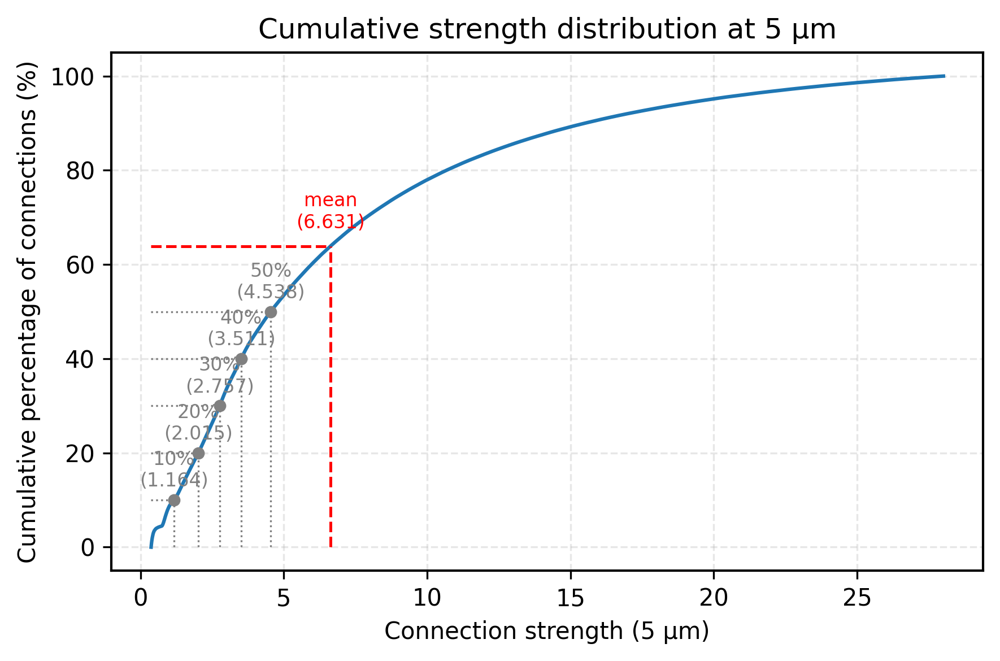

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# w_plot：已经长尾截断好的边强度

# === 用排序后的数据画经验 CDF（更平滑）===
w_sorted = np.sort(w_plot)
n = len(w_sorted)
cum_pct = np.arange(1, n + 1) / n * 100  # 1 ~ 100%

plt.figure(figsize=(6, 4))
plt.plot(w_sorted, cum_pct, linewidth=1.5)
plt.xlabel("Connection strength (5 µm)")
plt.ylabel("Cumulative percentage of connections (%)")
plt.title("Cumulative strength distribution at 5 µm")
plt.grid(True, linestyle="--", alpha=0.3)

x_min = w_sorted[0]

# ---- 用精确分位数来标点：x=分位数强度, y=对应百分位 ----
q_levels = np.array([10, 20, 30, 40, 50])          # 百分位
q_vals   = np.quantile(w_plot, q_levels / 100.0)   # 对应的强度

for q_perc, qx in zip(q_levels, q_vals):
    cy = q_perc

    # 竖线
    plt.plot([qx, qx], [0, cy],
             color="gray", linestyle=":", linewidth=0.8)
    # 横线
    plt.plot([x_min, qx], [cy, cy],
             color="gray", linestyle=":", linewidth=0.8)

    plt.scatter([qx], [cy], color="gray", s=18, zorder=5)
    # ✅ 标注百分位 + 对应的强度数值
    plt.text(
        qx, cy + 2,
        f"{q_perc}%\n({qx:.3f})",   # 比如：10%\n(0.023)
        ha="center", va="bottom",
        fontsize=8, color="gray",
    )

# ---- 均值的位置：x=mean, y=均值在经验分布中的百分位 ----
mu = w_plot.mean()
rank = np.searchsorted(w_sorted, mu, side="right")
cy_mean = rank / n * 100.0

plt.plot([mu, mu], [0, cy_mean],
         color="red", linestyle="--", linewidth=1.2)
plt.plot([x_min, mu], [cy_mean, cy_mean],
         color="red", linestyle="--", linewidth=1.2)

# ✅ 均值也标注具体数值
plt.text(
    mu, cy_mean + 3,
    f"mean\n({mu:.3f})",
    ha="center", va="bottom",
    fontsize=8, color="red",
)

plt.tight_layout()
plt.savefig(f"8.wb_strength_cum_5um.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

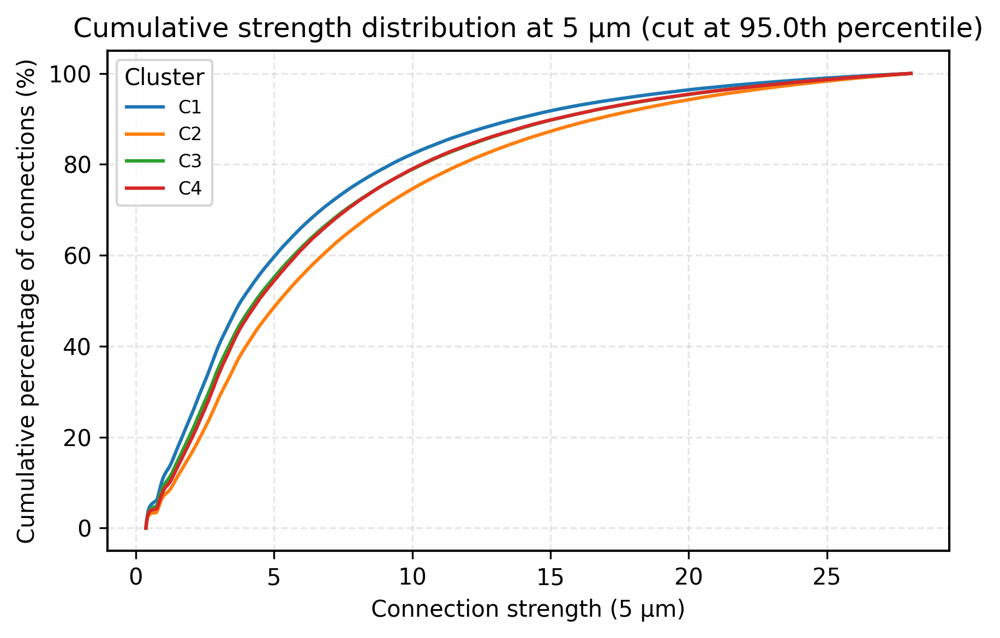

In [31]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 1. 读数据 & 基本信息 =====
with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_use  = 5          # 5 µm
unique_cls = np.unique(labels)      # 之前 UMAP + 聚类得到的 labels / names
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# ===== 2. 按 cluster 收集 5µm 的所有非零权重 =====
weights_by_cluster = {c: [] for c in unique_cls}

for r, c in zip(names, labels):
    sc = np.asarray(results_all[param_use][r]["sc"], float)  # 5 µm 下的连接矩阵
    w  = sc.ravel()
    w  = w[w > 0]   # 只保留非零边
    if w.size:
        weights_by_cluster[c].append(w)

for c in unique_cls:
    if weights_by_cluster[c]:
        weights_by_cluster[c] = np.concatenate(weights_by_cluster[c])
    else:
        weights_by_cluster[c] = np.array([])

# ===== 3. 全局长尾截断（统一一个上限，方便比较）=====
q_tail = 0.95
all_w  = np.concatenate([w for w in weights_by_cluster.values() if w.size])
cut    = np.quantile(all_w, q_tail)

for c in unique_cls:
    w = weights_by_cluster[c]
    weights_by_cluster[c] = w[(w > 0) & (w <= cut)]

# ===== 4. 在同一张图里画 4 条 ECDF 曲线 =====
plt.figure(figsize=(6, 4))

for c in unique_cls:
    w = weights_by_cluster[c]
    if w.size == 0:
        continue

    w_sorted = np.sort(w)
    n        = len(w_sorted)
    cum_pct  = np.arange(1, n + 1) / n * 100  # 0–100%

    plt.plot(
        w_sorted, cum_pct,
        color=cluster_col[c],
        linewidth=1.5,
        label=f"C{int(c)}"
    )

plt.xlabel("Connection strength (5 µm)")
plt.ylabel("Cumulative percentage of connections (%)")
plt.title(f"Cumulative strength distribution at 5 µm (cut at {q_tail*100:.1f}th percentile)")
plt.grid(True, linestyle="--", alpha=0.3)
plt.legend(title="Cluster", fontsize=8)
plt.tight_layout()
plt.savefig(f"8.cluster_strength_cum_5um.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 读数据（5 µm, thr="0"）=====
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]

param_use = 5
thr_use   = "0"
res5      = results_all[param_use]   # dict: region -> info

# ==================== 1. 在这里重新生成 names 和 labels ====================

# 你给的 4 个 cluster 顺序
cluster1_names = [
    "FRP",
    "PL",
    "ILA",
    "AId",
    "AIv",
    "ACAd",
    "ACAv",
    "ORBl",
    "ORBvl",
    "ORBm",
    "MOs",
]

cluster2_names = [
    "POST",
    "PRE",
    "ProS",
    "SUB",
    "CA3",
    "PAR",
    "CA1",
    "DG",
]

cluster3_names = [
    "MOp",
    "SSs",
    "SSp-bfd",
    "SSp-m",
    "SSp-n",
    "SSp-ul",
    "RSPd",
    "RSPv",
    "RSPagl",
    "TEa",
    "ENT",
    "VISp",
    "VISa",
    "VISl",
    "VISli",
]

cluster4_names = [
    "VISam",
    "VISpm",
    "VISrl",
    "VISpl",
    "VISpor",
    "VISal",
    "SSp-ll",
    "SSp-tr",
    "AUDp",
    "AUDv",
    "AUDd",
    "AUDpo",
    "PIR",
    "VISC",
    "GU",
    "AIp",
]

# 所有在 pkl 里的 region 名字（过滤掉一些无效区域，按你之前的习惯）
all_regions = sorted(res5.keys())
exclude_regions = {"SSp", "VPL", "PERI", "ECT", "PO", "PR"}  # 你之前过滤的那几个
all_regions = [r for r in all_regions if r not in exclude_regions]

# 按你给的顺序拼起来
custom_order = (
    cluster1_names +
    cluster2_names +
    cluster3_names +
    cluster4_names
)

# 先按自定义顺序挑出“在数据里的”
ordered_names_list = [r for r in custom_order if r in all_regions]

# 如果 pkl 里还有别的区域，但你没在 4 个 cluster 里列出来，就附加在最后（cluster=0）
extra_regions = [r for r in all_regions if r not in ordered_names_list]
if extra_regions:
    print("[WARN] 这些区域在 pkl 里有，但没在 4 个 cluster 里列出，将作为 C0 附加在最后：")
    print(extra_regions)
    ordered_names_list += extra_regions

# 最终用的 names（这个顺序后面你还可以复用）
names = np.array(ordered_names_list, dtype=object)

# 构造 name -> cluster 映射
name_to_cluster = {}
for r in cluster1_names:
    name_to_cluster[r] = 1
for r in cluster2_names:
    name_to_cluster[r] = 2
for r in cluster3_names:
    name_to_cluster[r] = 3
for r in cluster4_names:
    name_to_cluster[r] = 4
for r in extra_regions:
    name_to_cluster[r] = 0  # 没在 4 个列表里的，标成 0 类

labels = np.array([name_to_cluster.get(r, 0) for r in names], dtype=int)

print("最终区域顺序 names =", names)
print("对应 cluster labels =", labels)

# ==================== 2. 一张图画所有 region 的 motif 柱状图 ====================

motif_labels = [f"M{i}" for i in range(1, 14)]
x = np.arange(13)

bar_w   = 0.18
col_real = "#0072B2"  # 蓝
col_mu   = "#E69F00"  # 橙
col_diff = "#009E73"  # 绿

n_reg = len(names)
fig, axes = plt.subplots(
    n_reg, 1,
    figsize=(7, 2.3 * n_reg),
    sharex=True
)

if n_reg == 1:
    axes = [axes]

for idx, ax in enumerate(axes):
    region = names[idx]
    c      = labels[idx]   # cluster 编号

    mr = res5[region]["motif_results"][thr_use]

    real = np.asarray(mr["real_motif"], float)
    mu   = np.asarray(mr["er_mu_eq"],   float)

    # 有些结果可能是长度 14（第 0 个占位），这里切掉第 0 元素
    if real.shape[0] == 14:
        real = real[1:]
    if mu.shape[0] == 14:
        mu = mu[1:]
    if real.shape[0] != 13 or mu.shape[0] != 13:
        ax.set_visible(False)
        continue

    # log2 变换（只对 >0 的做）
    log_real = np.full_like(real, np.nan, dtype=float)
    log_mu   = np.full_like(mu,   np.nan, dtype=float)

    mask_r = real > 0
    mask_m = mu   > 0
    log_real[mask_r] = np.log2(real[mask_r])
    log_mu[mask_m]   = np.log2(mu[mask_m])
    log_diff = log_real - log_mu

    # 三组柱子：real, mu, diff
    ax.bar(x - bar_w, log_real, width=bar_w,
           color=col_real, alpha=0.9,
           label="log2(real)" if idx == 0 else None)
    ax.bar(x,         log_mu,   width=bar_w,
           color=col_mu,   alpha=0.9,
           label="log2(er_mu_eq)" if idx == 0 else None)
    ax.bar(x + bar_w, log_diff, width=bar_w,
           color=col_diff, alpha=0.9,
           label="log2(real) - log2(mu_eq)" if idx == 0 else None)

    ax.axhline(0, color="k", lw=0.8)
    ax.set_ylabel("log2 / diff", fontsize=7)

    # 标题里带上 cluster 编号
    if c == 0:
        ax.set_title(f"{region} (C0)", loc="left", fontsize=8.5)
    else:
        ax.set_title(f"{region} (C{int(c)})", loc="left", fontsize=8.5)

    # 只在最后一行画 x 轴刻度
    if idx == n_reg - 1:
        ax.set_xticks(x)
        ax.set_xticklabels(motif_labels, rotation=45, ha="right", fontsize=8)
    else:
        ax.set_xticks([])
        ax.set_xticklabels([])

# 统一图例放在第一行
axes[0].legend(loc="upper right", fontsize=7)

fig.suptitle(
    f"All regions – log2(real), log2(er_mu_eq) and difference\n(5 µm, thr={thr_use})",
    fontsize=12, y=0.995
)

plt.tight_layout()

# 存成一张 SVG，透明底
fig.savefig(
    "cluster_motif_bar_all_regions.svg",
    bbox_inches='tight',
    dpi=300,
    transparent=True
)

plt.close(fig)

最终区域顺序 names = ['FRP' 'PL' 'ILA' 'AId' 'AIv' 'ACAd' 'ACAv' 'ORBl' 'ORBvl' 'ORBm' 'MOs'
 'POST' 'PRE' 'ProS' 'SUB' 'CA3' 'PAR' 'CA1' 'DG' 'RSPd' 'RSPv' 'RSPagl'
 'TEa' 'ENT' 'SSs' 'MOp' 'SSp-bfd' 'SSp-m' 'SSp-n' 'SSp-ul' 'VISp' 'VISa'
 'VISl' 'VISli' 'VISam' 'VISpm' 'VISrl' 'VISpl' 'VISpor' 'VISal' 'SSp-ll'
 'SSp-tr' 'AUDp' 'AUDv' 'AUDd' 'AUDpo' 'PIR' 'VISC' 'GU' 'AIp']
对应 cluster labels = [1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4]


FRP: 原节点 222, 用 100, 剩节点 83, 原边 343, 剩边 240 (砍掉最弱 30%)


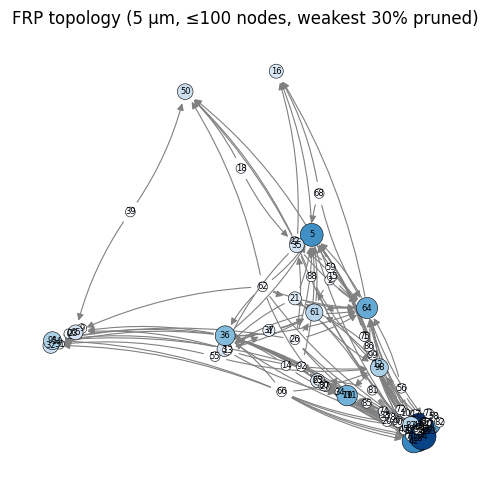

MOp: 原节点 957, 用 100, 剩节点 94, 原边 489, 剩边 342 (砍掉最弱 30%)


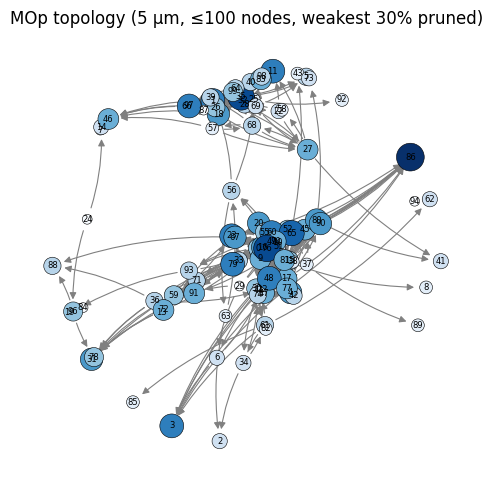

In [13]:
import pickle
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# ========== 1. 读 pkl，拿 5 µm 下的 FRP / MOp ==========

pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_use = 5
res_5um   = results_all[param_use]

A_frp_full = np.asarray(res_5um["FRP"]["sc"], dtype=float)
A_mop_full = np.asarray(res_5um["MOp"]["sc"], dtype=float)


# ========== 2. 子采样 + 去掉最弱若干百分比的边 + 去孤立点 + 画图 ==========

def sample_and_plot_topology(A_full, region_name, n_sample=100, drop_frac=0.1, seed=0):
    """
    A_full: 原始 n x n 加权有向邻接矩阵
    n_sample: 最多保留多少个节点
    drop_frac: 去掉的弱边比例（0.1 = 最弱 10%）
    """
    n_full = A_full.shape[0]
    n_use  = min(n_full, n_sample)

    # ----- 随机子采样节点 -----
    rng = np.random.default_rng(seed)
    idx = rng.choice(n_full, size=n_use, replace=False)
    A   = A_full[np.ix_(idx, idx)]

    # ----- 找非零边，砍掉最弱 drop_frac -----
    src, tgt = np.where(A > 0)
    if src.size == 0:
        print(f"{region_name}: 没有边，画不了。")
        return

    w = A[src, tgt]
    q = np.quantile(w, drop_frac)       # 比如 0.3 → 最弱 30%
    keep = w >= q

    src_keep = src[keep]
    tgt_keep = tgt[keep]

    # ----- 构图 -----
    G = nx.DiGraph()
    G.add_nodes_from(range(n_use))                 # 子采样后的节点编号 0..n_use-1
    G.add_edges_from(zip(src_keep, tgt_keep))

    # 去掉孤立节点
    isolates = [n for n, deg in G.degree() if deg == 0]
    G.remove_nodes_from(isolates)

    print(
        f"{region_name}: 原节点 {n_full}, 用 {n_use}, 剩节点 {G.number_of_nodes()}, "
        f"原边 {len(w)}, 剩边 {G.number_of_edges()} (砍掉最弱 {int(drop_frac*100)}%)"
    )

    if G.number_of_nodes() == 0:
        print(f"{region_name}: 全成孤立点了，图为空。")
        return

    # ======= spring 布局（稍微分散一点）=======
    n_nodes = G.number_of_nodes()
    k = 2.0 / np.sqrt(n_nodes)
    pos = nx.spring_layout(
        G,
        seed=seed,
        k=k,
        iterations=300,
        scale=2.0,
    )

    # ======= 入度控制点大小 & 颜色 =======
    indeg = np.array([d for _, d in G.in_degree()])
    d_min, d_max = indeg.min(), indeg.max()

    # 大小映射到 50–400
    if d_max == d_min:
        node_sizes = np.full_like(indeg, 150, dtype=float)
    else:
        node_sizes = 50 + (indeg - d_min) / (d_max - d_min) * 350

    # 颜色映射到 Blues：入度越大越深
    cmap = plt.cm.Blues
    if d_max == d_min:
        norm_deg = np.ones_like(indeg, dtype=float)
    else:
        norm_deg = (indeg - d_min) / (d_max - d_min)
    node_colors = [cmap(x) for x in norm_deg]

    # ----- 画图 -----
    plt.figure(figsize=(5, 5))
    ax = plt.gca()
    ax.set_axis_off()

    nx.draw_networkx_edges(
        G, pos,
        arrowstyle='-|>',
        arrowsize=10,
        edge_color="0.5",
        width=0.8,
        connectionstyle="arc3,rad=0.1",
    )

    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,    # ✅ 颜色体现入度
        node_size=node_sizes,      # ✅ 大小也体现入度
        edgecolors="black",
        linewidths=0.4,
    )

    labels = {nid: str(nid) for nid in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=6)

    plt.title(
        f"{region_name} topology (5 µm, ≤{n_sample} nodes, "
        f"weakest {int(drop_frac*100)}% pruned)"
    )
    plt.tight_layout()
    plt.show()


# ========== 3. 画 FRP 和 MOp（各最多 100 个节点） ==========

sample_and_plot_topology(A_frp_full, "FRP", n_sample=100, drop_frac=0.3, seed=0)
sample_and_plot_topology(A_mop_full, "MOp", n_sample=100, drop_frac=0.3, seed=1)

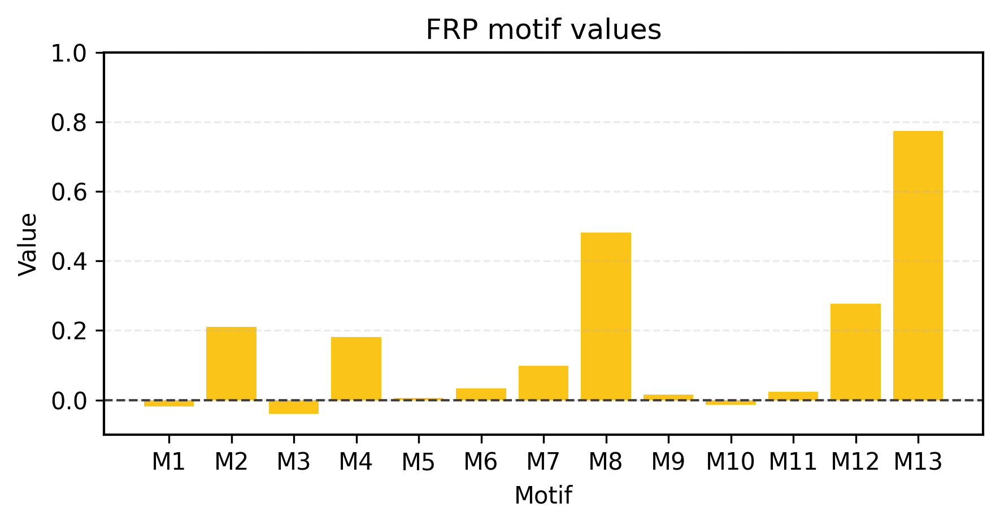

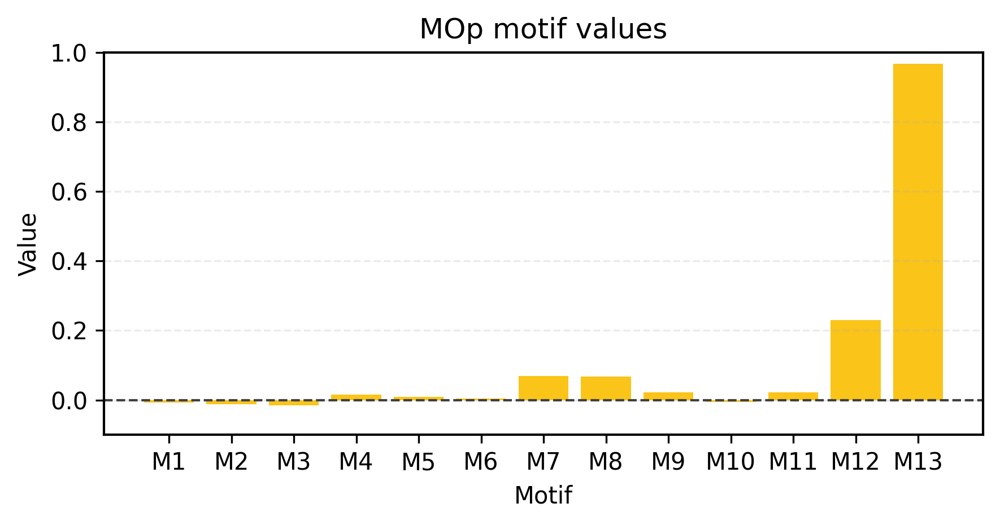

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ===== 全局论文风格 =====
mpl.rcParams.update({
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.size": 10,
    "axes.linewidth": 1.0,
})

# ===== 数据 =====
MOp = np.array([
    -0.00722737, -0.01273873, -0.01561858,  0.01562969,  0.00866638,
     0.00402705,  0.06961442,  0.06682548,  0.02137642, -0.00520205,
     0.02198735,  0.23077471,  0.96730022
], dtype=float)

FRP = np.array([
    -0.01928962,  0.20980253, -0.03922592,  0.1819576 ,  0.00601686,
     0.03389555,  0.09883095,  0.48222753,  0.01604604, -0.01396816,
     0.02385361,  0.2778669 ,  0.77410329
], dtype=float)

motif_ids = np.arange(1, 14)
x = np.arange(len(motif_ids))
xticklabels = [f"M{i}" for i in motif_ids]

# ===== 一个统一颜色（你要换就改这里）=====
COL_BAR = "#fabe00"  # 单一颜色

# ===== 统一 y 轴范围 =====
YMIN, YMAX = -0.1, 1.0

# =========================
# 图1：FRP 单独柱状图
# =========================
fig1, ax1 = plt.subplots(figsize=(6.0, 3.2))
ax1.bar(x, FRP, color=COL_BAR, alpha=0.9, linewidth=0)

ax1.set_ylim(YMIN, YMAX)
ax1.axhline(0, color="0.25", lw=1.0, linestyle="--")
ax1.set_xticks(x)
ax1.set_xticklabels(xticklabels)
ax1.set_xlabel("Motif")
ax1.set_ylabel("Value")
ax1.set_title("FRP motif values")
ax1.grid(axis="y", linestyle="--", alpha=0.25)

fig1.tight_layout()
fig1.savefig("FRP_motif_bars_singlecolor.svg", format="svg",
             bbox_inches="tight", transparent=True)
plt.show()

# =========================
# 图2：MOp 单独柱状图
# =========================
fig2, ax2 = plt.subplots(figsize=(6.0, 3.2))
ax2.bar(x, MOp, color=COL_BAR, alpha=0.9, linewidth=0)

ax2.set_ylim(YMIN, YMAX)
ax2.axhline(0, color="0.25", lw=1.0, linestyle="--")
ax2.set_xticks(x)
ax2.set_xticklabels(xticklabels)
ax2.set_xlabel("Motif")
ax2.set_ylabel("Value")
ax2.set_title("MOp motif values")
ax2.grid(axis="y", linestyle="--", alpha=0.25)

fig2.tight_layout()
fig2.savefig("MOp_motif_bars_singlecolor.svg", format="svg",
             bbox_inches="tight", transparent=True)
plt.show()